# 520 Project 

### By
### - Kush Jayank Pandya kp1127
###    - Dwijesh Shah ds1991
###    - Haarika Ambati ha539

In [1]:
#importing libraries
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns
import time
from heapq import heappush, heappop, heapify
import pandas as pd

In [2]:
cost = 1
blocked = 0
unblocked = 2

In [3]:
size_of_matrix = int(input("Input the size - "))

In [4]:
"""
Create a matrix of ones with size (n+2 x n+2),
where first and last rows and columns will be padded with zeros i.e. boundry of the maze.
"""
def create_arrar(size_of_matrix):
    size_of_matrix = size_of_matrix
    Environment = np.ones((size_of_matrix, size_of_matrix))
    Environment = np.pad(Environment, [(1, 1), (1, 1)], mode='constant')

    return Environment


In [5]:
"""
Creation of environment i.e. maze with 30% of probability marked as blocked and 70% of probability marked as unblocked starting from random starting point.
"""
def create_environment(Environment,i,j,size_of_matrix):
  
    first_iter = True
    Environment[(i,j)] = 2
    stack = [(i,j)]
    visited = set()
    
    while stack:
        
        vertex = stack.pop()
        if vertex in visited:
            continue
        
        a,b = vertex
        if first_iter == False:
            Environment[a,b] =  int(np.random.choice([0, 2], size=(1,1), p=[0.3, 0.7]))
        else:
            first_iter = False
        
        
        visited.add(vertex)
        children = [ (a+1,b) ,(a-1,b) ,(a,b-1) ,(a,b+1) ]
        np.random.shuffle(children)
        children = [(x,y) for (x,y) in children if x > 0 and y> 0 and x < size_of_matrix + 1 and y < size_of_matrix + 1]

        for (a,b) in children:
            stack.append((a,b))

    return Environment


In [6]:
"""
Random start and target points
"""
def create_start_end_points(Environment,size_of_matrix):
    i,j = 0,0  #always blocked cell
    while Environment[i,j] == 0:
        (i,j) = (random.randint(a = 1, b = size_of_matrix),random.randint(a = 1, b = size_of_matrix))
    Environment[i,j] = 3
    start_point = (i,j)

    i,j = 0,0  #always blocked cell
    while Environment[i,j] == 0:
        (i,j) = (random.randint(a = 1, b = size_of_matrix),random.randint(a = 1, b = size_of_matrix))
    Environment[i,j] = 4
    end_point = (i,j)

    Environment[ size_of_matrix +  1, size_of_matrix + 1] = 6


    return (Environment,start_point,end_point)


In [7]:
"""
Generation of 50 gridworlds mazes of specified size
"""
def create_multiple_environments(no_of_environments,size_of_matrix):
    Environment_set = []
    for no in range(no_of_environments):
        array = create_arrar(size_of_matrix)
        (i,j) = (random.randint(a = 1, b = size_of_matrix),random.randint(a = 1, b = size_of_matrix))
        Environment = create_environment(array,i,j,size_of_matrix)
        Environment_plus = create_start_end_points(Environment,size_of_matrix)
        Environment_set.append(Environment_plus)
    
    return Environment_set
  

Environment_set = create_multiple_environments(50,size_of_matrix);

((11, 29), (36, 14))
[[0. 0. 0. ... 0. 0. 0.]
 [0. 2. 2. ... 2. 2. 0.]
 [0. 2. 2. ... 0. 2. 0.]
 ...
 [0. 2. 2. ... 2. 2. 0.]
 [0. 2. 2. ... 2. 2. 0.]
 [0. 0. 0. ... 0. 0. 6.]]


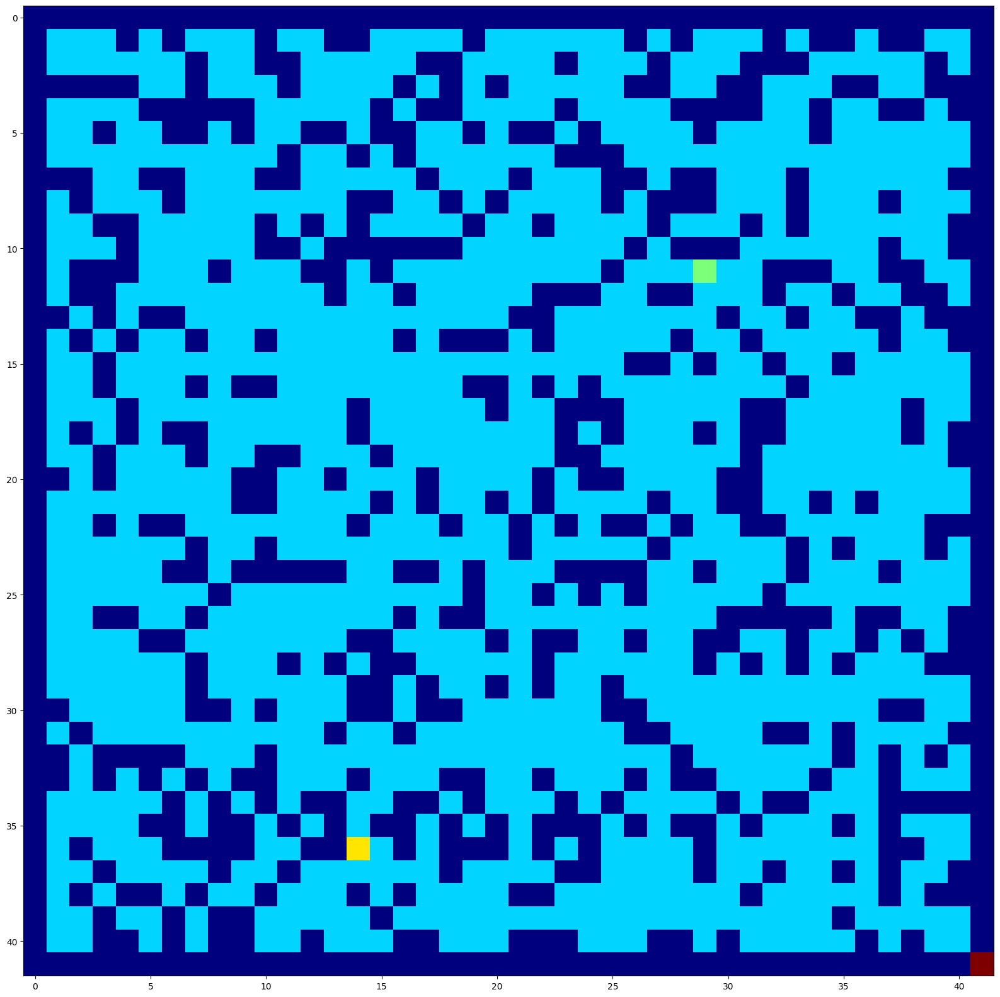

In [8]:
env_plus = Environment_set[38]
plt.figure(figsize = (20,20))
plt.imshow(env_plus[0], cmap='jet', interpolation='none')
print(env_plus[1:3])
print(env_plus[0])
plt.savefig('Grid_example')

## Creating prerequisites for A*

In [9]:
#Heuristic functions implementation


def heuristic_func(H,current_point,end_point):

    end_point_i, end_point_j = end_point
    current_point_i, current_point_j = current_point
    H[current_point_i, current_point_j] = abs( end_point_i  - current_point_i ) + abs( end_point_j  - current_point_j )


def heuristic_maze(size_of_matrix,end_point):

    H = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
    y_temp = [y for y in range(1,size_of_matrix + 1 )]
    x_temp = [x for x in range(1,size_of_matrix + 1)]

    iterable = []

    for x in x_temp:
        for y in y_temp:
            heuristic_func(H,(x,y),end_point)

    return H
    

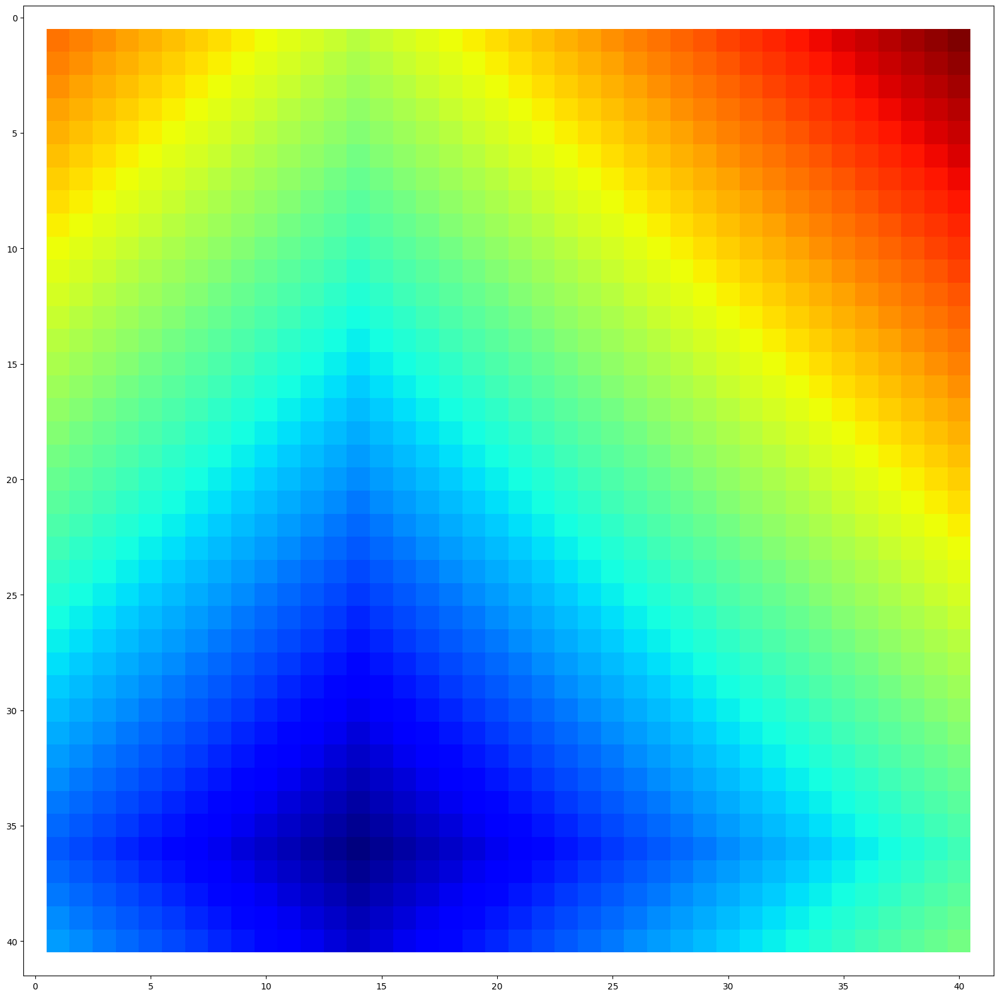

In [10]:
H_temp = heuristic_maze(size_of_matrix,env_plus[2]) 

plt.figure(figsize = (20,20))
plt.imshow(H_temp, cmap='jet', interpolation='none')

In [11]:
"""
Get neighbour values to expand next
"""
def get_neighbours(agent_maze,current_point):
  current_point_i,current_point_j = current_point
  potential_neighbours = [(current_point_i + 1,current_point_j),
                          (current_point_i - 1,current_point_j),
                          (current_point_i,current_point_j + 1),
                          (current_point_i,current_point_j - 1)]
  real_neighbours = []

  for neighbour in potential_neighbours:

    if agent_maze[neighbour] != 0 or neighbour not in closelist:
      real_neighbours.append(neighbour)

  
  return real_neighbours


In [12]:
"""
Step plots to track the movement of agent in the maze
"""
def step_plot(agent_maze,G,start_point,current_point,came_from):

  temp_agent_maze = agent_maze.copy()
  point = current_point
  
  while point != start_point:
    point = came_from[point]
    temp_agent_maze[point] = 5
  
  temp_agent_maze[current_point] = 5
    
  plt.figure(figsize = (20,20))
  fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(30,10))
  fig.suptitle('A* path',fontsize= 30, fontweight='bold')
  ax1.imshow(temp_agent_maze, cmap='jet', interpolation='none')
  ax2.imshow(G, cmap='jet', interpolation='none')
  ax1.set_title('Agent Maze(Knowledge about the real maze as per agent)', fontsize= 15, fontweight='bold')
  ax2.set_title('Expanded cells by A* algorithm',fontsize= 15, fontweight='bold')
  plt.show()

# Implementing A*

In [13]:
"""
A* search algorithm to search the path from start cell to target cell
"""
def a_star(agent_maze,start_point,end_point,H,G,F,G_closed_list):

    came_from = {}
    openlist = []
    closelist = []


    path_found = False
    F[start_point] = H[start_point]
    G[start_point] = 0
    heappush(openlist, (F[start_point],H[start_point], start_point))

    #print(start_point)

    while(openlist):
        
        
        #print("open list -",openlist)
        #############################

        _ , _1 , current_point = heappop(openlist)
        F[current_point] = G[current_point] + H[current_point]
        

        #step_plot(agent_maze,G_closed_list,start_point,current_point,came_from)
        #print("current point -",current_point)
        

        if H[current_point] == 0:
            #print("\n path found Yayyyy!!")
            path_found = True
            G_closed_list[end_point] = G[end_point]
            break

        successors = get_neighbours(agent_maze,current_point)

        for successor_point in successors:
        
            #print(successor_point,end=' - ')

            successor_point_current_cost = G[current_point] + cost

            #print(successor_point_current_cost )

            open_set = [val3 for val1,val2,val3 in openlist]
            if successor_point in open_set:

                if G[successor_point] <= successor_point_current_cost:
                    continue
                else:
                    G[successor_point] = successor_point_current_cost
                    index = openlist.index((F[successor_point], H[successor_point],successor_point))
                    F[successor_point] =  G[successor_point] + H[successor_point]
                    openlist[index] = (F[successor_point], H[successor_point], successor_point)
                    heapify(openlist)
                    came_from[successor_point] = current_point

            elif successor_point in closelist:
                continue

            else:
                G[successor_point] = successor_point_current_cost
                F[successor_point] =  G[successor_point] + H[successor_point]
                heappush(openlist, (F[successor_point], H[successor_point], successor_point))
                came_from[successor_point] = current_point

        

        closelist.append(current_point)
        G_closed_list[current_point] = G[current_point]
        #print("closelist - ",closelist,'\n\n')
        #print(came_from)

    if path_found == False:
        return False

    else:
        return came_from


<Figure size 2000x2000 with 0 Axes>

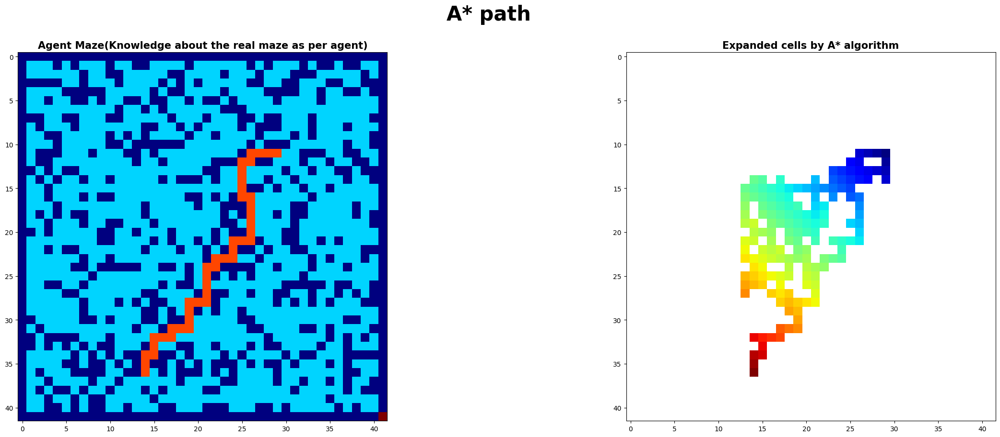

In [14]:
"""
Dry Run: For debugging purposes : visualization
"""
def dummy(env_plus):
    env_plus = env_plus
    env, start_point, end_point = env_plus

    G = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
    G_closed_list = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
    F = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
    H = heuristic_maze(101,end_point)

    agent_maze = np.full((size_of_matrix, size_of_matrix),2)
    agent_maze = np.pad(agent_maze, [(1, 1), (1, 1)], mode='constant')
    agent_maze[start_point] = 3
    agent_maze[end_point] = 4
    agent_maze = env

    came_from = a_star(agent_maze,start_point,end_point,H,G,F,G_closed_list)
    step_plot(agent_maze,G_closed_list,start_point,end_point,came_from)
    #step_plot(agent_maze,G,start_point,end_point,came_from)

dummy(env_plus)

##  A* with tie breaking with smaller G values

In [15]:
"""
A* implementation with lower G as priority
"""
def a_star_small_G_pref(agent_maze,start_point,end_point,H,G,F,G_closed_list):

    came_from = {}
    openlist = []
    closelist = []


    path_found = False
    F[start_point] = H[start_point]
    G[start_point] = 0
    heappush(openlist, (F[start_point],G[start_point], start_point))

    #print(start_point)

    while(openlist):
        
        
        #print("open list -",openlist)
        #############################

        _ , _1 , current_point = heappop(openlist)
        F[current_point] = G[current_point] + H[current_point]
        

        #step_plot(agent_maze,G_closed_list,start_point,current_point,came_from)
        #print("current point -",current_point)
        

        if H[current_point] == 0:
            #print("\n path found Yayyyy!!")
            path_found = True
            G_closed_list[end_point] = G[end_point]
            break

        successors = get_neighbours(agent_maze,current_point)

        for successor_point in successors:
        
            #print(successor_point,end=' - ')

            successor_point_current_cost = G[current_point] + cost

            #print(successor_point_current_cost )

            open_set = [val3 for val1,val2,val3 in openlist]
            if successor_point in open_set:

                if G[successor_point] <= successor_point_current_cost:
                    continue
                else:
                    G[successor_point] = successor_point_current_cost
                    index = openlist.index((F[successor_point], H[successor_point],successor_point))
                    F[successor_point] =  G[successor_point] + H[successor_point]
                    openlist[index] = (F[successor_point], G[successor_point], successor_point)
                    heapify(openlist)
                    came_from[successor_point] = current_point

            elif successor_point in closelist:
                continue

            else:
                G[successor_point] = successor_point_current_cost
                F[successor_point] =  G[successor_point] + H[successor_point]
                heappush(openlist, (F[successor_point], G[successor_point], successor_point))
                came_from[successor_point] = current_point

        

        closelist.append(current_point)
        G_closed_list[current_point] = G[current_point]
        #print("closelist - ",closelist,'\n\n')


    if path_found == False:
        return False

    else:
        return came_from

  

(11, 29)


<Figure size 2000x2000 with 0 Axes>

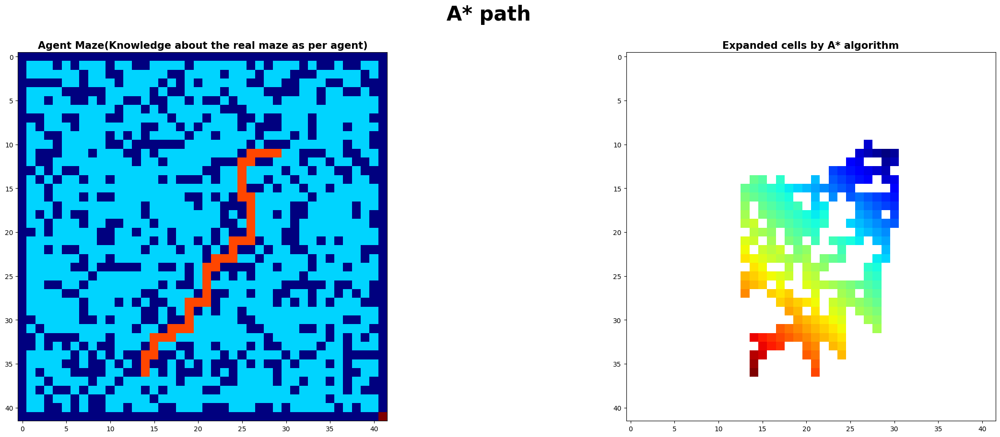

In [16]:
"""
Dry Run: For debugging purposes : visualization
"""
def dummy(env_plus,size_of_matrix):
    env_plus = env_plus
    env, start_point, end_point = env_plus
    print(start_point)

    G = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
    G_closed_list = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
    F = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
    H = heuristic_maze(size_of_matrix,end_point)

    agent_maze = np.full((size_of_matrix, size_of_matrix),2)
    agent_maze = np.pad(agent_maze, [(1, 1), (1, 1)], mode='constant')
    agent_maze[start_point] = 3
    agent_maze[end_point] = 4
    agent_maze = env

    came_from = a_star_small_G_pref(agent_maze,start_point,end_point,H,G,F,G_closed_list)
    step_plot(agent_maze,G_closed_list,start_point,end_point,came_from)

dummy(env_plus,size_of_matrix)


# Repeated forward A*

In [17]:
"""
Get the path for Repeated Forward A*
"""
def get_path(came_from,startpoint,end_point):
  backtracepoint = end_point
  #print('startpoint',startpoint)
  path = []
  while backtracepoint != startpoint:
    #print(backtracepoint)
    path.append(backtracepoint)
    backtracepoint = came_from[backtracepoint]
    
  path.reverse()
  return path



In [18]:
def mapping_func(mapping_point,Environment,agent_maze):

  mapping_point_i,mapping_point_j = mapping_point
  mapping_neighbours = ( (mapping_point_i + 1,mapping_point_j), 
                        (mapping_point_i - 1,mapping_point_j), 
                        (mapping_point_i,mapping_point_j + 1), 
                        (mapping_point_i,mapping_point_j - 1))
  for neighbour in mapping_neighbours:
    agent_maze[neighbour] = Environment[neighbour]
  

In [19]:
'''
Plots the real environment and maze environment for every step of agent
'''

def path_step_plot(agent_maze,current_point,counter,type_,Environment,H,G_closed_list,path):

  temp_agent_maze = agent_maze.copy()
  Environment_copy = Environment.copy()


  for point in path:
    temp_agent_maze[point] = 3.5


  temp_agent_maze[current_point] = 5
  Environment_copy[current_point] = 5
  
    
  if type_ == 'repeated':
    plt.figure(figsize = (20,20))
    fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(30,10))
    fig.suptitle(f'Agent step {counter}',fontsize= 15, fontweight='bold')
    ax1.imshow(temp_agent_maze, cmap='jet', interpolation='none')
    ax2.imshow(Environment_copy, cmap='jet', interpolation='none')
    ax1.set_title('Agent Maze(Knowledge about the real maze as per agent)', fontsize= 15, fontweight='bold')
    ax2.set_title('Real Maze',fontsize= 15, fontweight='bold')


  elif type_ == 'adaptive':
    plt.figure(figsize = (20,20))
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4,figsize=(30,10))
    fig.suptitle(f'Agent step {counter}',fontsize= 15, fontweight='bold')
    ax1.imshow(temp_agent_maze, cmap='jet', interpolation='none')
    ax2.imshow(Environment_copy, cmap='jet', interpolation='none')
    im3 = ax3.imshow(H, cmap='jet', interpolation='none')
    plt.colorbar(im3)
    ax3.imshow(H, cmap='jet', interpolation='none')
    ax4.imshow(G_closed_list)
    ax1.set_title('Agent Maze(Knowledge about the real maze as per agent)', fontsize= 15, fontweight='bold')
    ax2.set_title('Real Maze',fontsize= 15, fontweight='bold')
    ax3.set_title('H values',fontsize= 15, fontweight='bold')
    ax4.set_title('Closed list generated for this particular iteration',fontsize= 15, fontweight='bold')


  plt.show()


## Repeated Backward A* 

(array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 2., 2., ..., 2., 2., 0.],
       [0., 2., 2., ..., 0., 2., 0.],
       ...,
       [0., 2., 2., ..., 2., 2., 0.],
       [0., 2., 2., ..., 2., 2., 0.],
       [0., 0., 0., ..., 0., 0., 6.]]), (11, 29), (36, 14))


<Figure size 2000x2000 with 0 Axes>

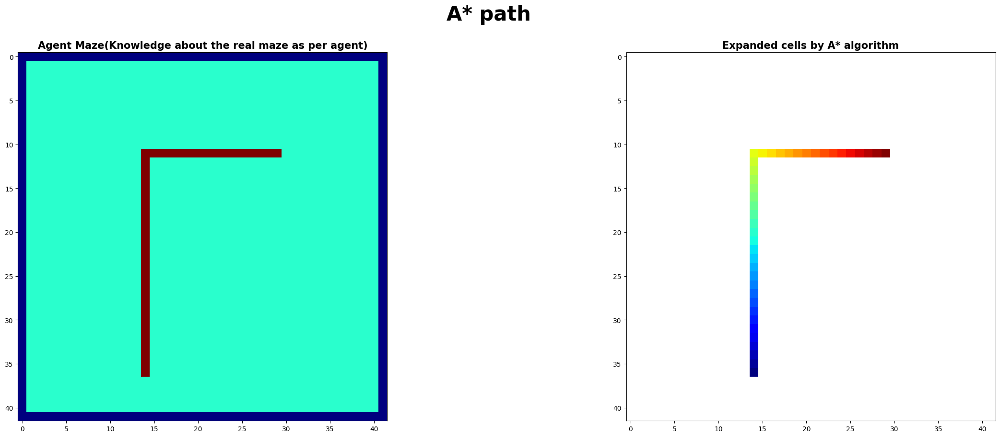

<Figure size 2000x2000 with 0 Axes>

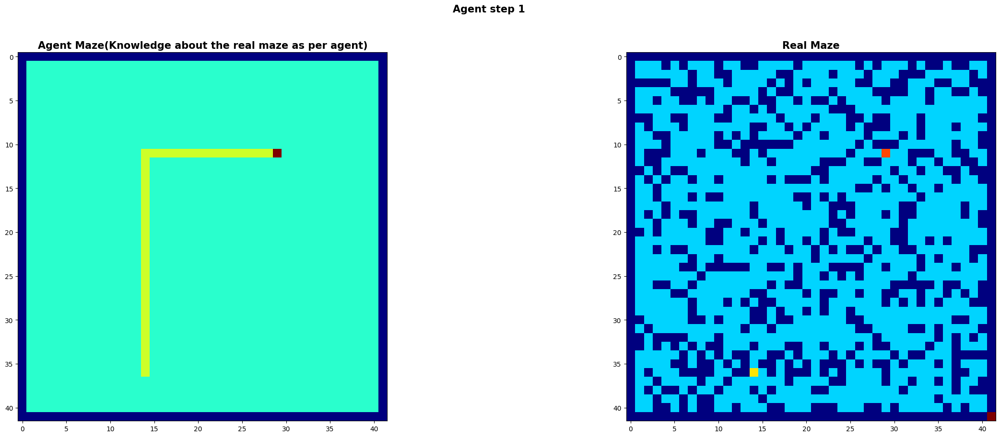

<Figure size 2000x2000 with 0 Axes>

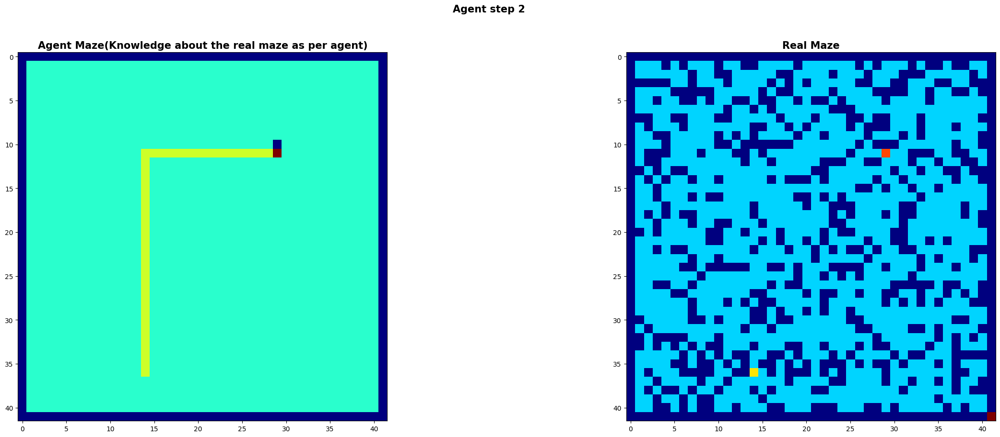

<Figure size 2000x2000 with 0 Axes>

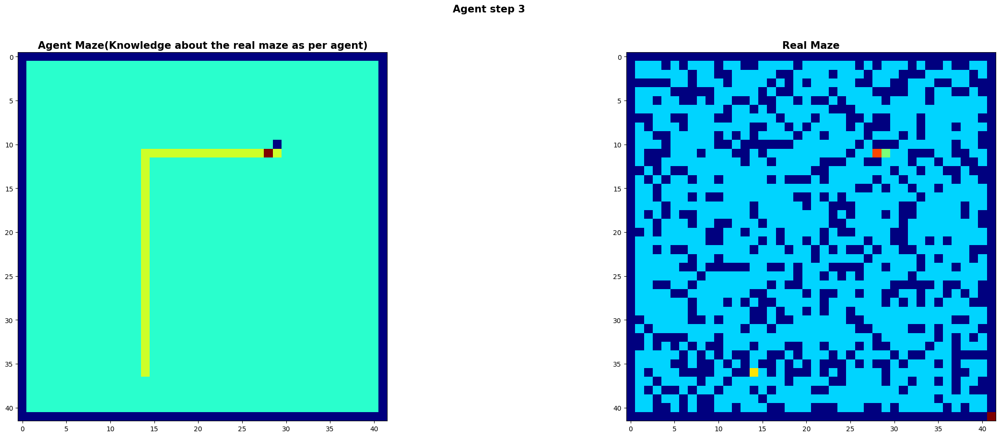

<Figure size 2000x2000 with 0 Axes>

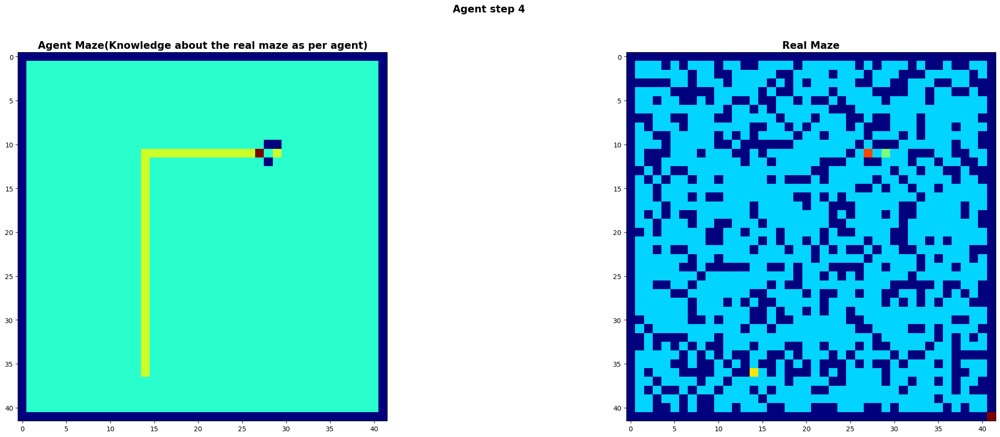

<Figure size 2000x2000 with 0 Axes>

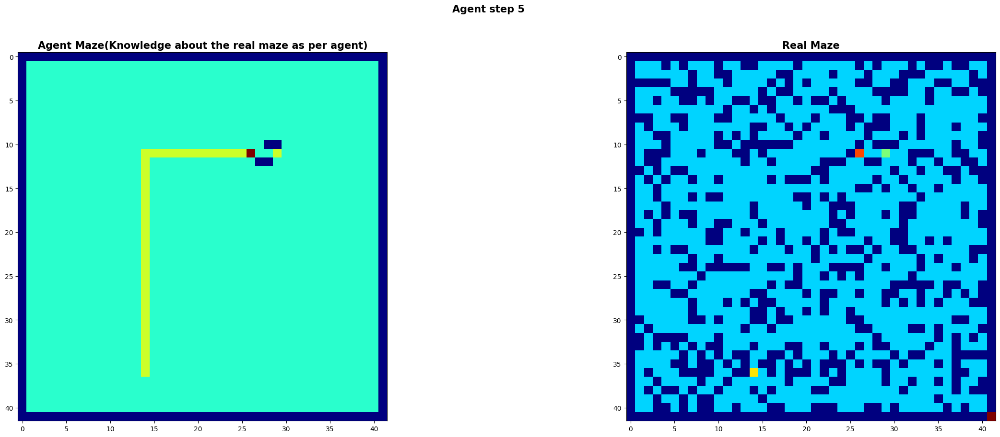

<Figure size 2000x2000 with 0 Axes>

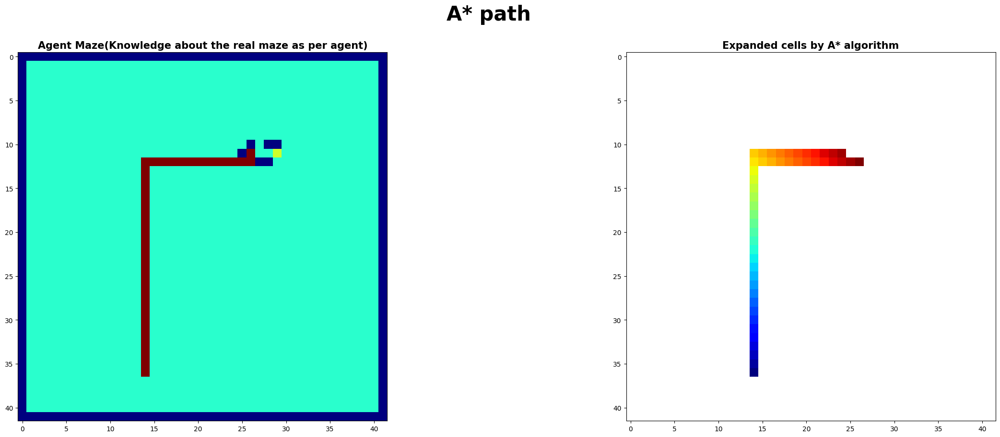

<Figure size 2000x2000 with 0 Axes>

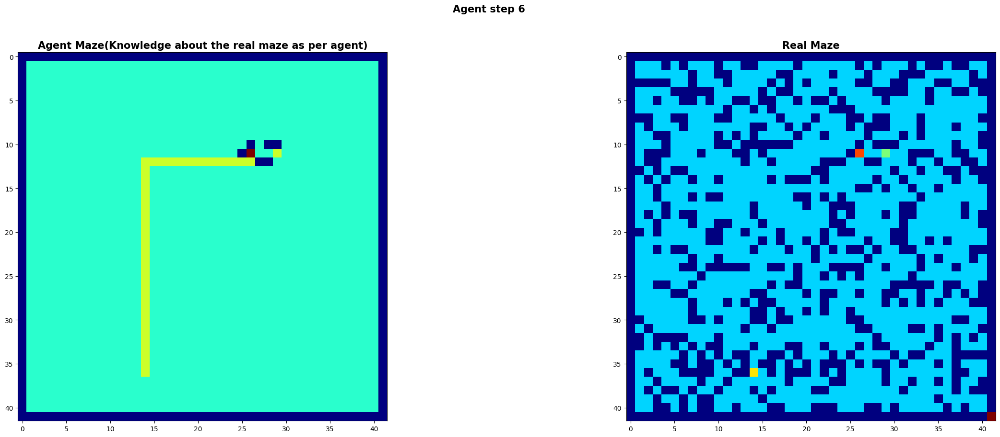

<Figure size 2000x2000 with 0 Axes>

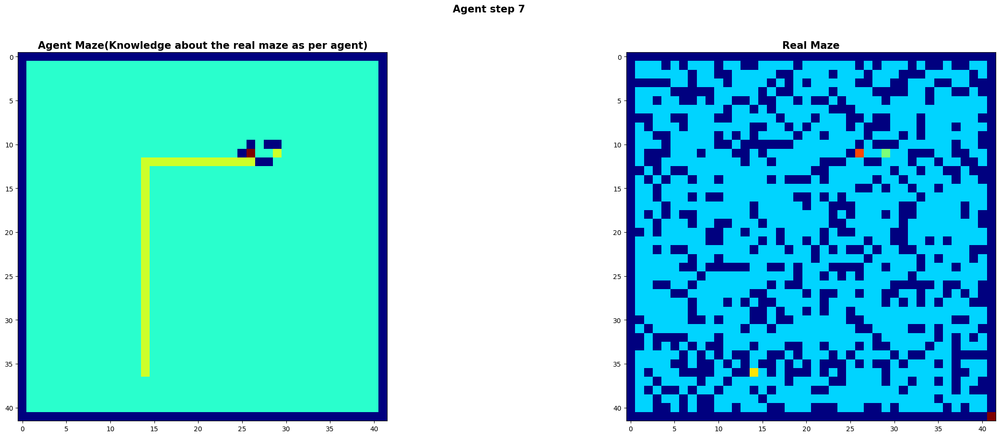

<Figure size 2000x2000 with 0 Axes>

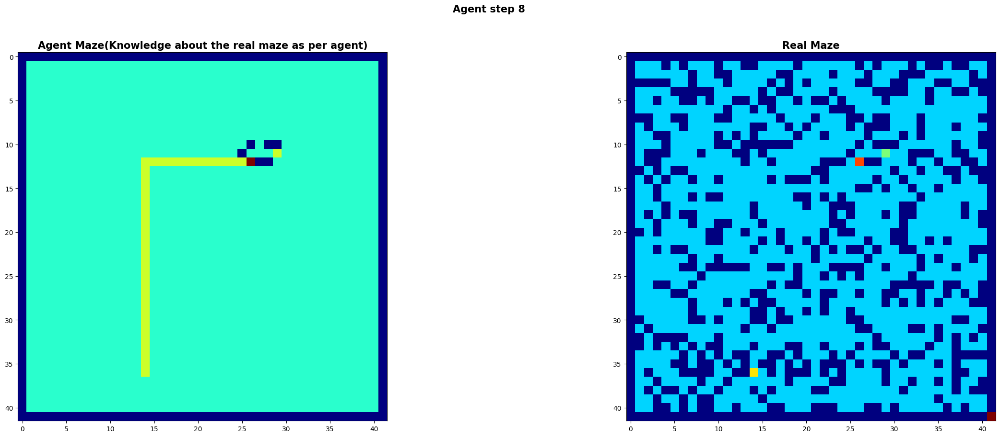

<Figure size 2000x2000 with 0 Axes>

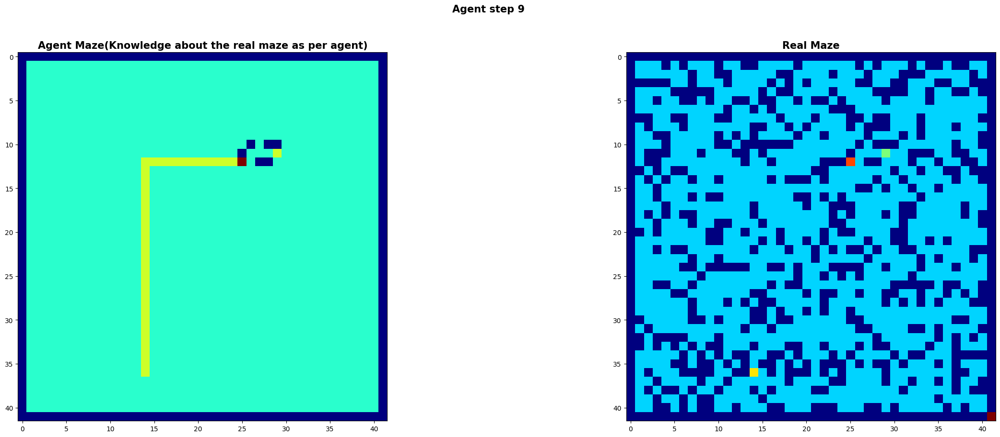

<Figure size 2000x2000 with 0 Axes>

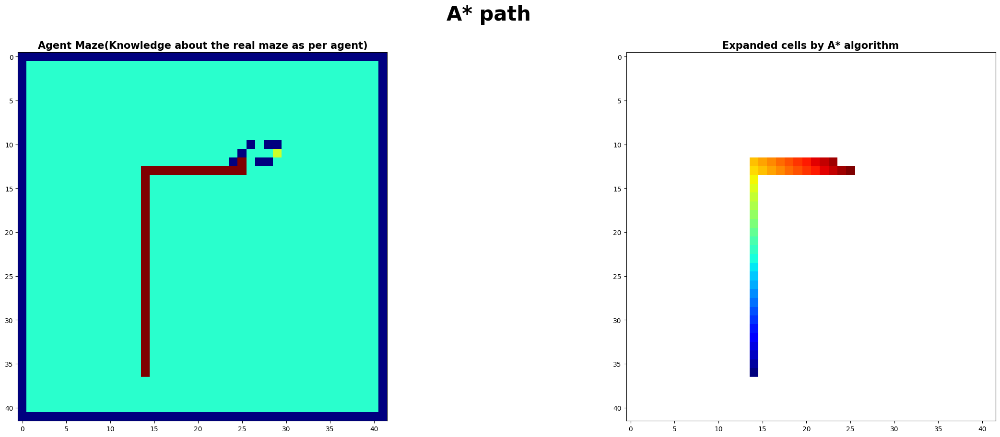

<Figure size 2000x2000 with 0 Axes>

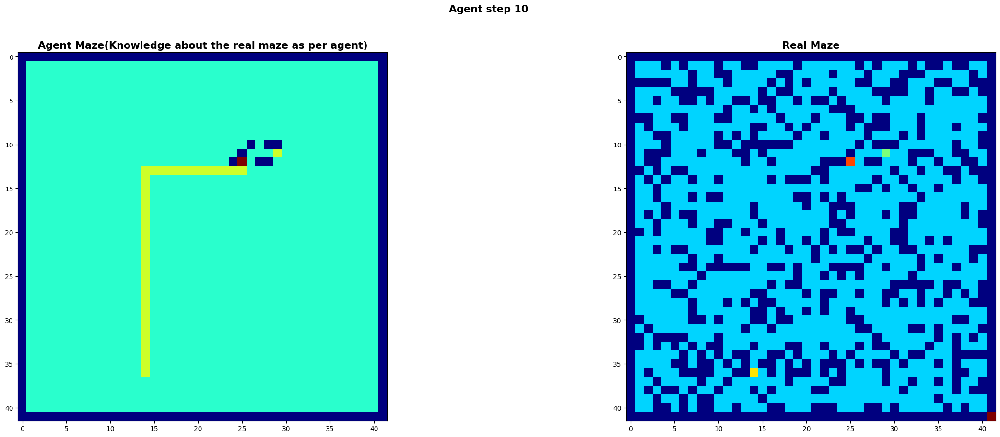

<Figure size 2000x2000 with 0 Axes>

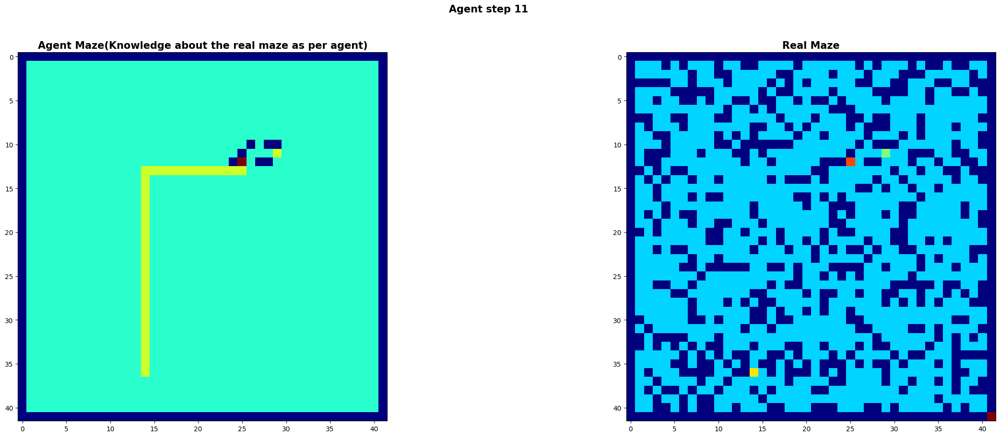

<Figure size 2000x2000 with 0 Axes>

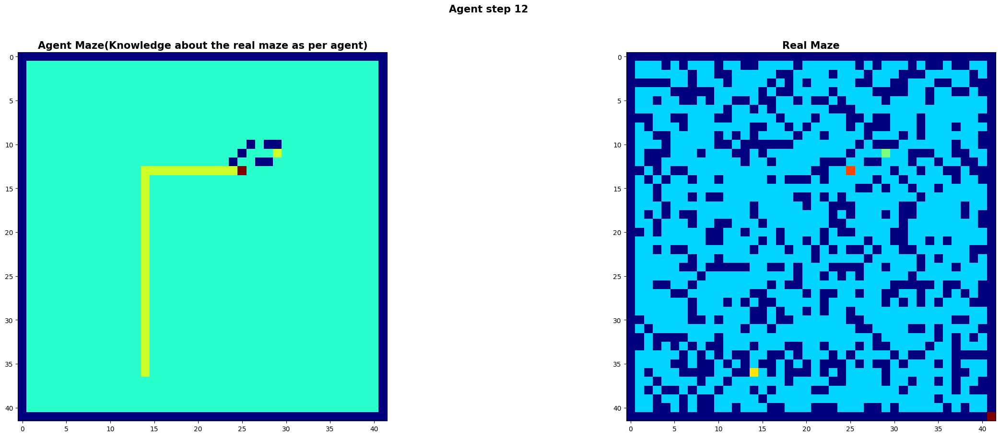

<Figure size 2000x2000 with 0 Axes>

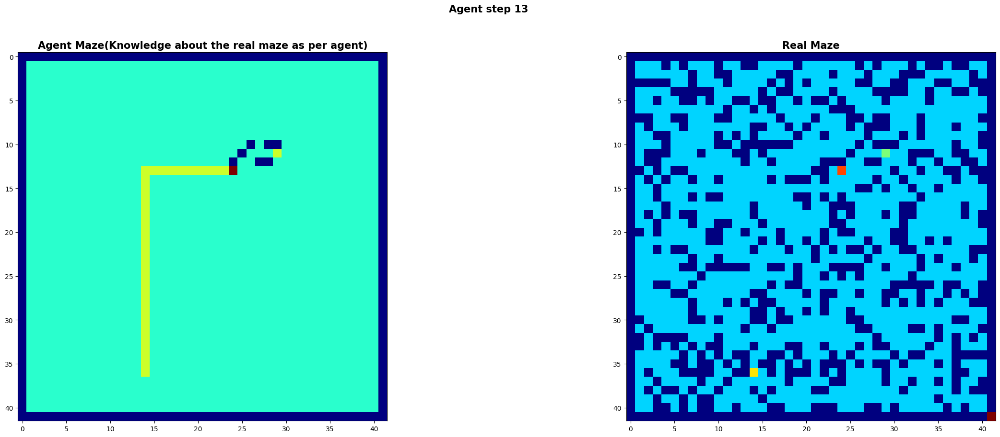

<Figure size 2000x2000 with 0 Axes>

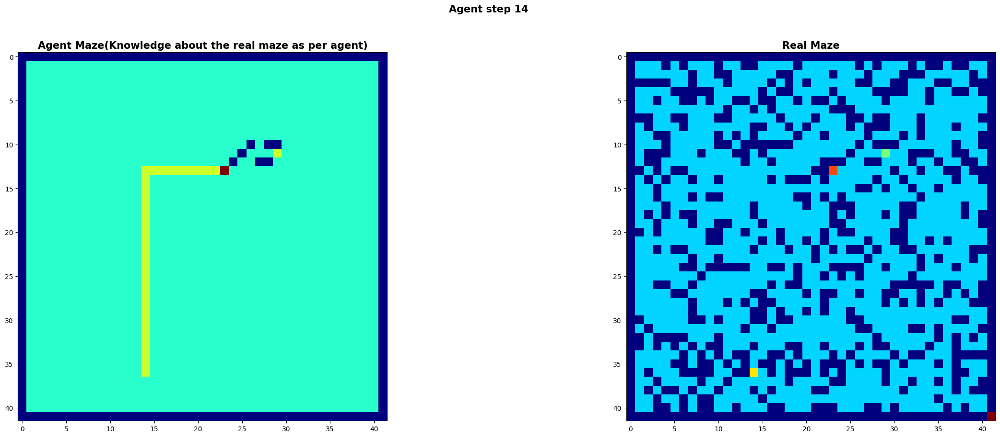

<Figure size 2000x2000 with 0 Axes>

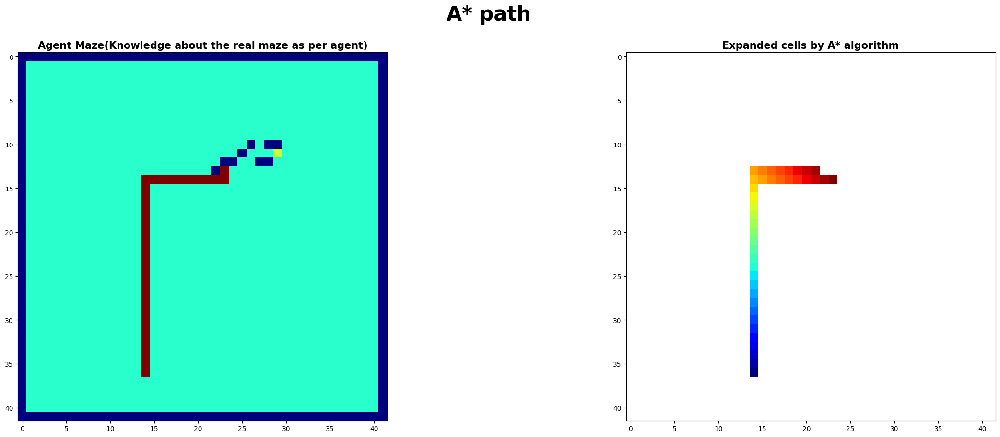

<Figure size 2000x2000 with 0 Axes>

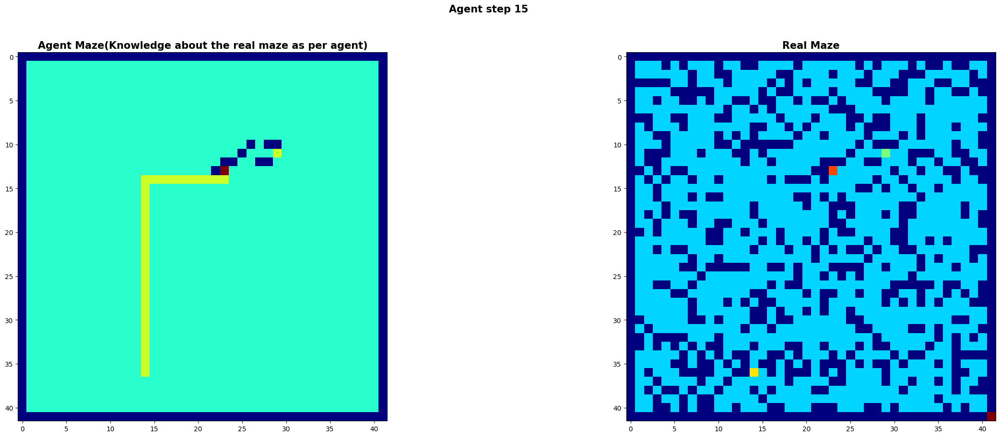

<Figure size 2000x2000 with 0 Axes>

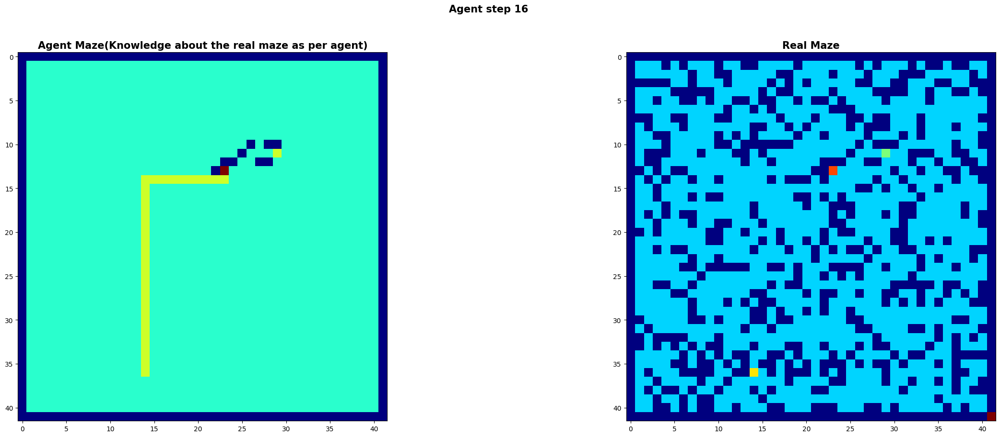

<Figure size 2000x2000 with 0 Axes>

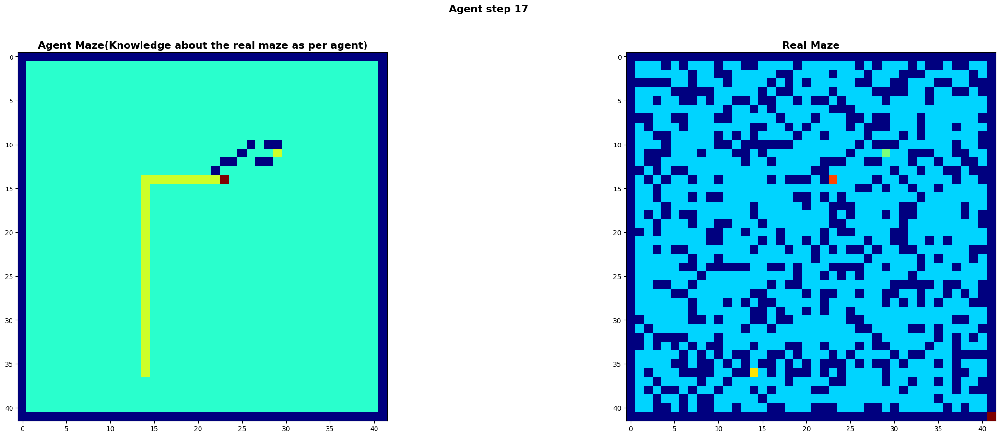

<Figure size 2000x2000 with 0 Axes>

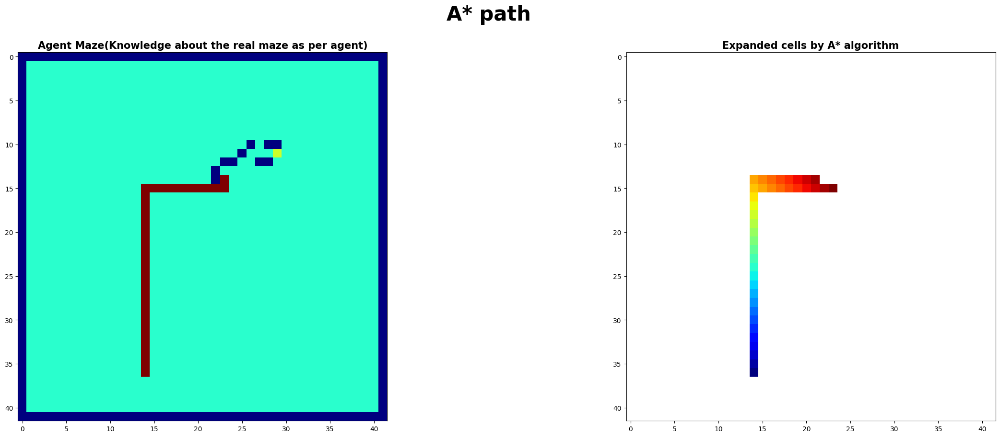

<Figure size 2000x2000 with 0 Axes>

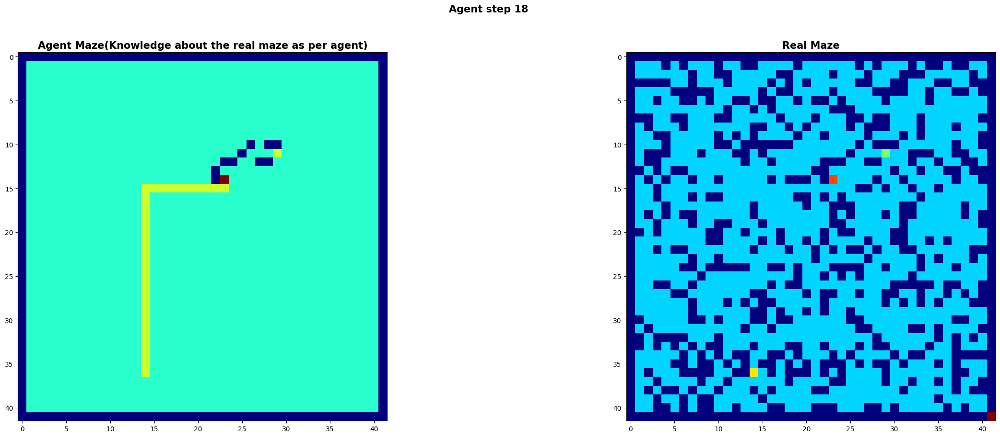

<Figure size 2000x2000 with 0 Axes>

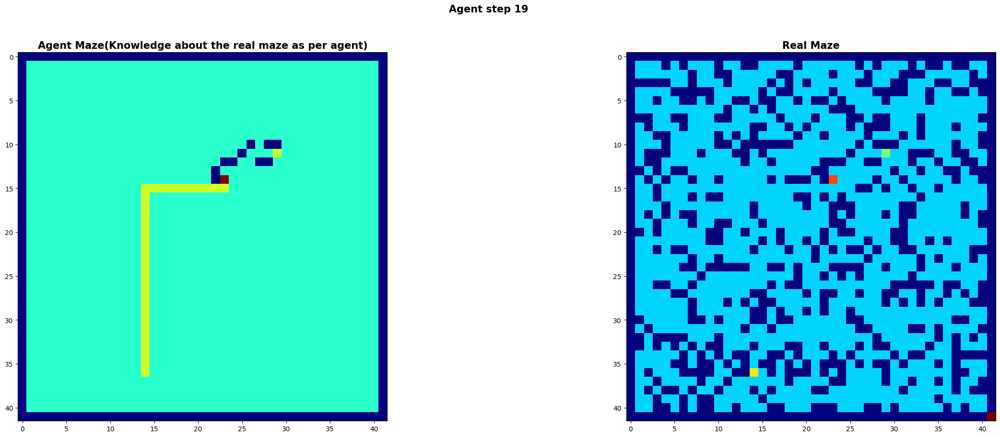

<Figure size 2000x2000 with 0 Axes>

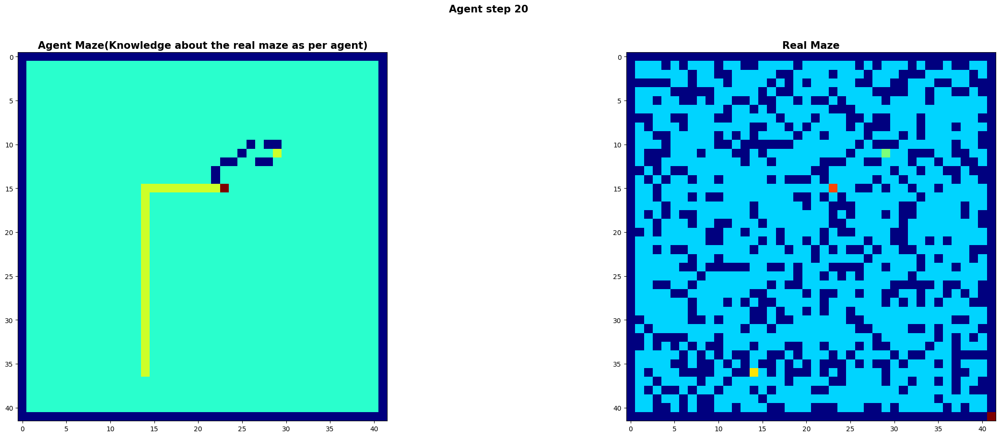

<Figure size 2000x2000 with 0 Axes>

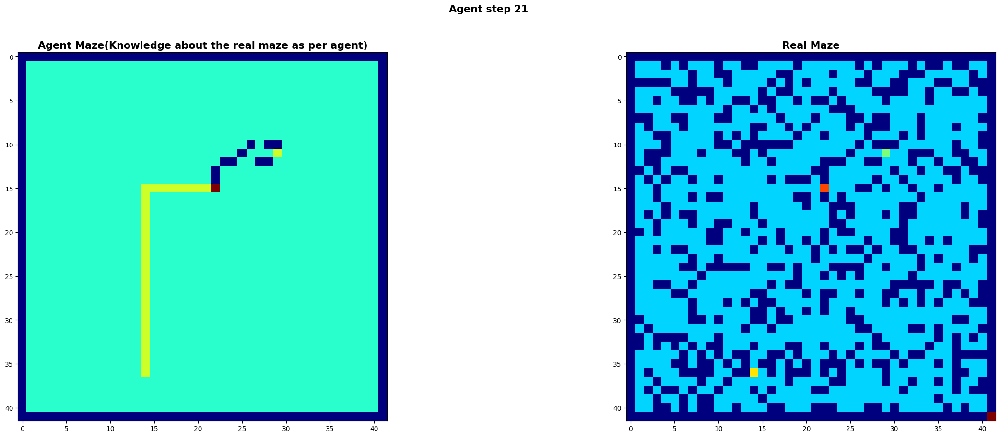

<Figure size 2000x2000 with 0 Axes>

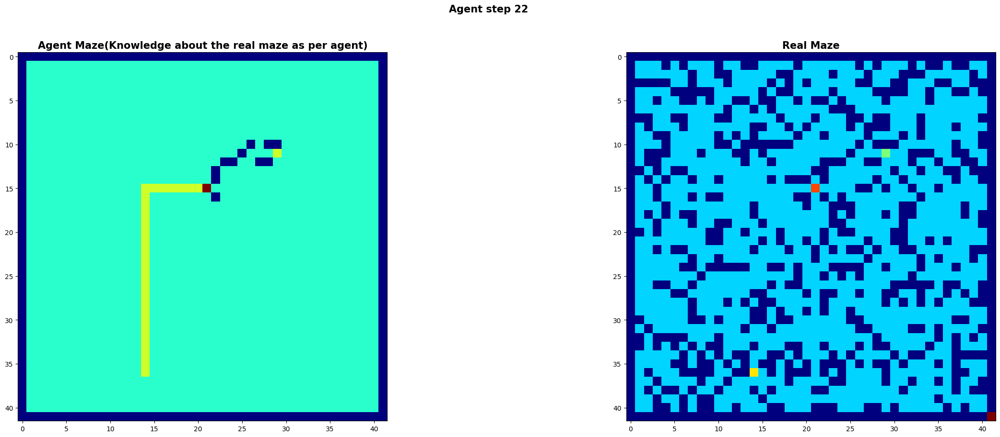

<Figure size 2000x2000 with 0 Axes>

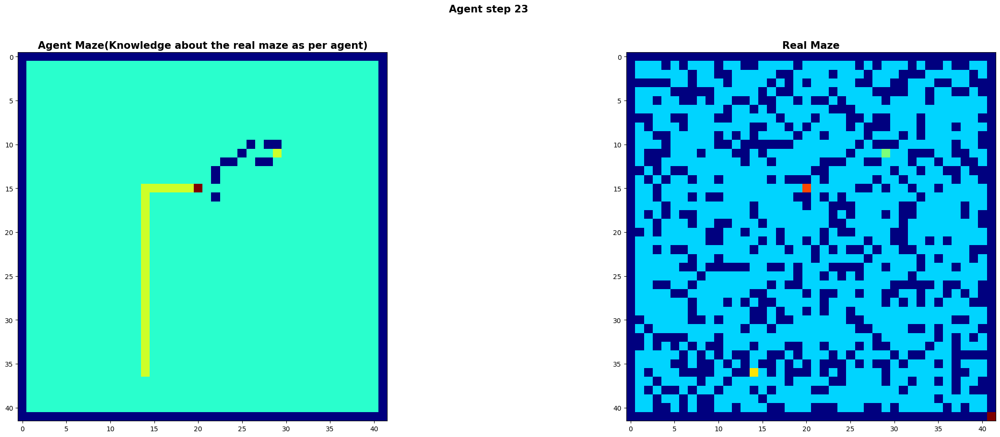

<Figure size 2000x2000 with 0 Axes>

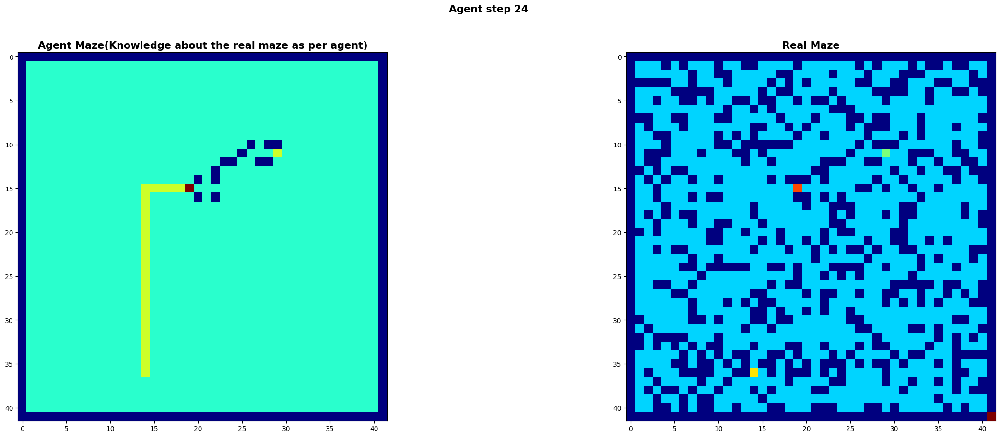

<Figure size 2000x2000 with 0 Axes>

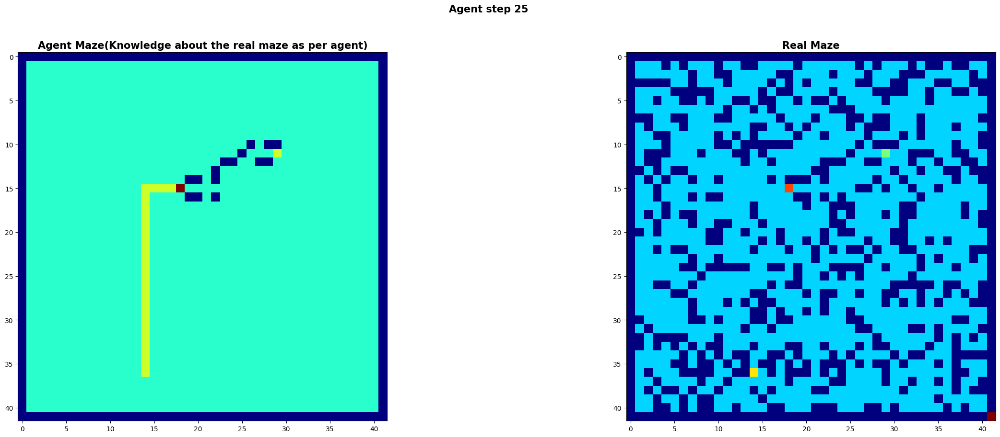

<Figure size 2000x2000 with 0 Axes>

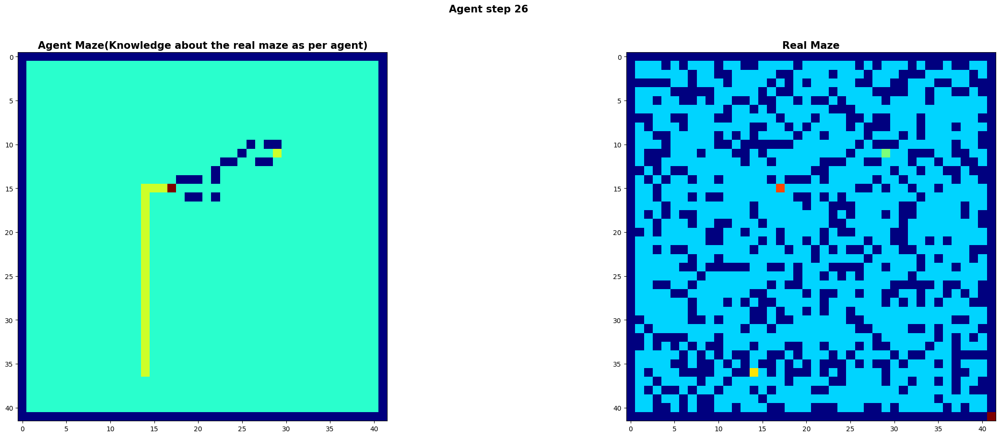

<Figure size 2000x2000 with 0 Axes>

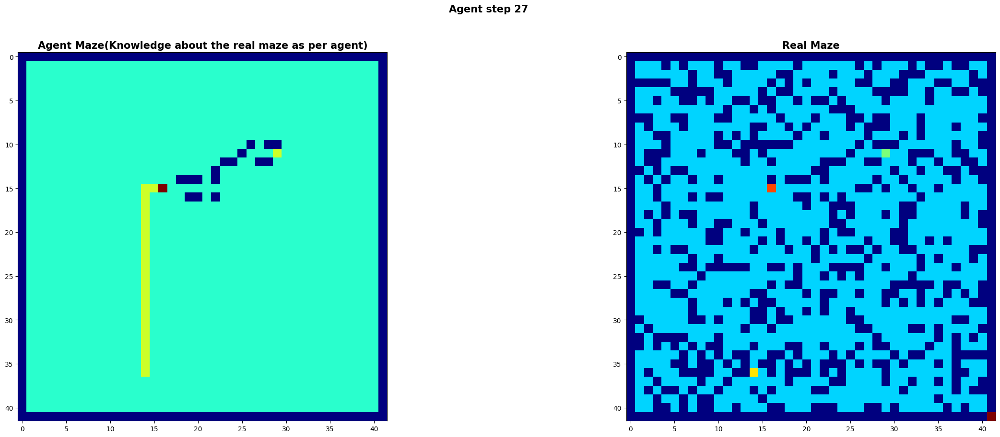

<Figure size 2000x2000 with 0 Axes>

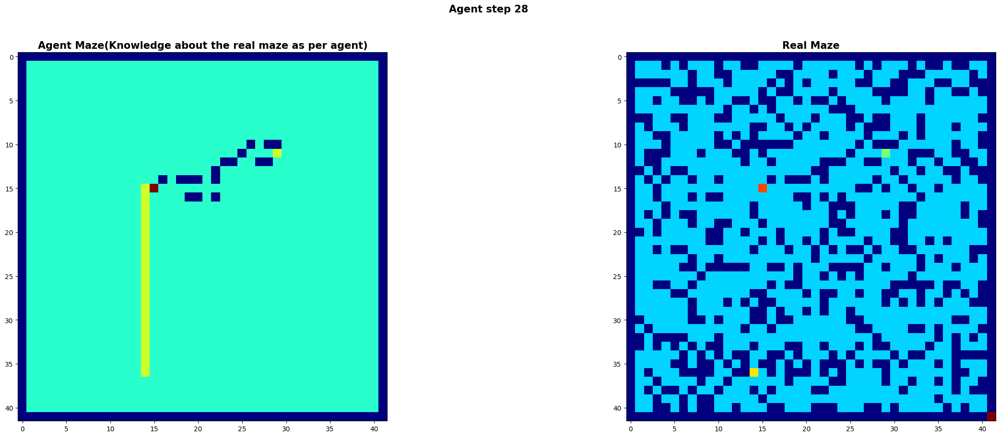

<Figure size 2000x2000 with 0 Axes>

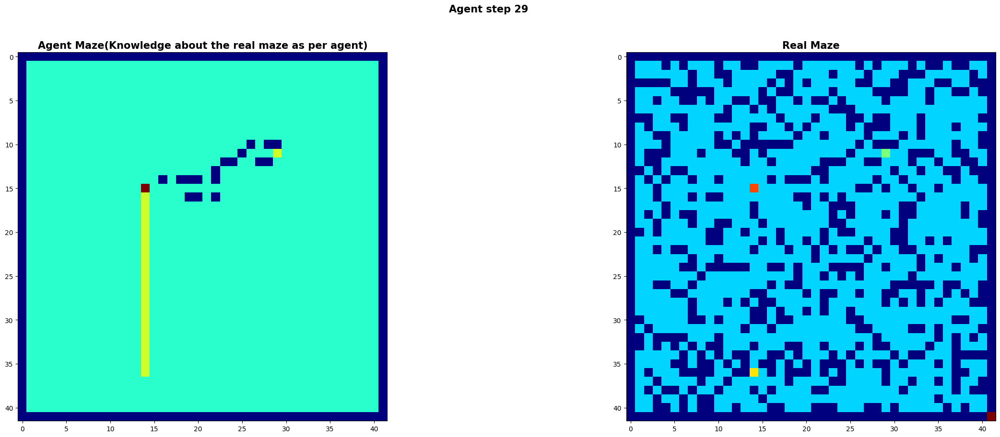

<Figure size 2000x2000 with 0 Axes>

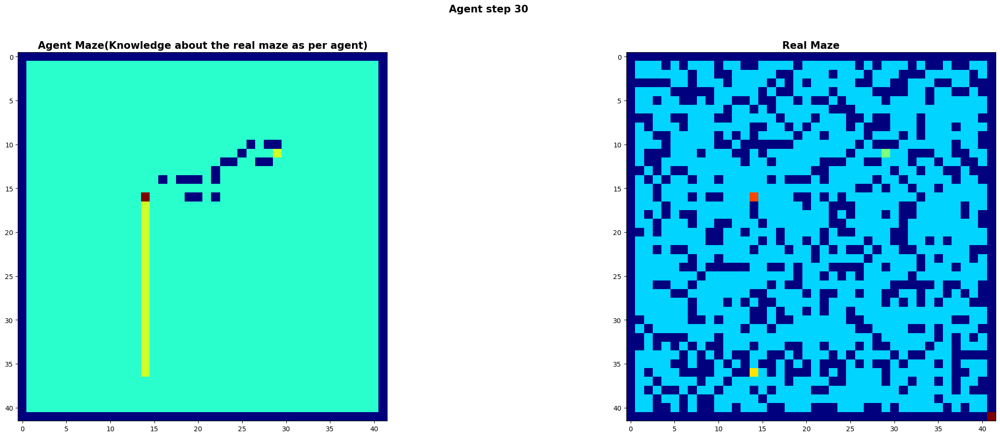

<Figure size 2000x2000 with 0 Axes>

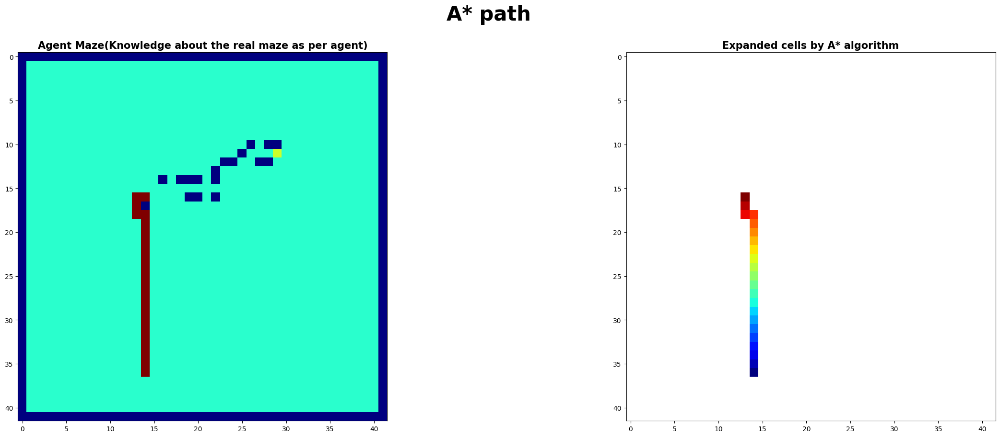

<Figure size 2000x2000 with 0 Axes>

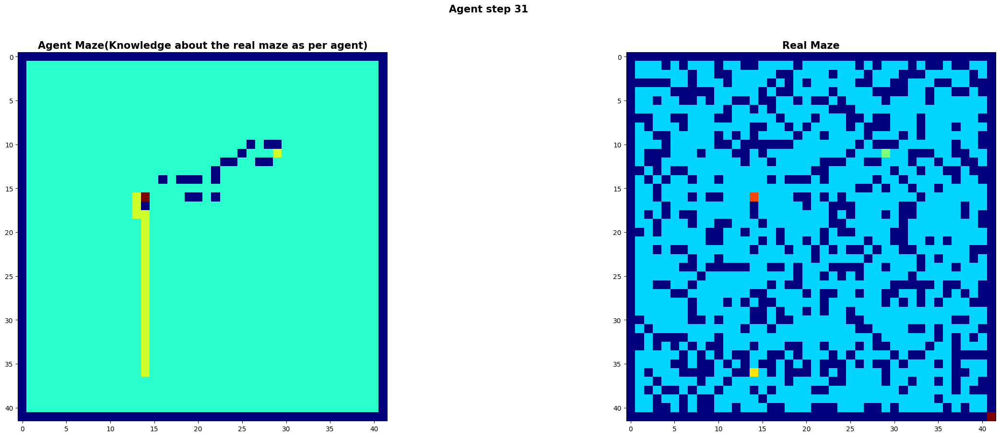

<Figure size 2000x2000 with 0 Axes>

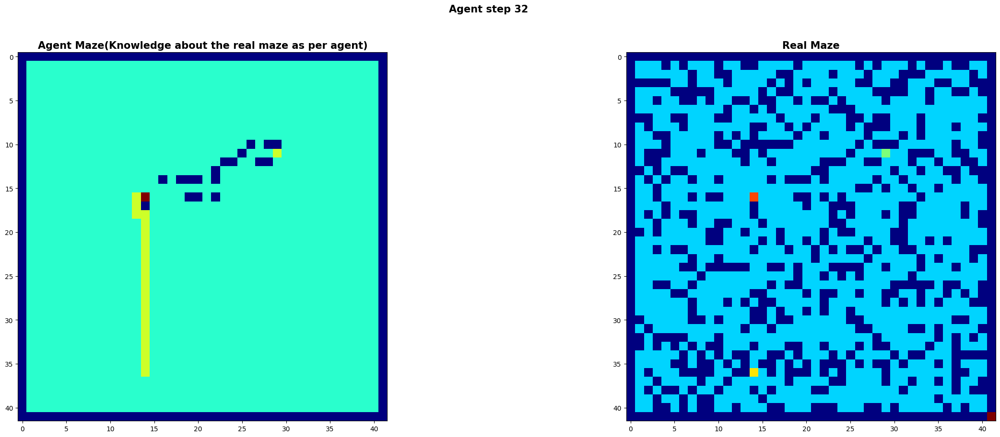

<Figure size 2000x2000 with 0 Axes>

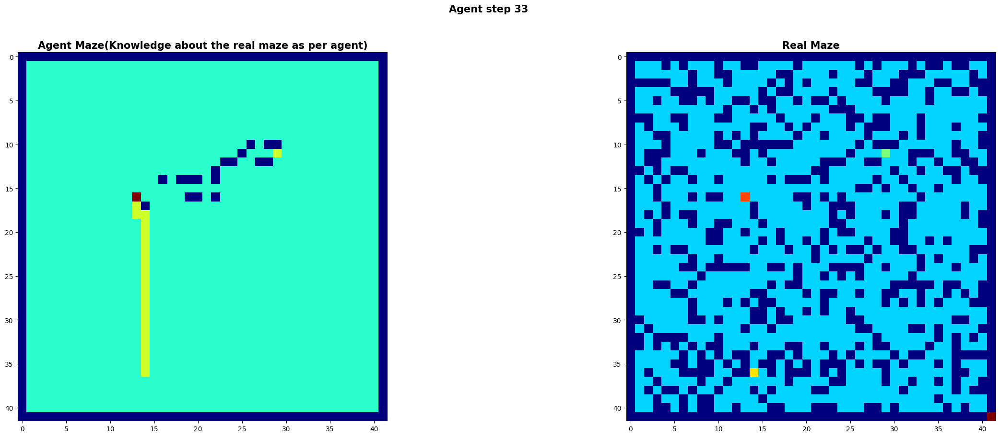

<Figure size 2000x2000 with 0 Axes>

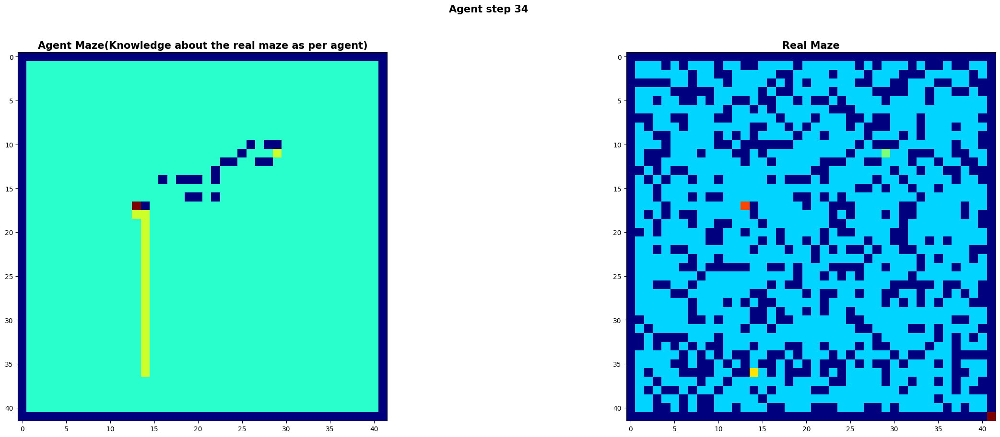

<Figure size 2000x2000 with 0 Axes>

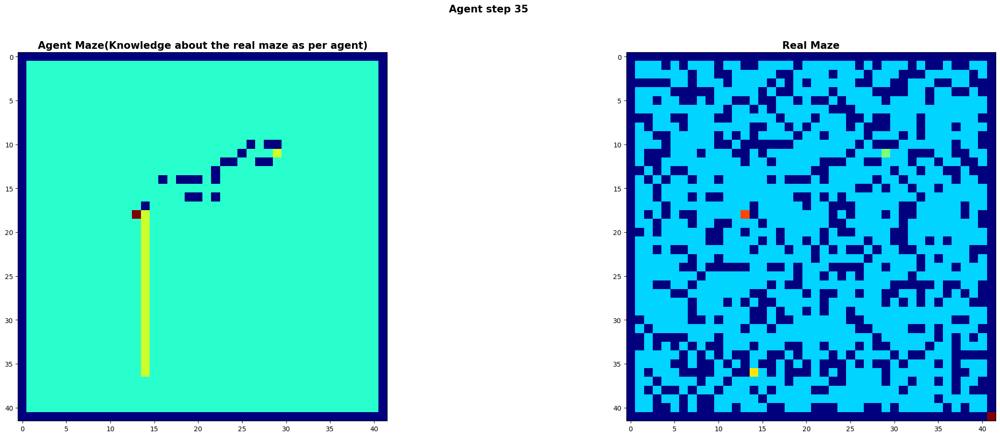

<Figure size 2000x2000 with 0 Axes>

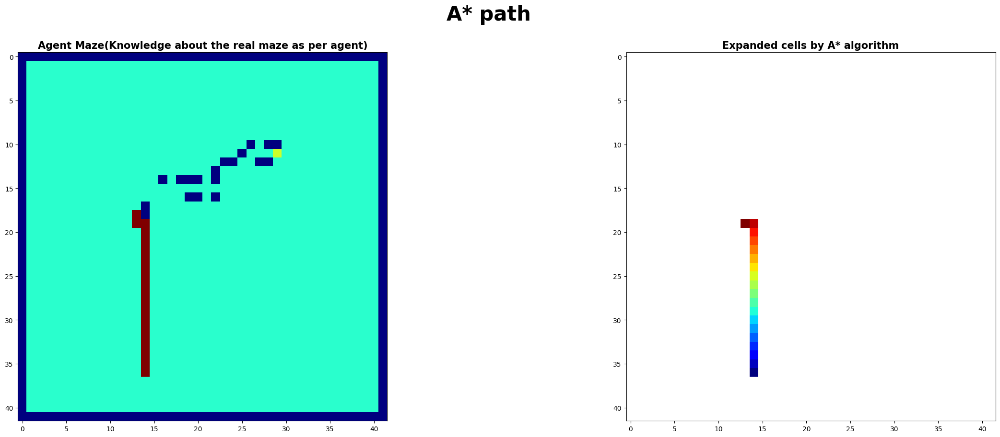

<Figure size 2000x2000 with 0 Axes>

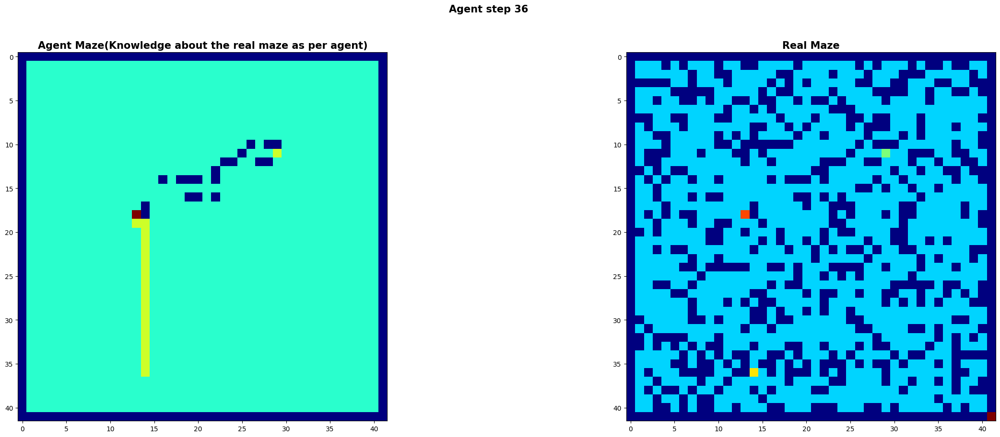

<Figure size 2000x2000 with 0 Axes>

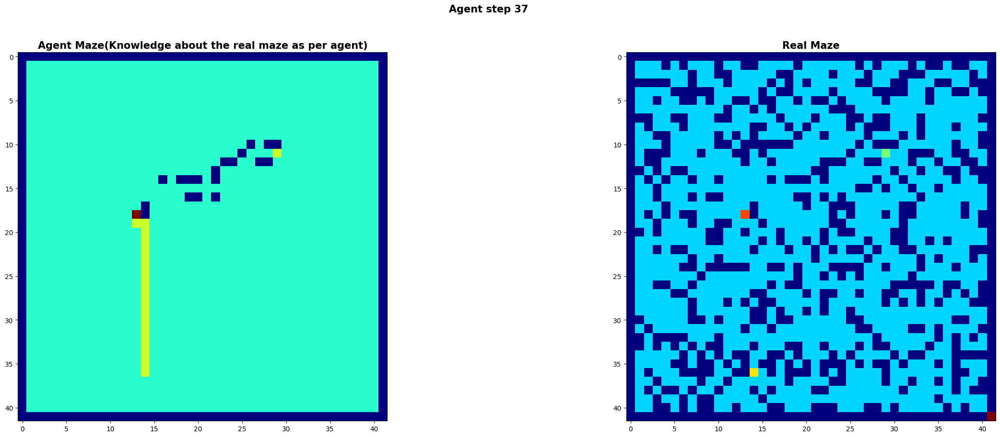

<Figure size 2000x2000 with 0 Axes>

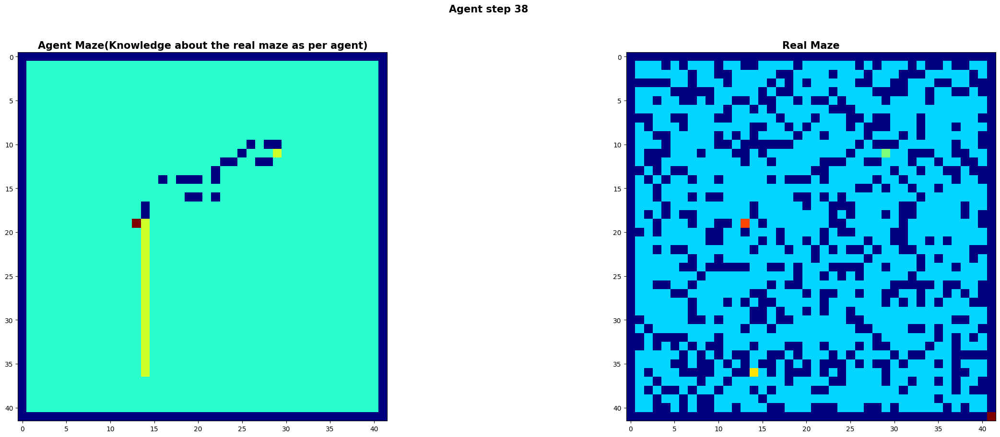

<Figure size 2000x2000 with 0 Axes>

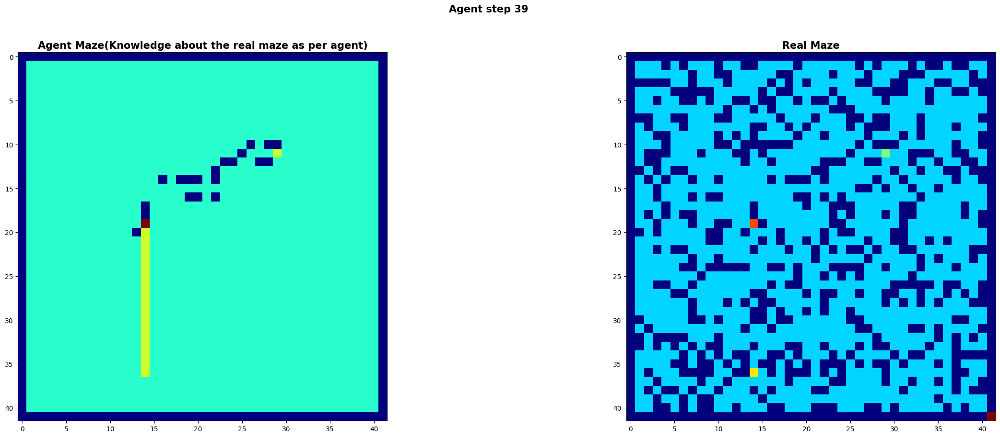

<Figure size 2000x2000 with 0 Axes>

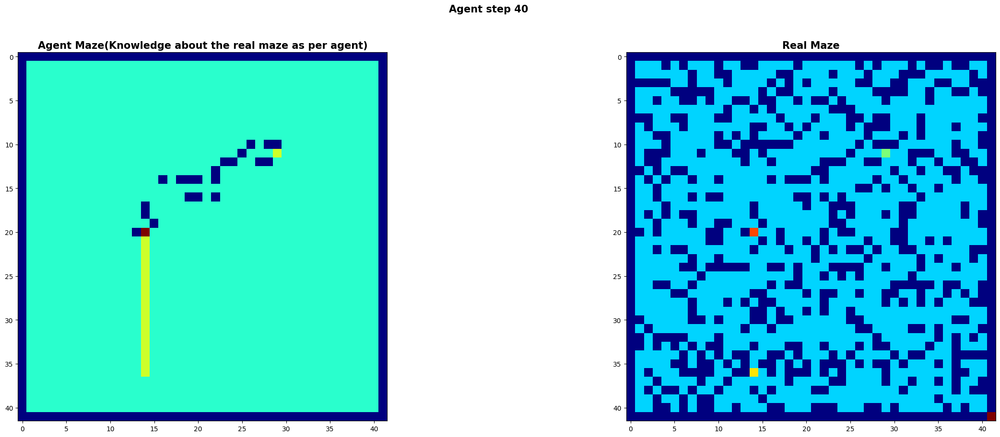

<Figure size 2000x2000 with 0 Axes>

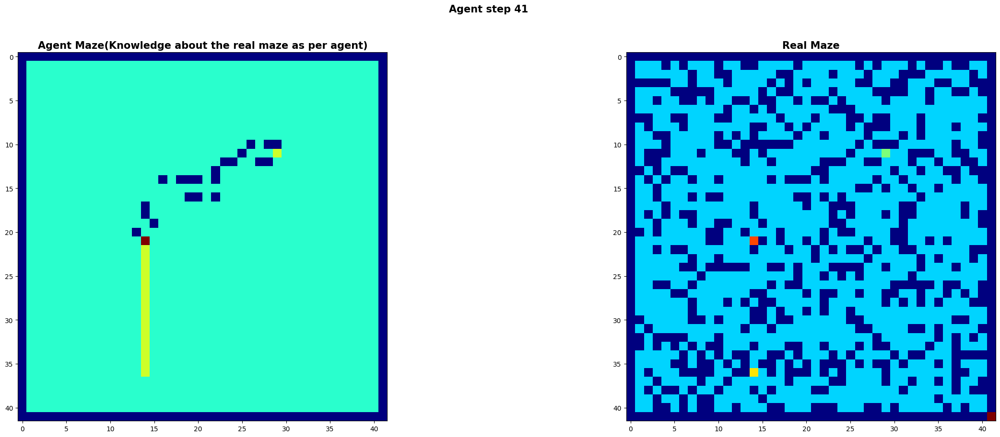

<Figure size 2000x2000 with 0 Axes>

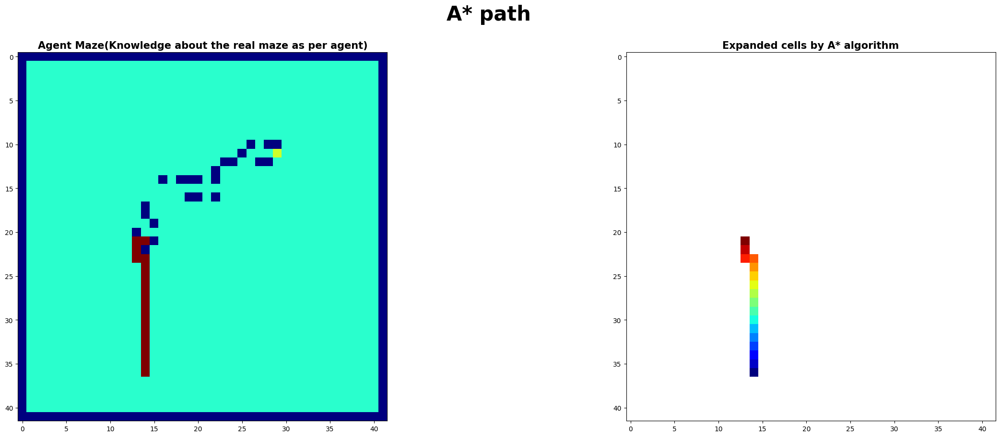

<Figure size 2000x2000 with 0 Axes>

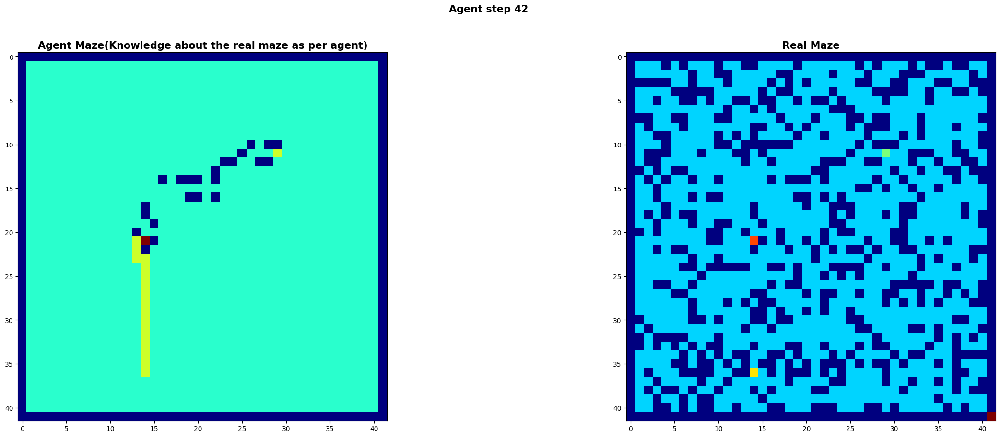

<Figure size 2000x2000 with 0 Axes>

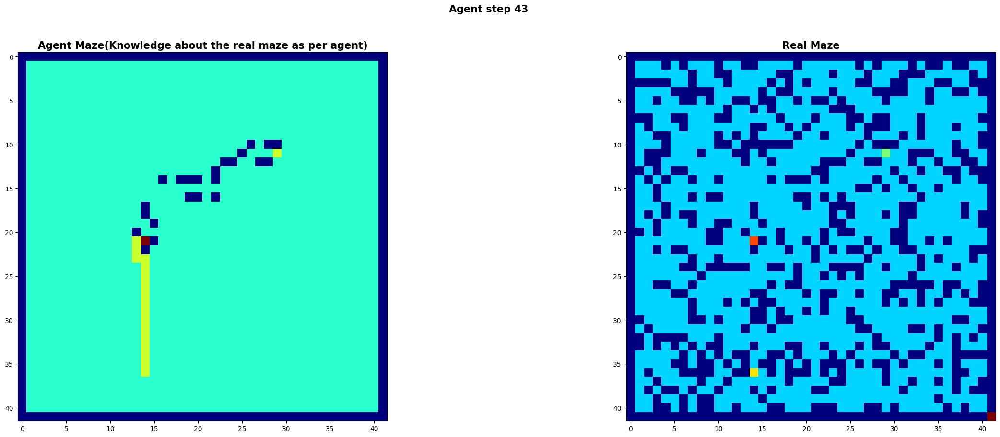

<Figure size 2000x2000 with 0 Axes>

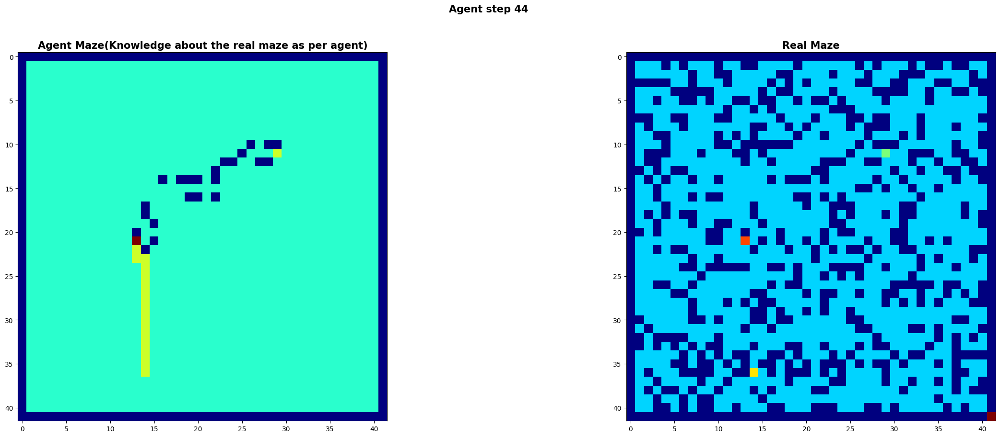

<Figure size 2000x2000 with 0 Axes>

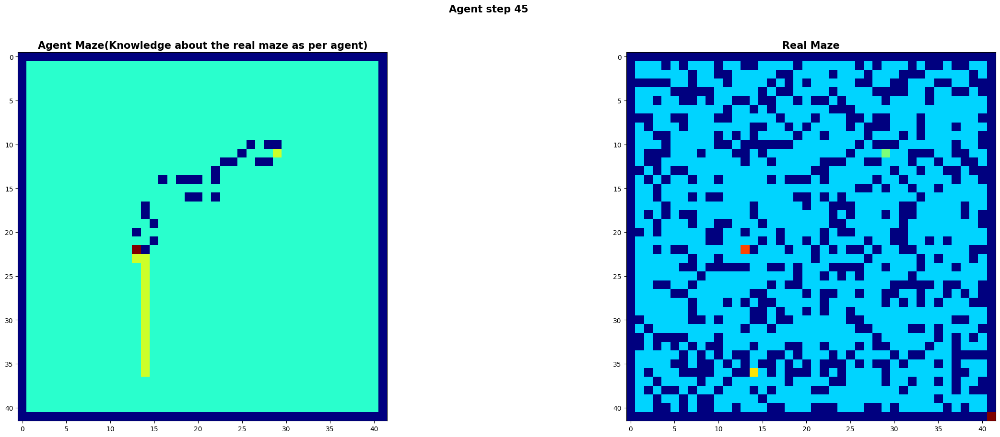

<Figure size 2000x2000 with 0 Axes>

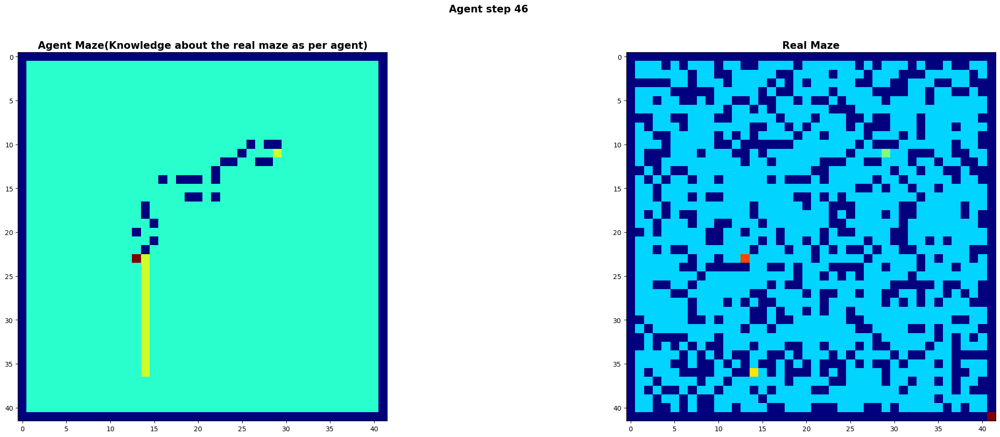

<Figure size 2000x2000 with 0 Axes>

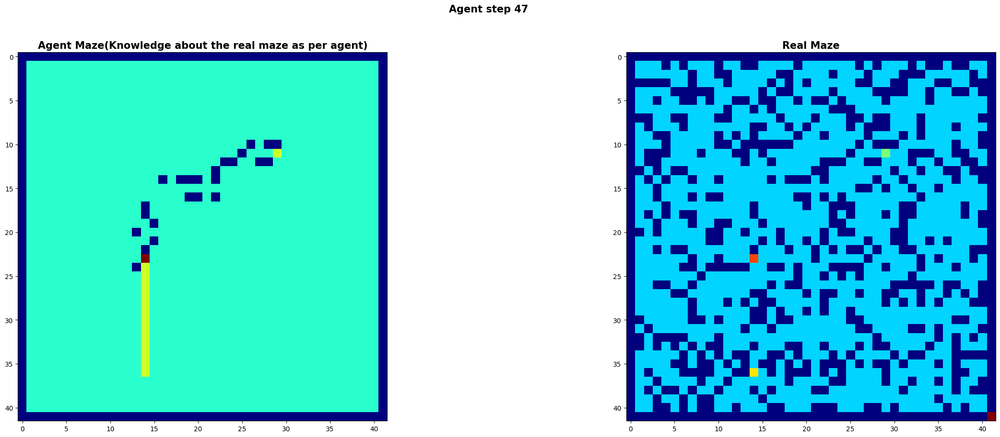

<Figure size 2000x2000 with 0 Axes>

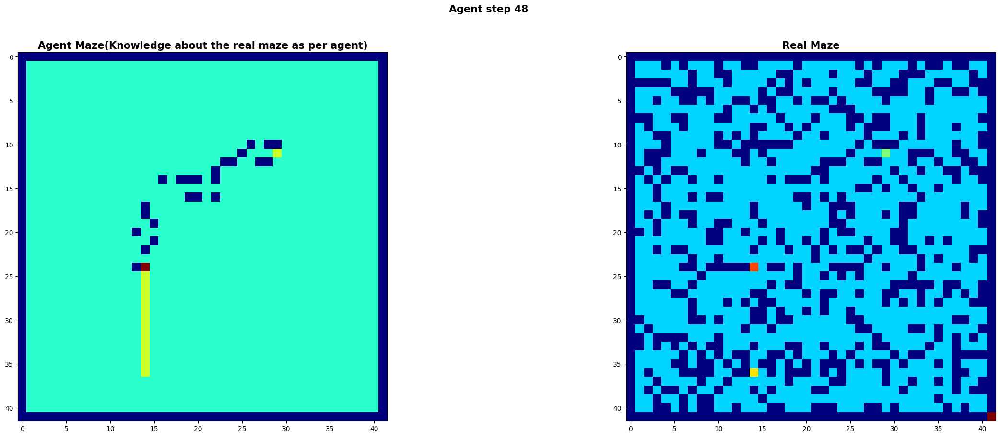

<Figure size 2000x2000 with 0 Axes>

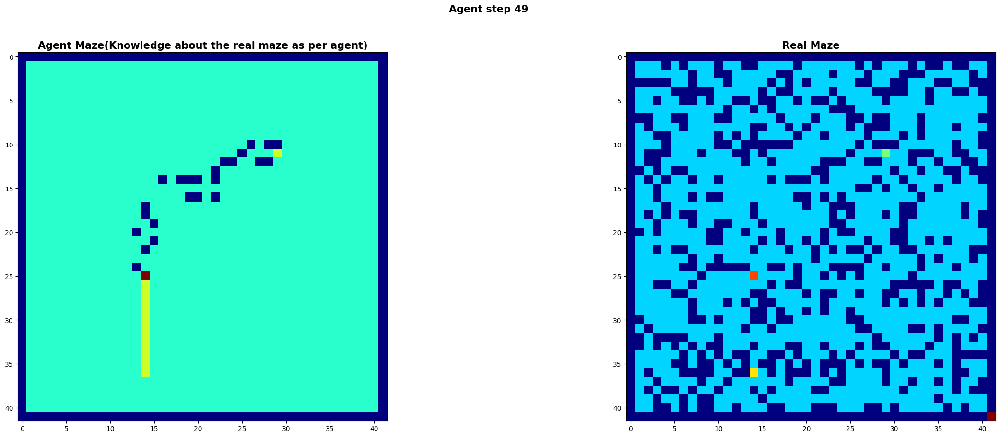

<Figure size 2000x2000 with 0 Axes>

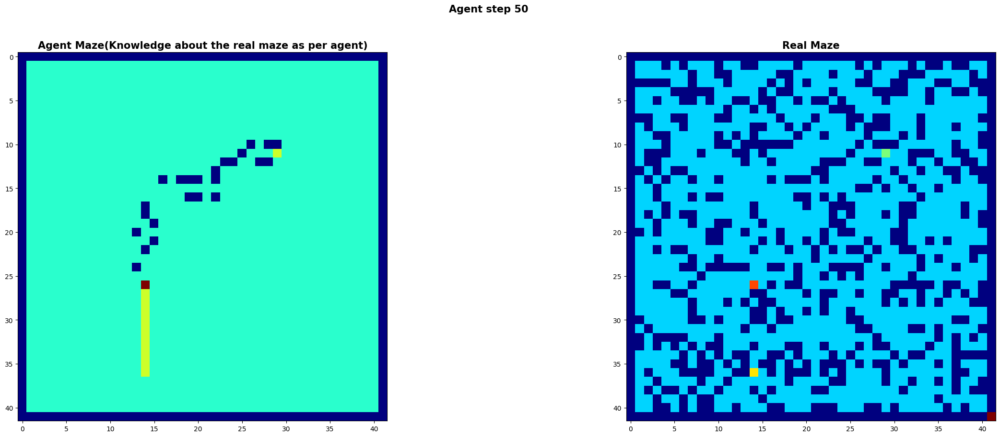

<Figure size 2000x2000 with 0 Axes>

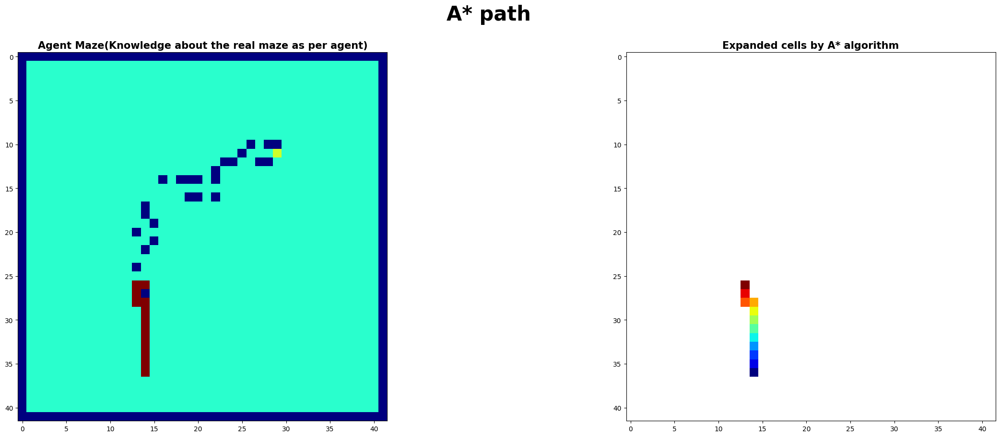

<Figure size 2000x2000 with 0 Axes>

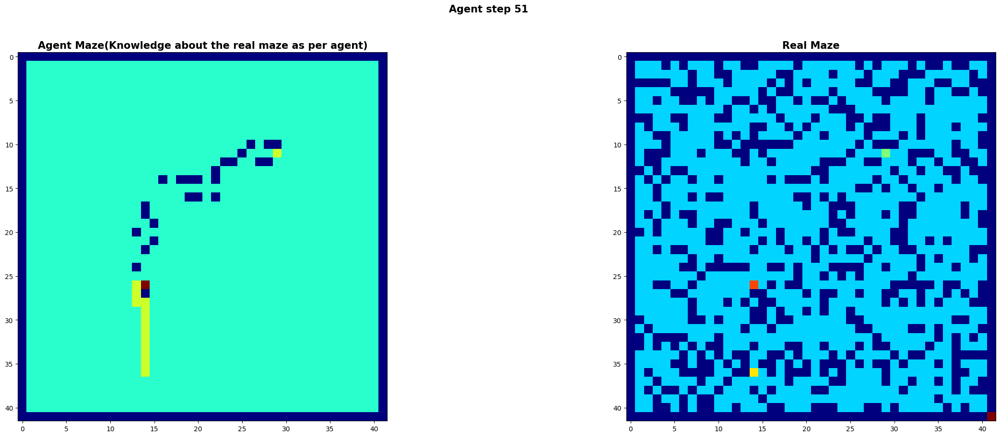

<Figure size 2000x2000 with 0 Axes>

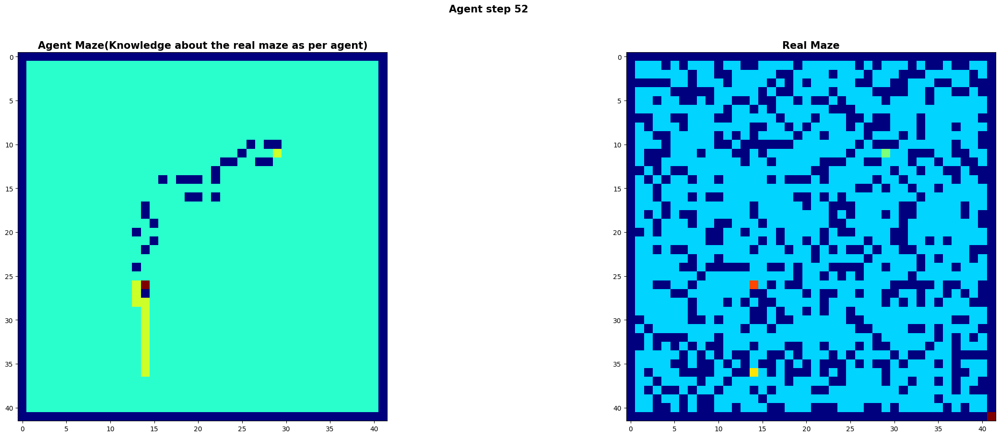

<Figure size 2000x2000 with 0 Axes>

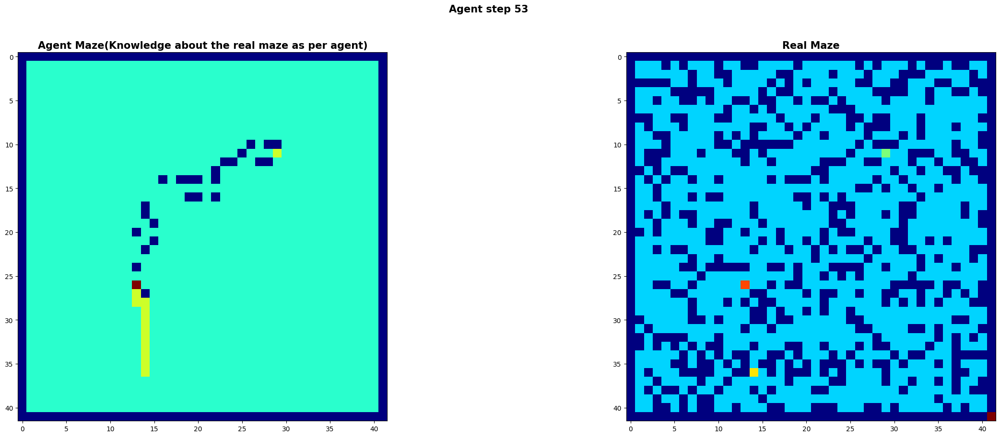

<Figure size 2000x2000 with 0 Axes>

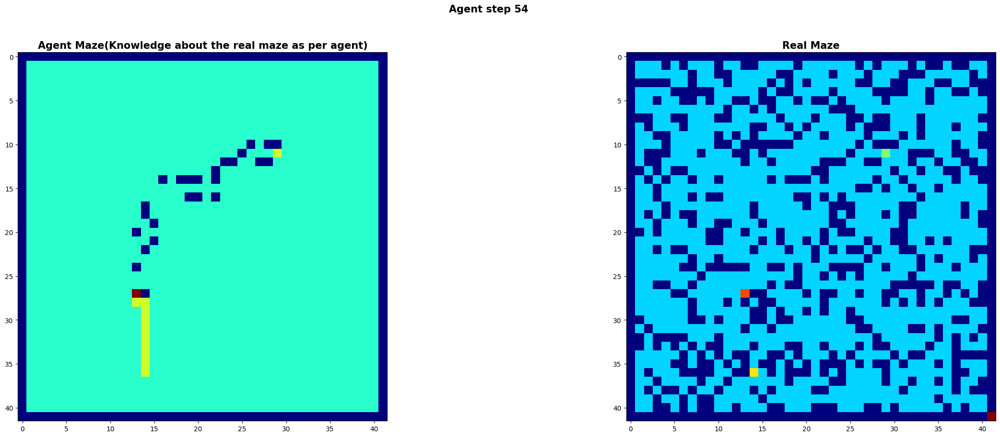

<Figure size 2000x2000 with 0 Axes>

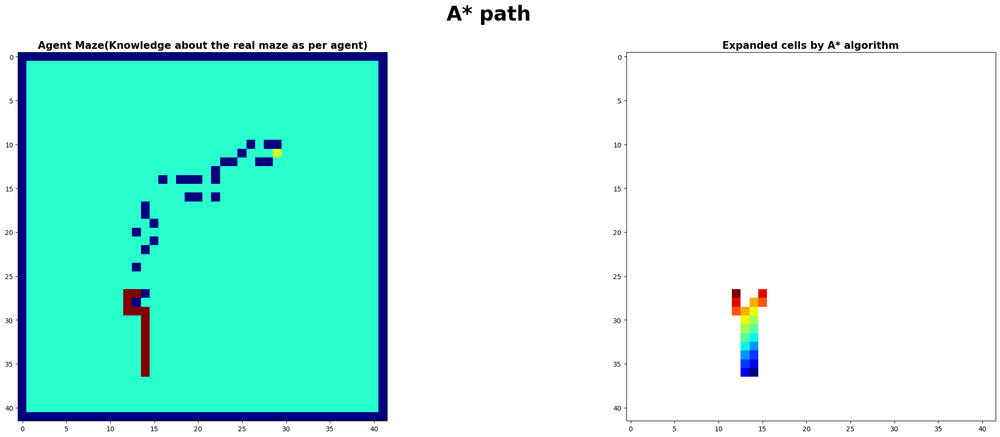

<Figure size 2000x2000 with 0 Axes>

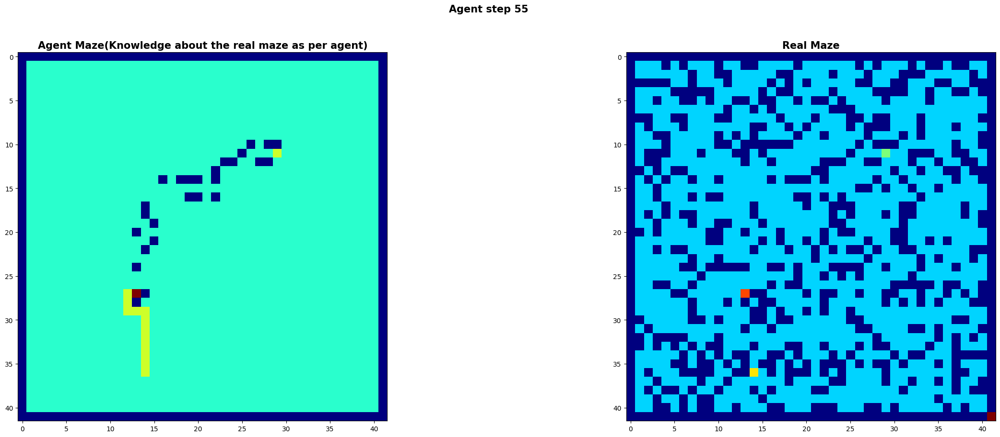

<Figure size 2000x2000 with 0 Axes>

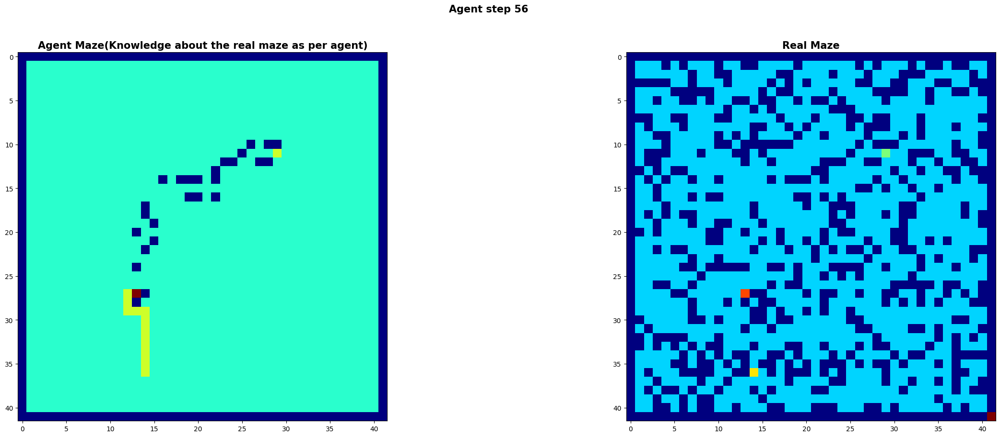

<Figure size 2000x2000 with 0 Axes>

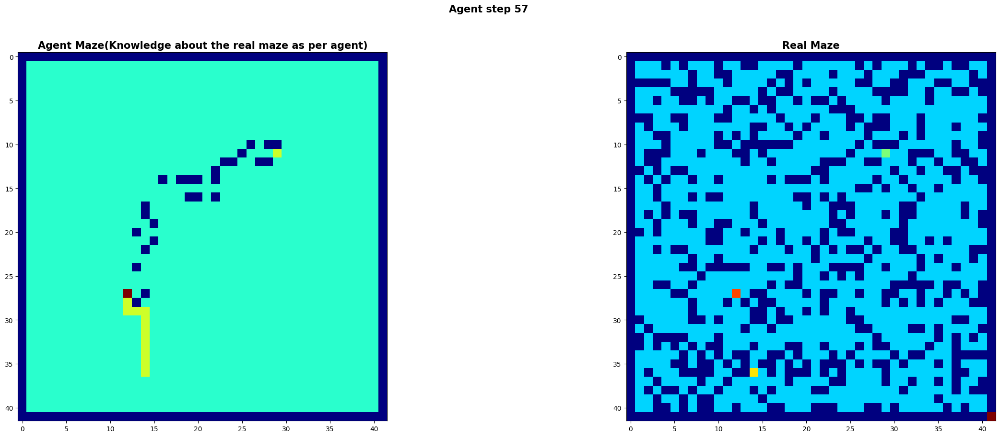

<Figure size 2000x2000 with 0 Axes>

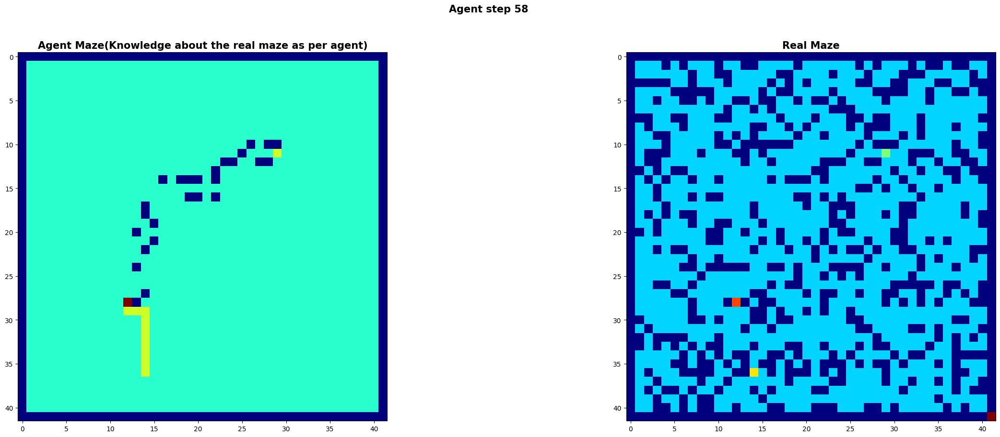

<Figure size 2000x2000 with 0 Axes>

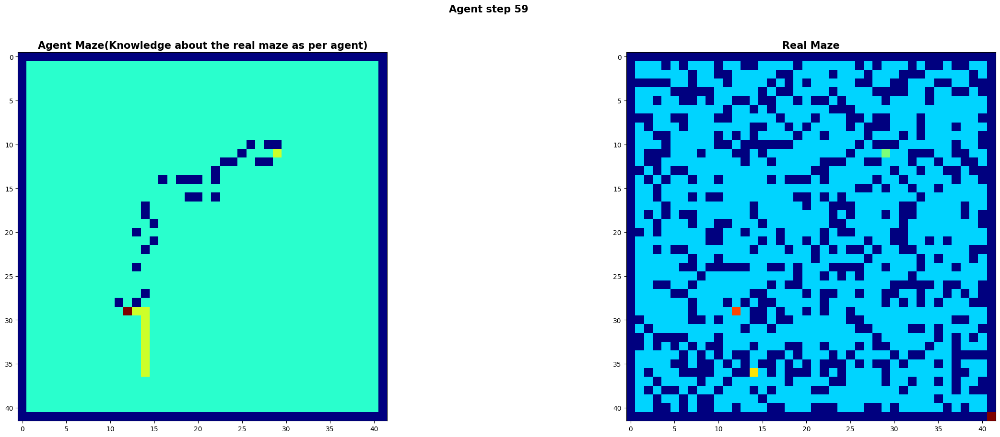

<Figure size 2000x2000 with 0 Axes>

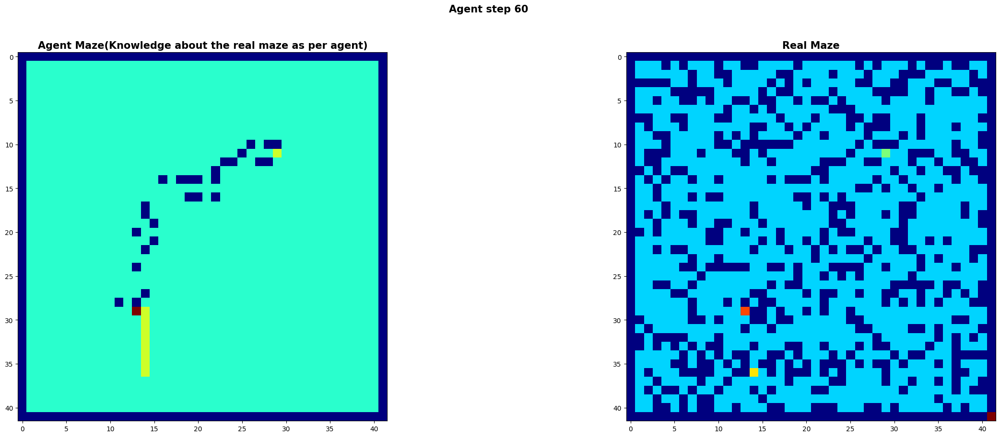

<Figure size 2000x2000 with 0 Axes>

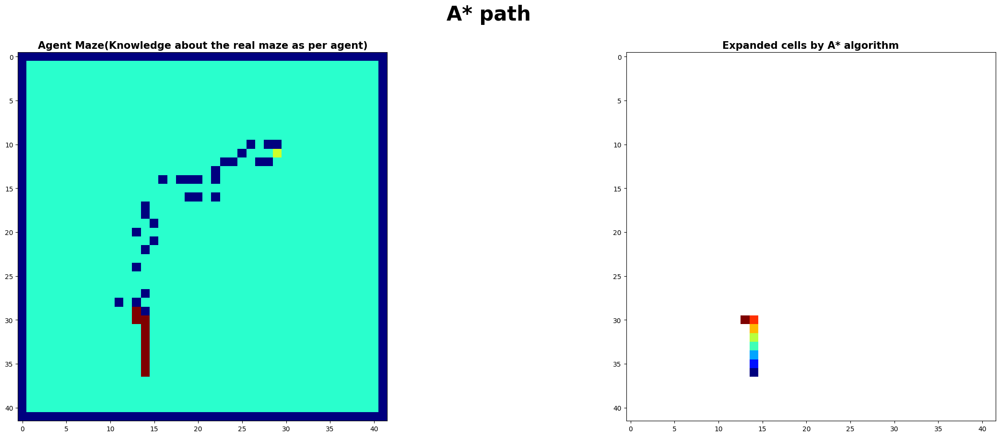

<Figure size 2000x2000 with 0 Axes>

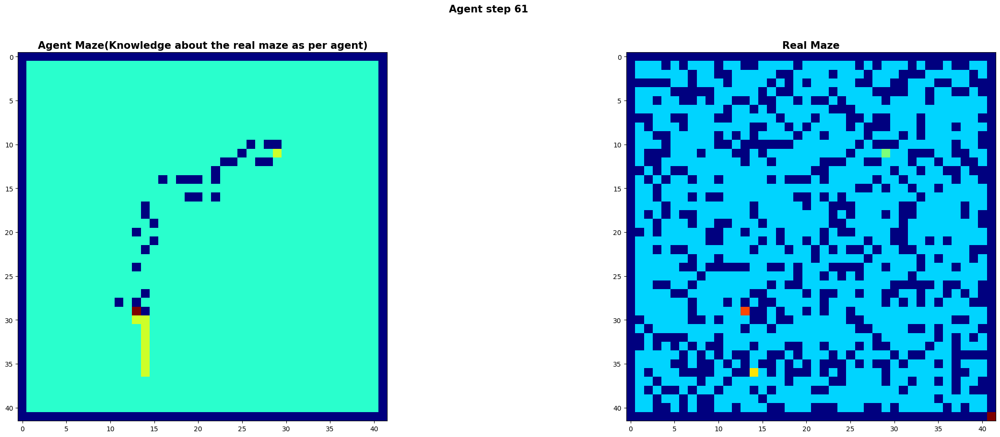

<Figure size 2000x2000 with 0 Axes>

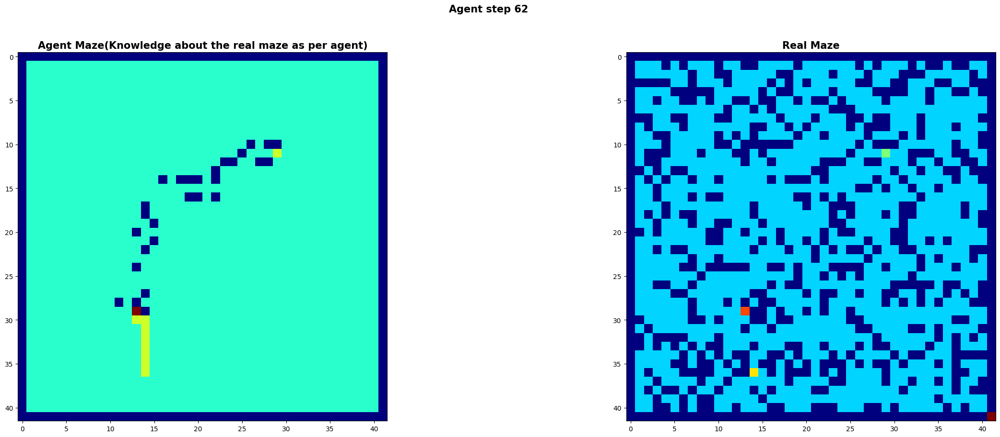

<Figure size 2000x2000 with 0 Axes>

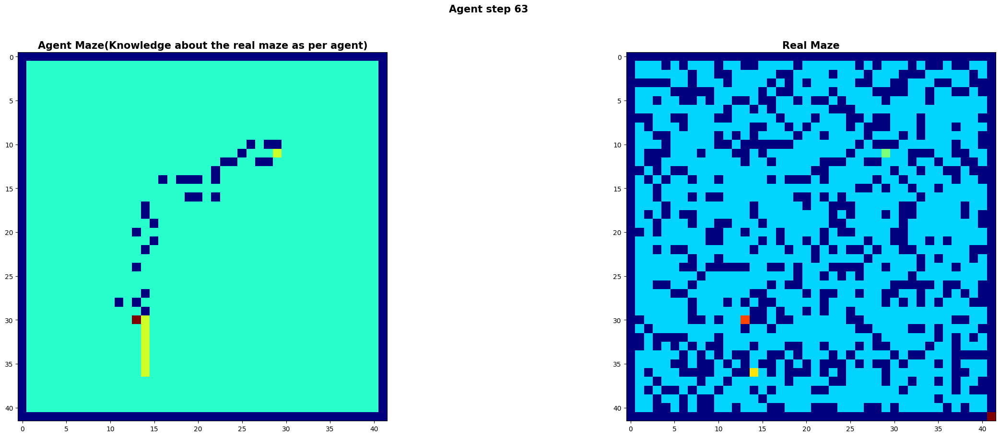

<Figure size 2000x2000 with 0 Axes>

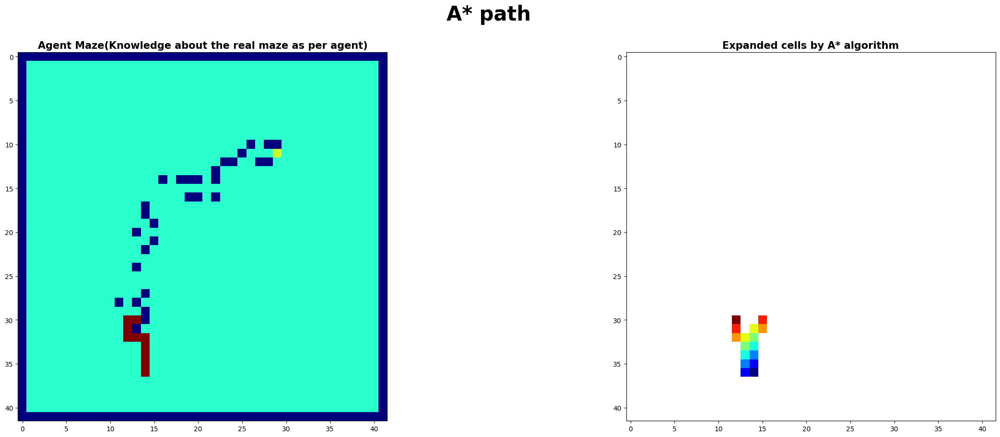

<Figure size 2000x2000 with 0 Axes>

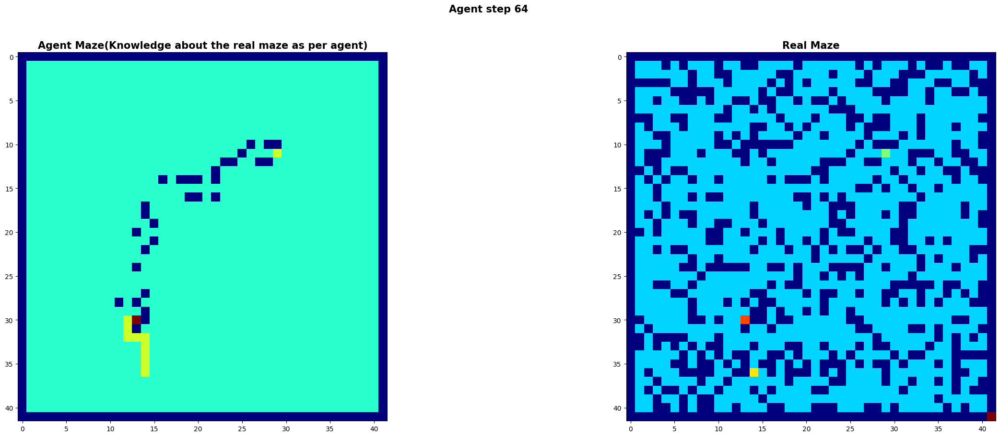

<Figure size 2000x2000 with 0 Axes>

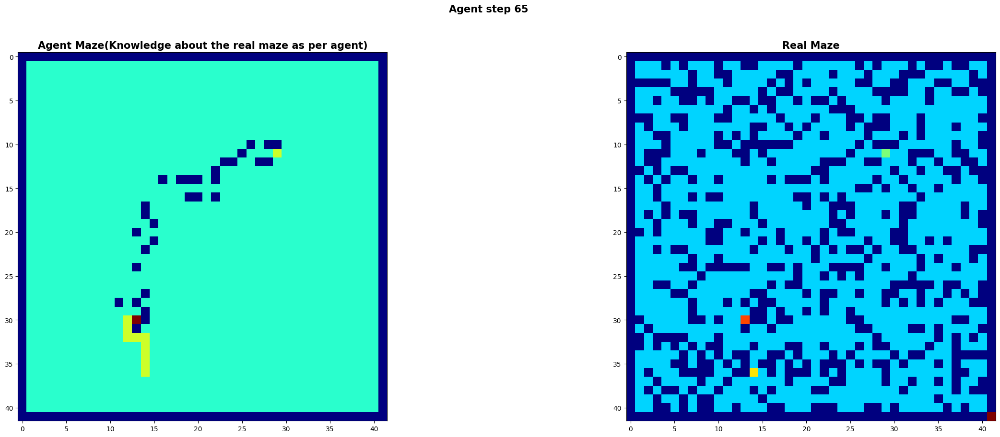

<Figure size 2000x2000 with 0 Axes>

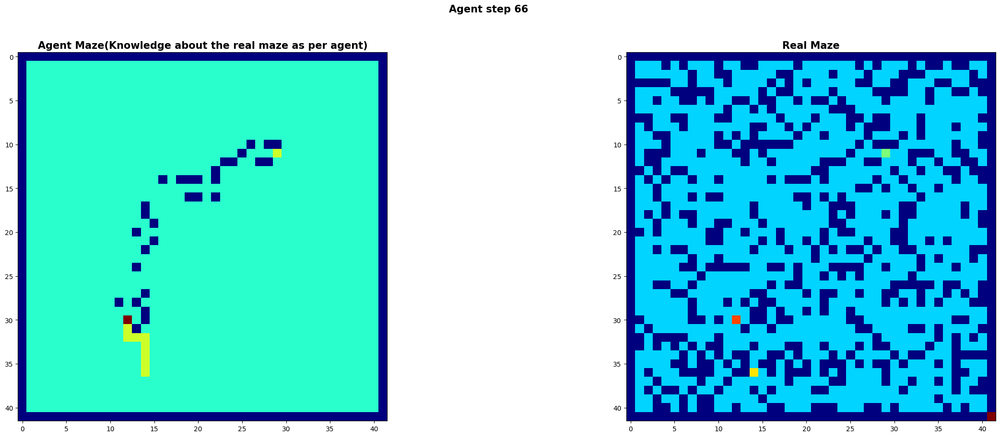

<Figure size 2000x2000 with 0 Axes>

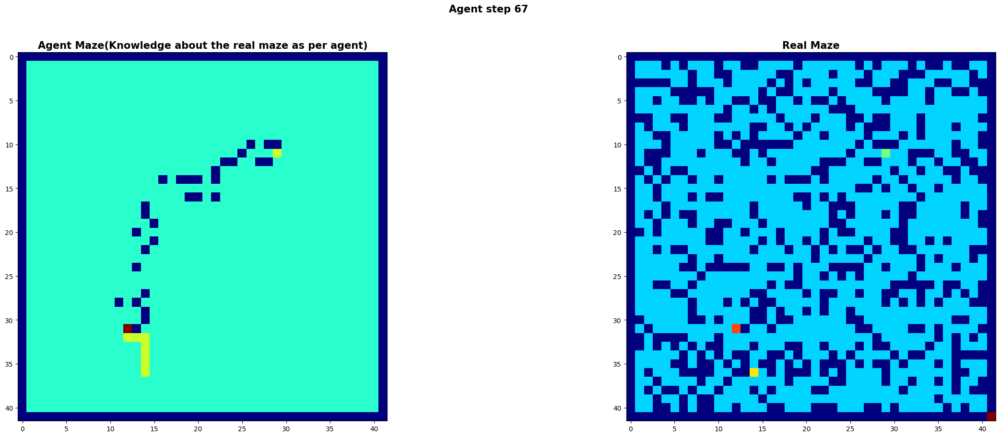

<Figure size 2000x2000 with 0 Axes>

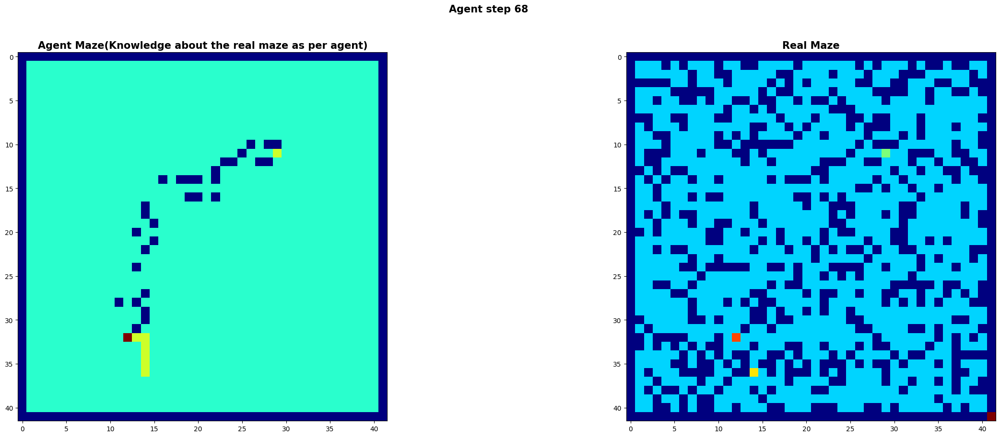

<Figure size 2000x2000 with 0 Axes>

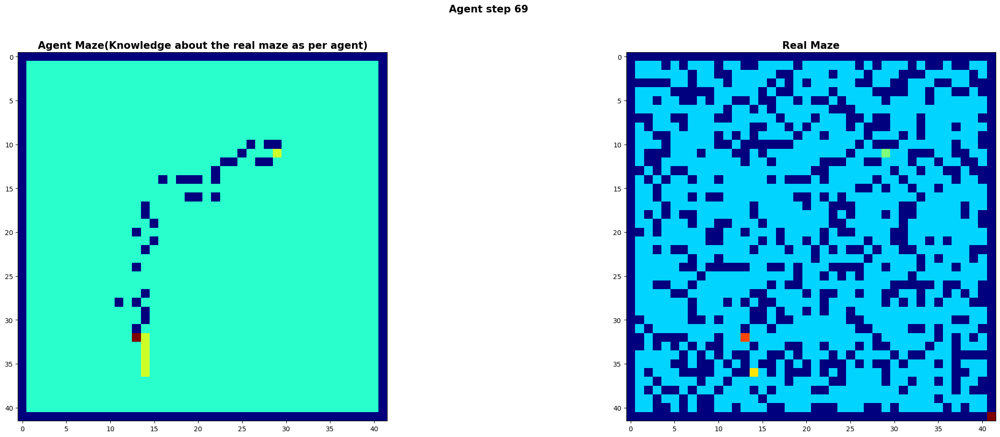

<Figure size 2000x2000 with 0 Axes>

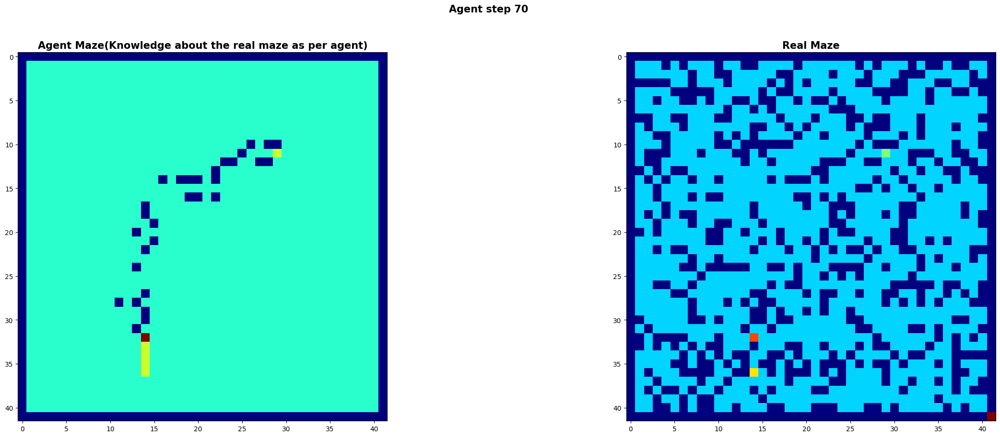

<Figure size 2000x2000 with 0 Axes>

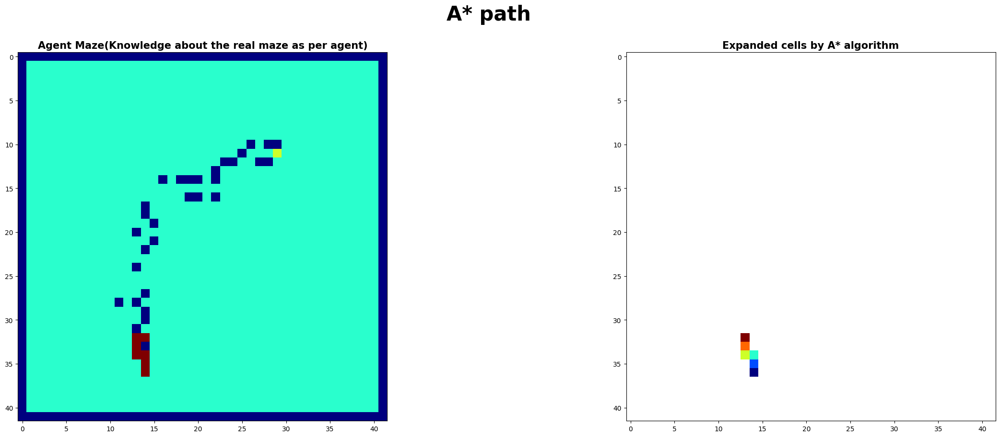

<Figure size 2000x2000 with 0 Axes>

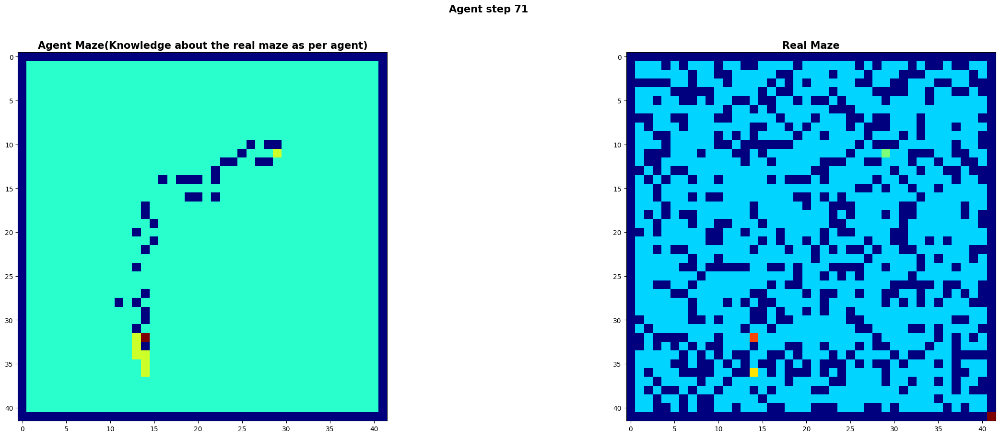

<Figure size 2000x2000 with 0 Axes>

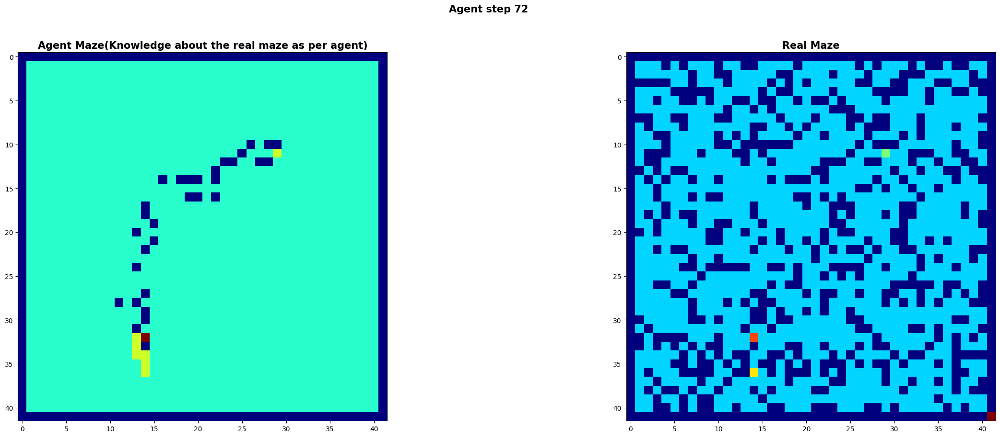

<Figure size 2000x2000 with 0 Axes>

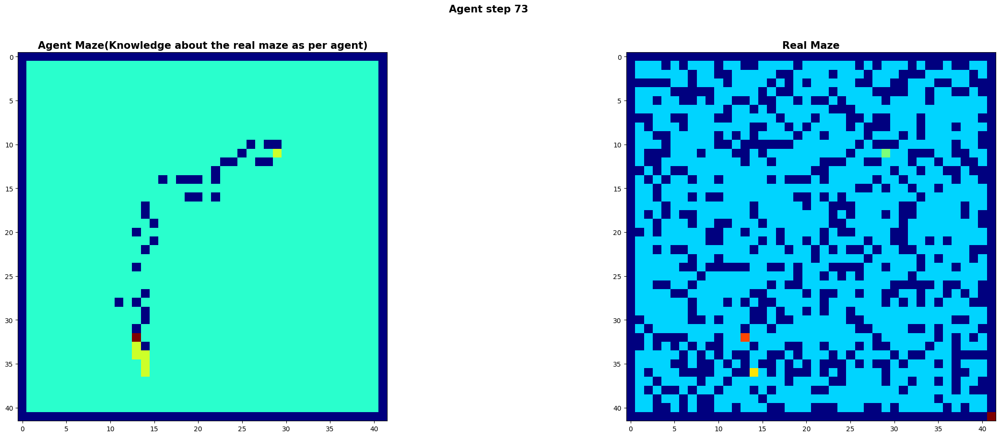

<Figure size 2000x2000 with 0 Axes>

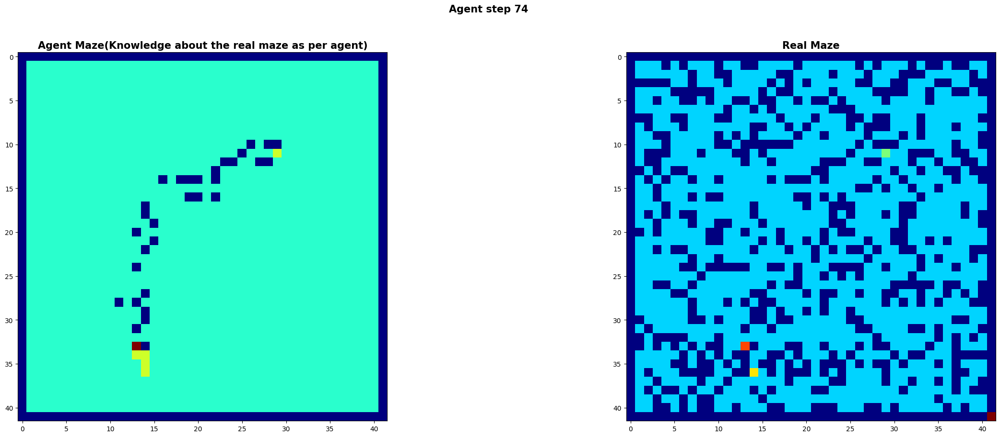

<Figure size 2000x2000 with 0 Axes>

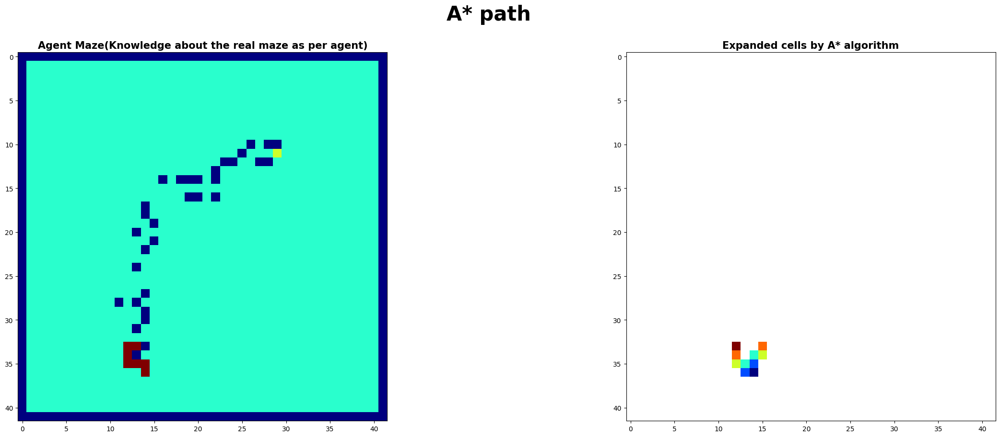

<Figure size 2000x2000 with 0 Axes>

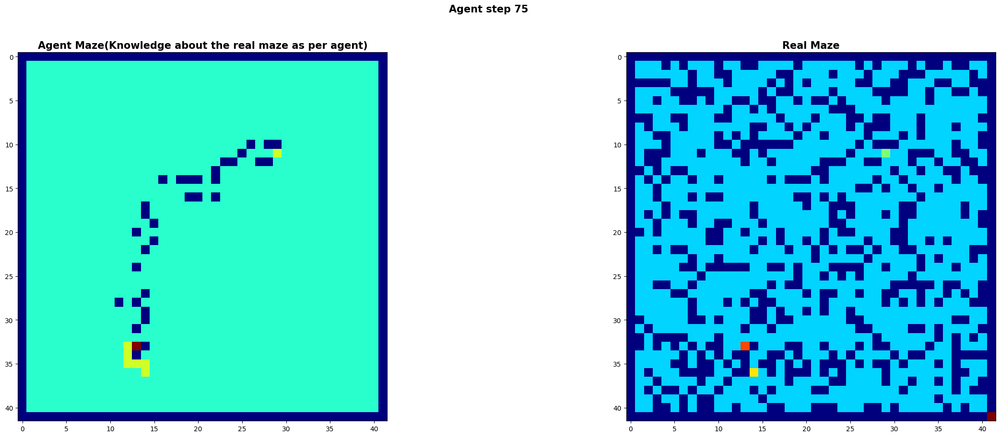

<Figure size 2000x2000 with 0 Axes>

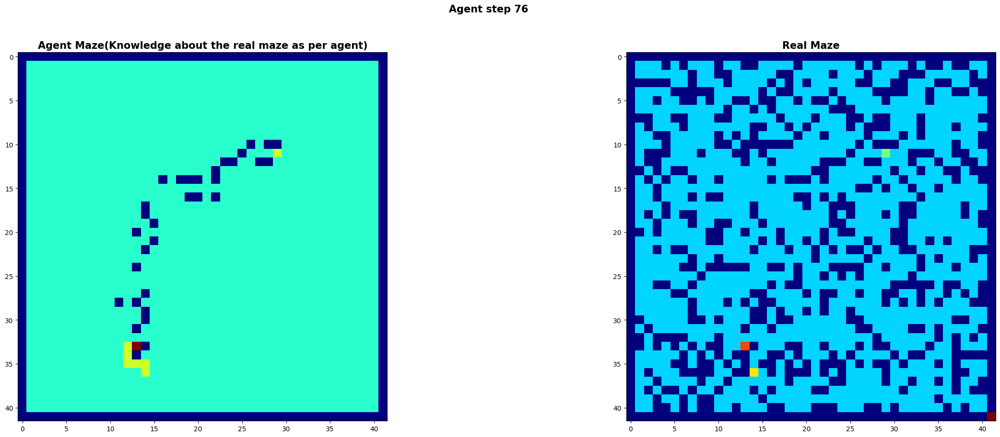

<Figure size 2000x2000 with 0 Axes>

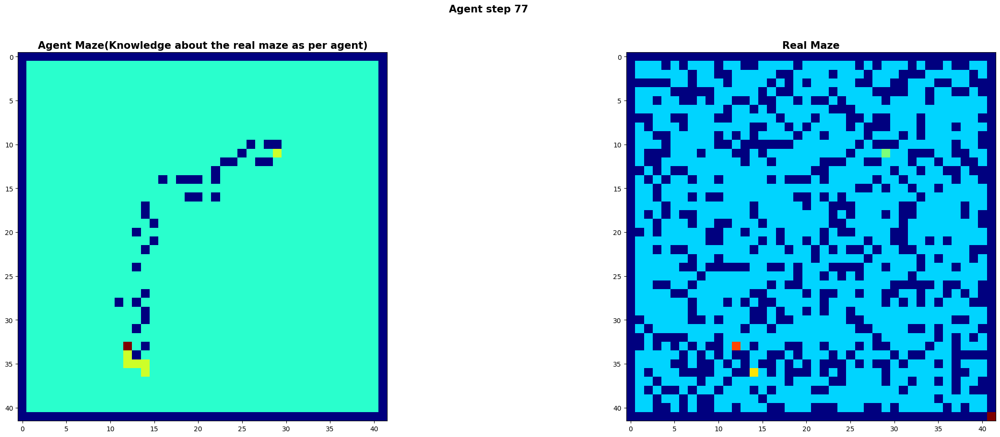

<Figure size 2000x2000 with 0 Axes>

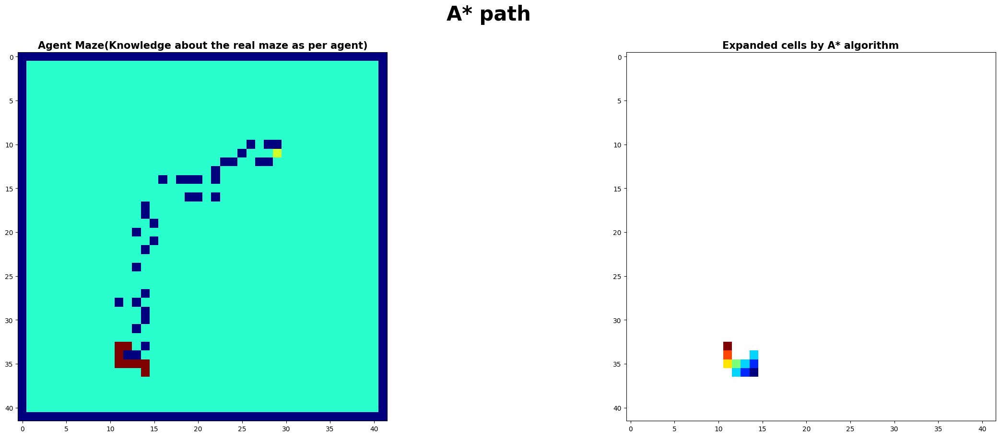

<Figure size 2000x2000 with 0 Axes>

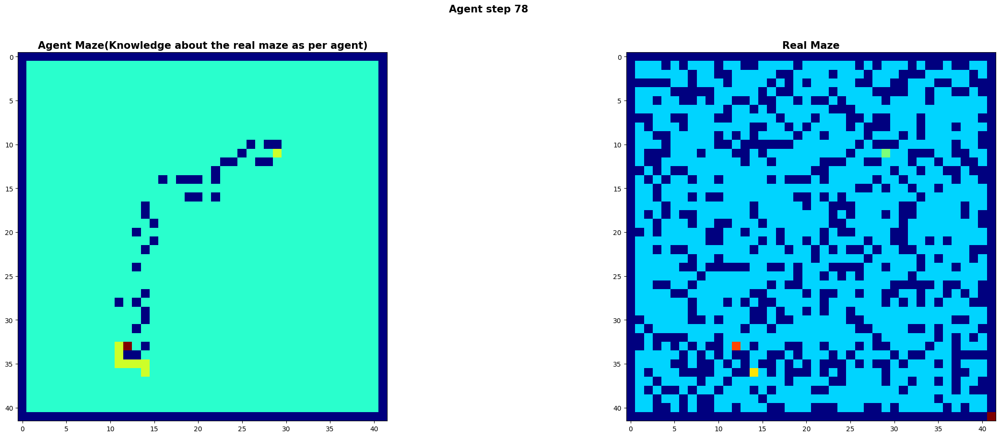

<Figure size 2000x2000 with 0 Axes>

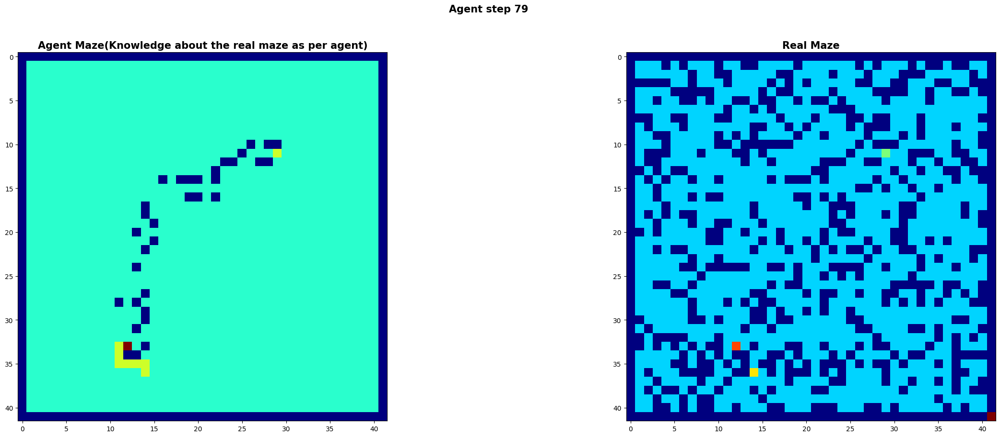

<Figure size 2000x2000 with 0 Axes>

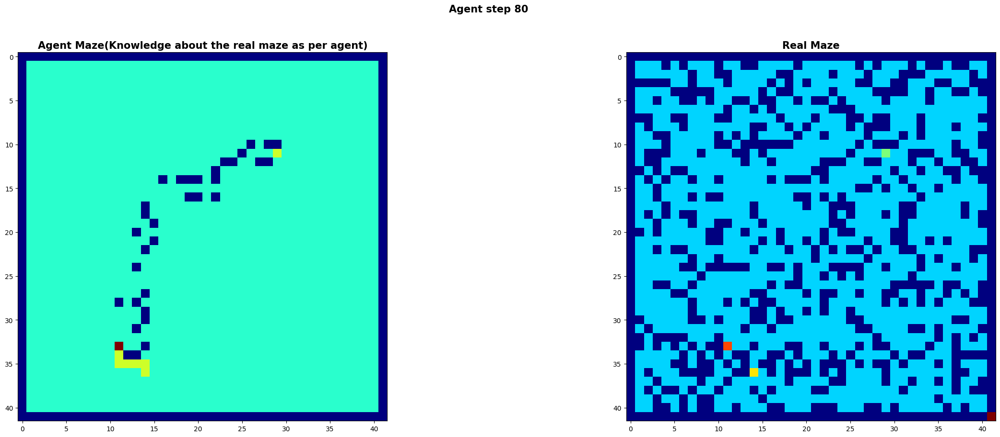

<Figure size 2000x2000 with 0 Axes>

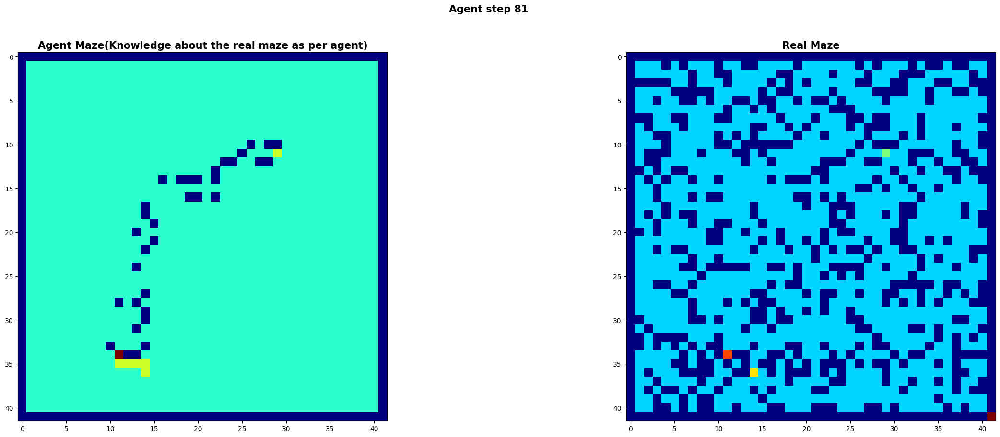

<Figure size 2000x2000 with 0 Axes>

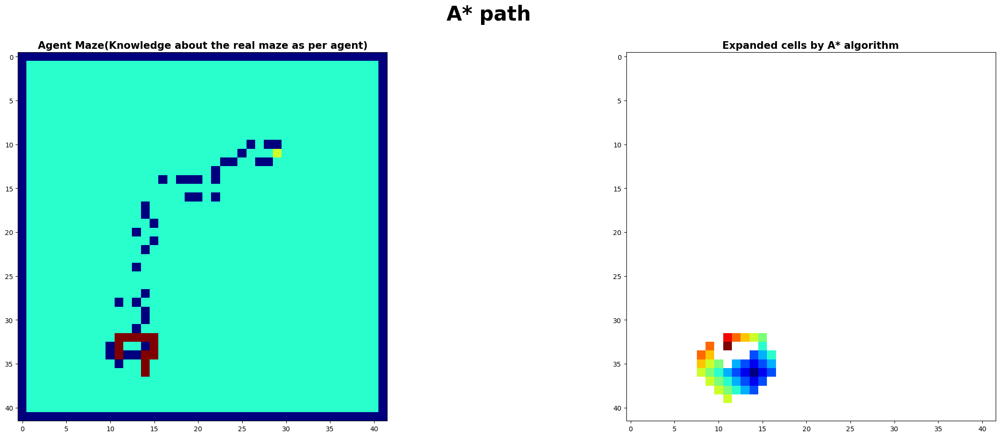

<Figure size 2000x2000 with 0 Axes>

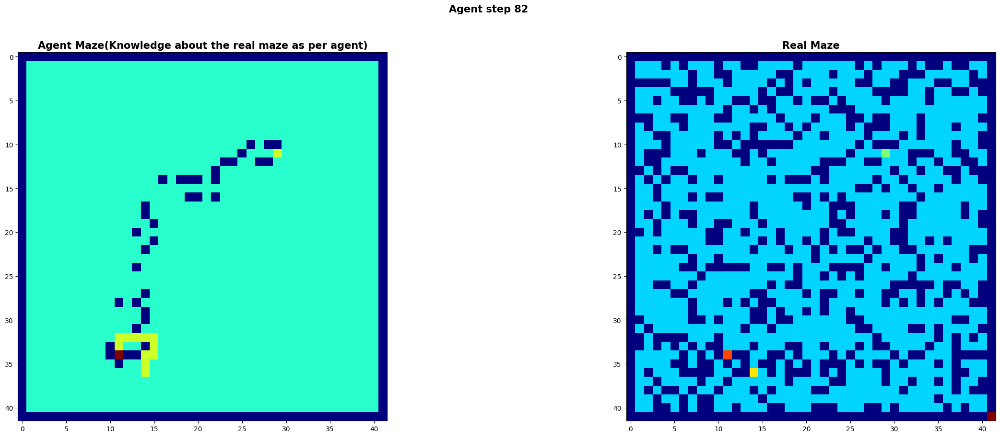

<Figure size 2000x2000 with 0 Axes>

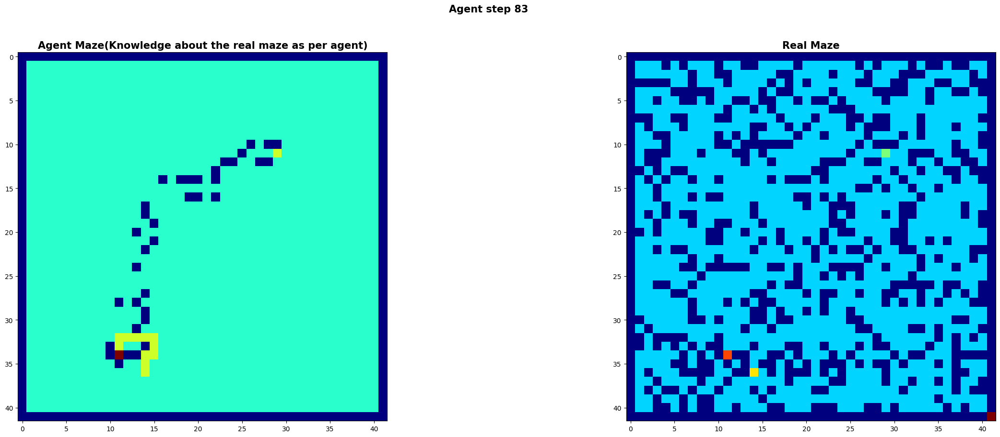

<Figure size 2000x2000 with 0 Axes>

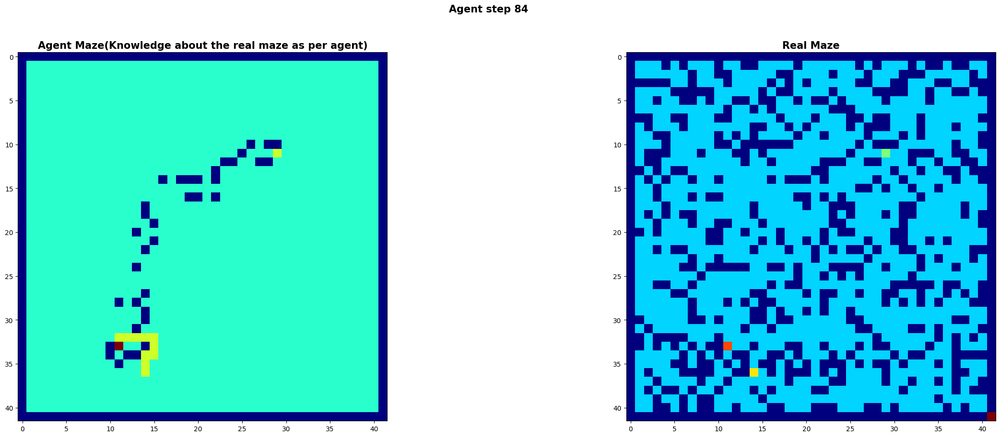

<Figure size 2000x2000 with 0 Axes>

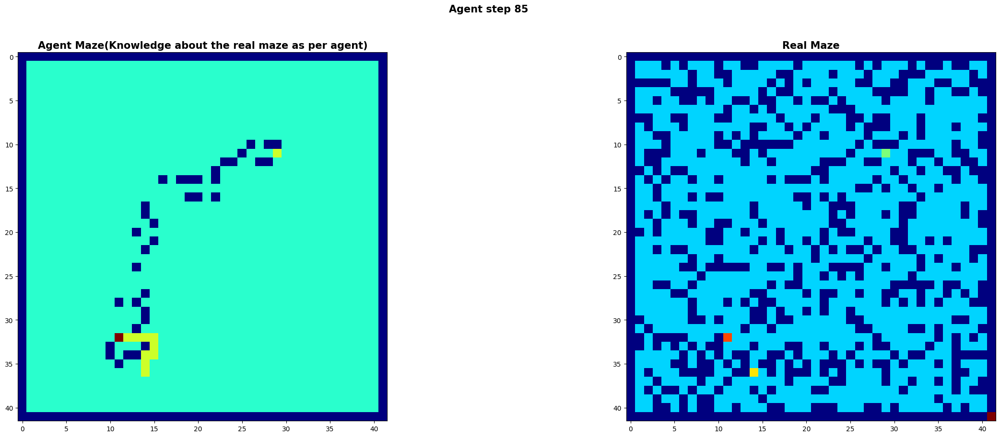

<Figure size 2000x2000 with 0 Axes>

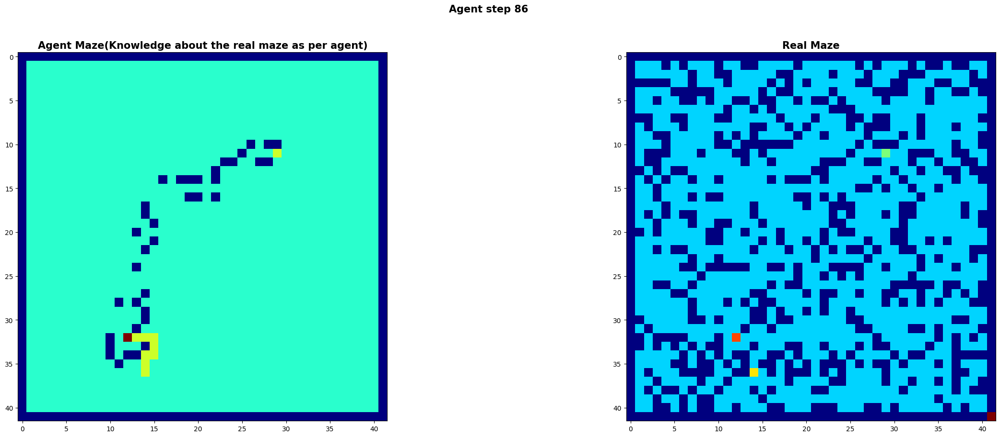

<Figure size 2000x2000 with 0 Axes>

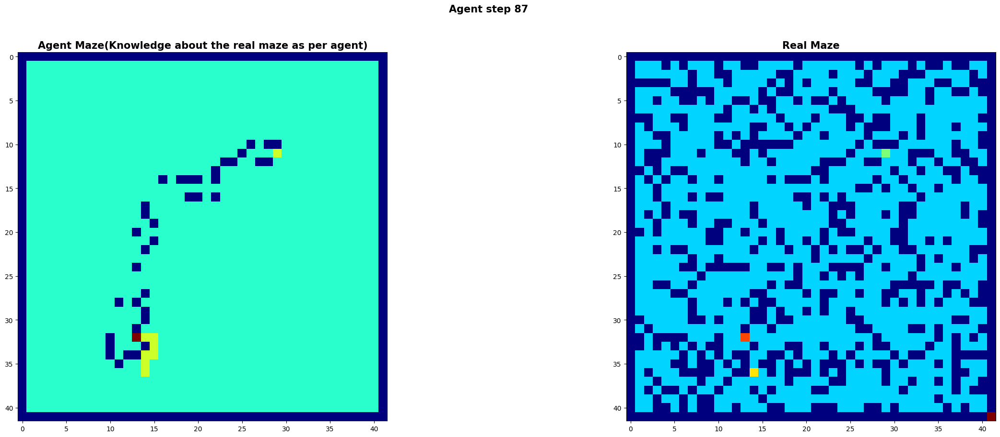

<Figure size 2000x2000 with 0 Axes>

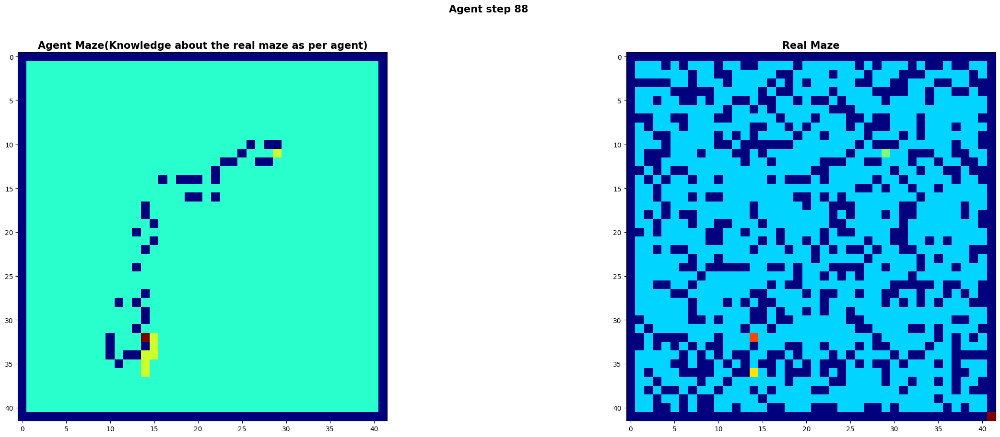

<Figure size 2000x2000 with 0 Axes>

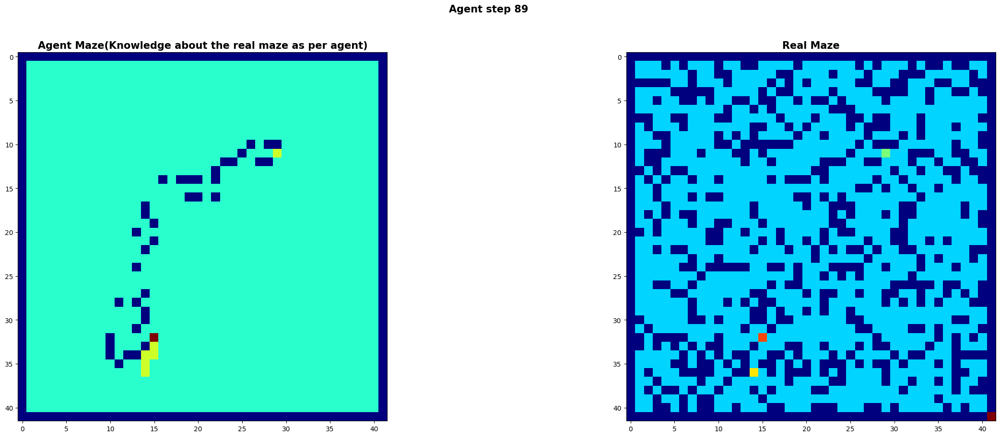

<Figure size 2000x2000 with 0 Axes>

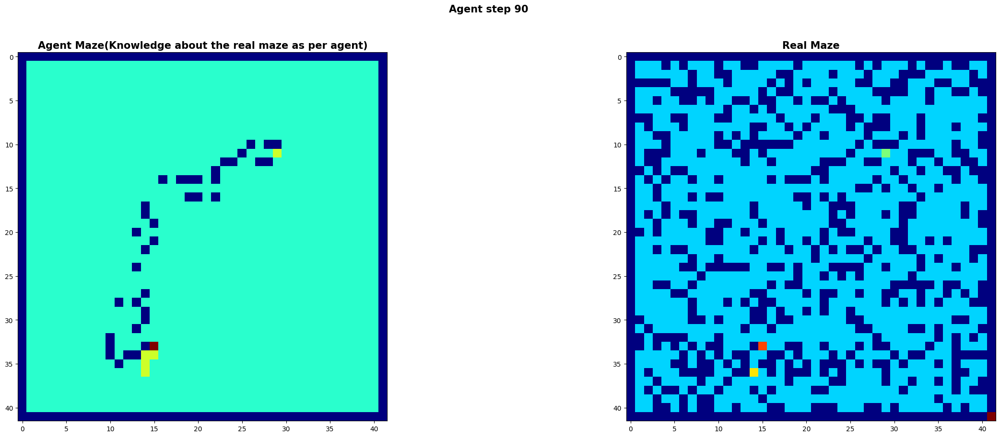

<Figure size 2000x2000 with 0 Axes>

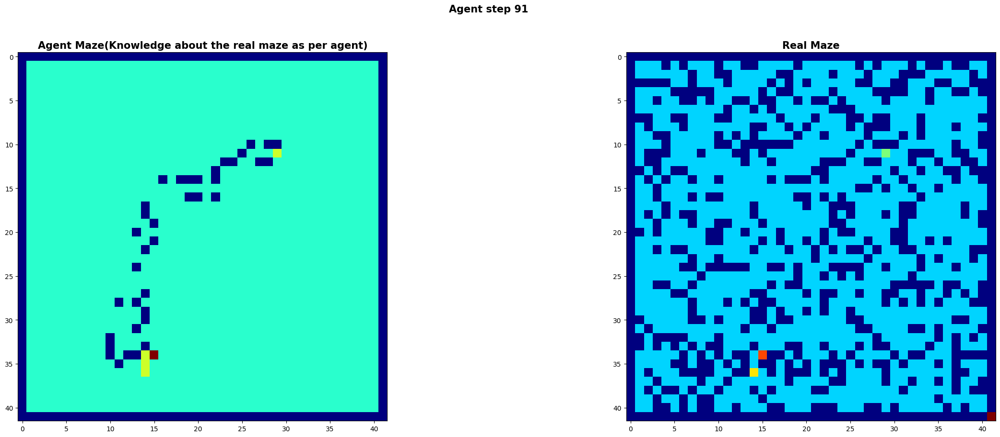

<Figure size 2000x2000 with 0 Axes>

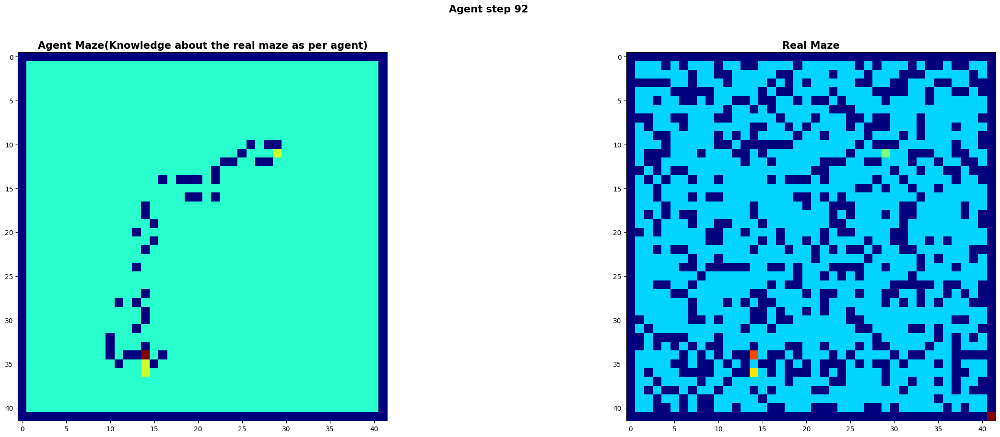

<Figure size 2000x2000 with 0 Axes>

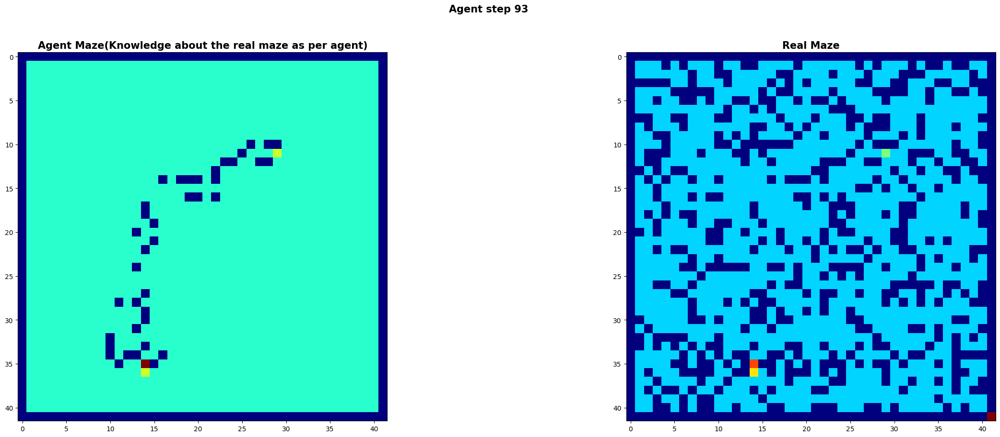

Reached the end point


398

In [20]:

def repeated_backward_A_star(Environment_plus,size_of_matrix,plot):


        Environment, start_point, end_point = Environment_plus
        

        G = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
        G_closed_list = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
        F = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
        H = heuristic_maze(101,start_point)
        expanded_counter = 0

        agent_maze = np.full((size_of_matrix, size_of_matrix),2)
        agent_maze = np.pad(agent_maze, [(1, 1), (1, 1)], mode='constant')
        agent_maze[start_point] = 3
        agent_maze[end_point] = 4

        counter = 0
        point = start_point

        

        while(point!= end_point):
            
            current_start_point = point
            came_from = a_star(agent_maze,end_point,start_point,H,G,F,G_closed_list)
            expanded_counter += np.isfinite(G_closed_list).sum()
            
            if plot == True:
                step_plot(agent_maze,G_closed_list,end_point,current_start_point,came_from)

            if came_from == False:
                print("Path not possible")
                break
            path = get_path(came_from,end_point,point)
            path.reverse()
            path = path + [end_point]

            while(point!= end_point):
                counter+=1
                type_ = 'repeated'
                if plot == True:
                    path_step_plot(agent_maze,point,counter,type_,Environment,H,G_closed_list,path[::-1])
                next_point = path.pop(0)
                mapping_func(point,Environment,agent_maze)
                if agent_maze[next_point] == 0:
                    agent_maze[next_point] = 0
                    G = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
                    F = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
                    G_closed_list = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
                    H = heuristic_maze(101,point)
                    break
                point = next_point

        if point == end_point and plot == True:
            print("Reached the end point")

        return expanded_counter

print(env_plus)
repeated_backward_A_star(env_plus,size_of_matrix,plot = True)

## Repeated Forward A* normal

<Figure size 2000x2000 with 0 Axes>

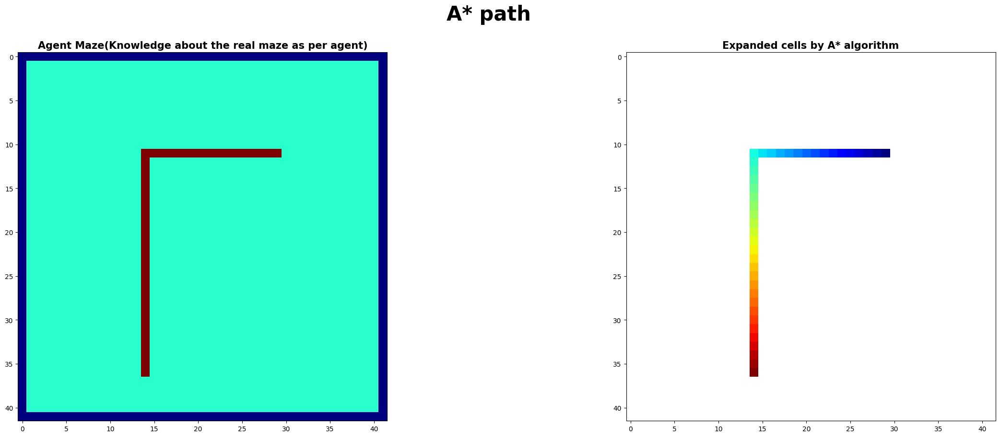

<Figure size 2000x2000 with 0 Axes>

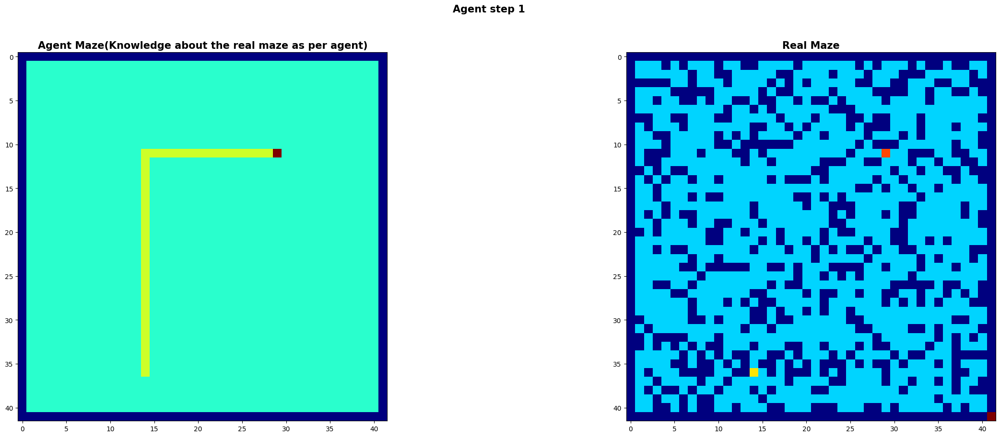

<Figure size 2000x2000 with 0 Axes>

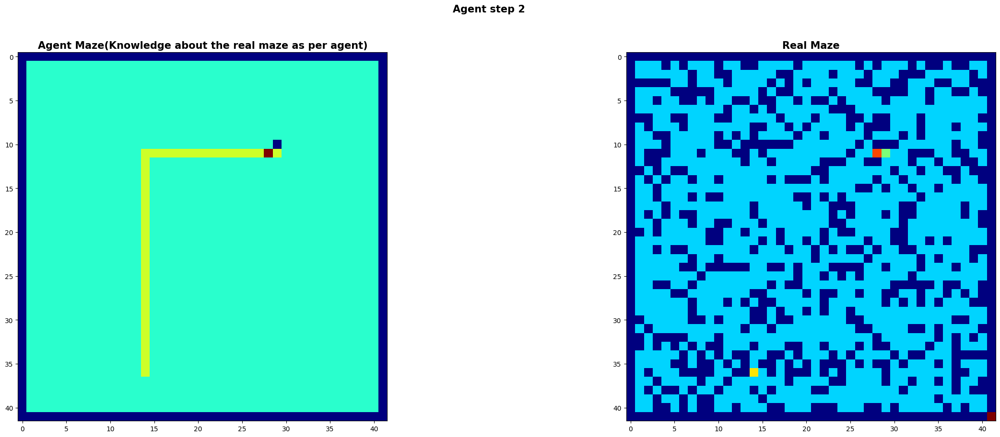

<Figure size 2000x2000 with 0 Axes>

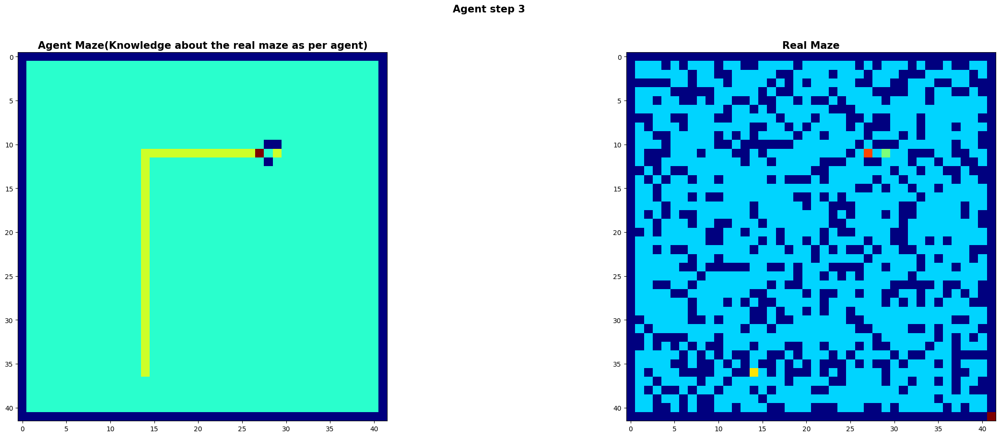

<Figure size 2000x2000 with 0 Axes>

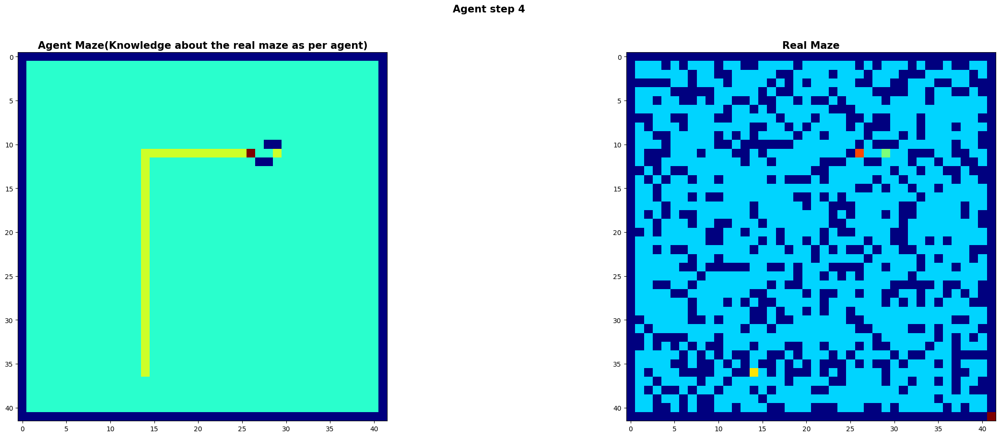

<Figure size 2000x2000 with 0 Axes>

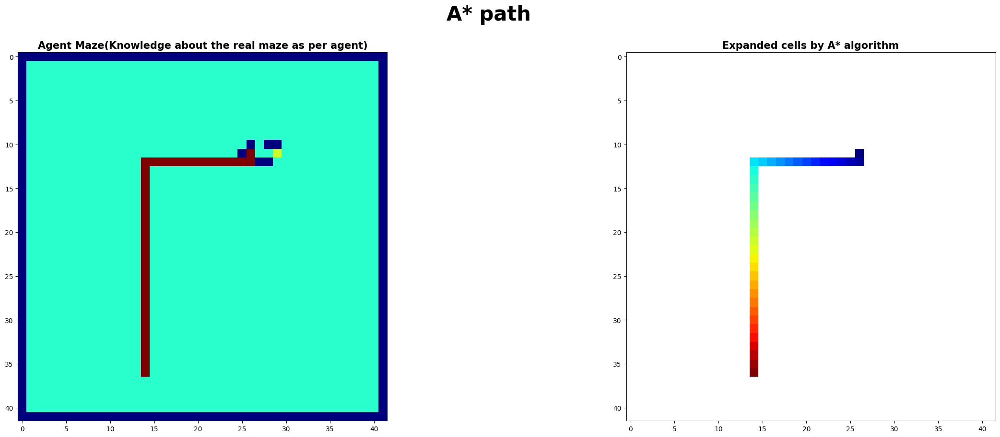

<Figure size 2000x2000 with 0 Axes>

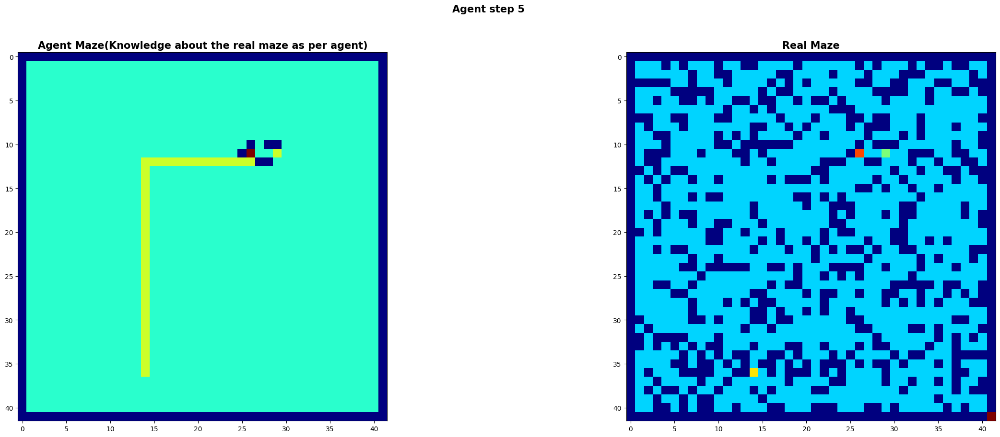

<Figure size 2000x2000 with 0 Axes>

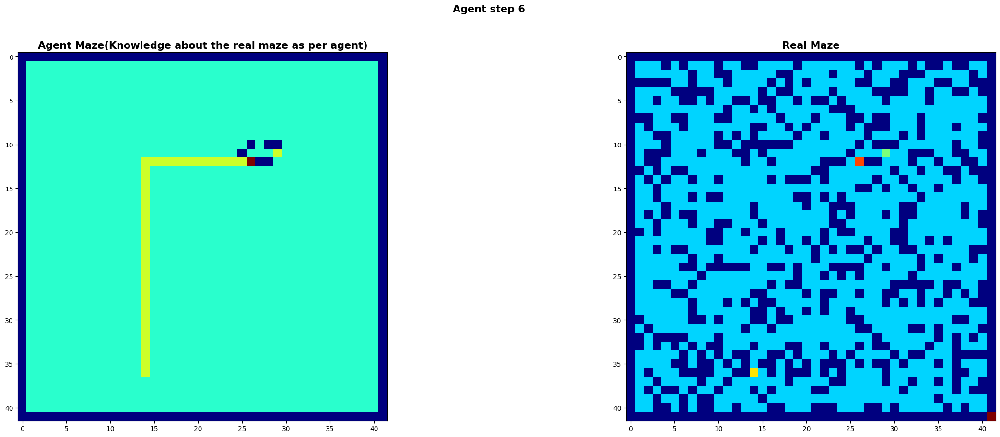

<Figure size 2000x2000 with 0 Axes>

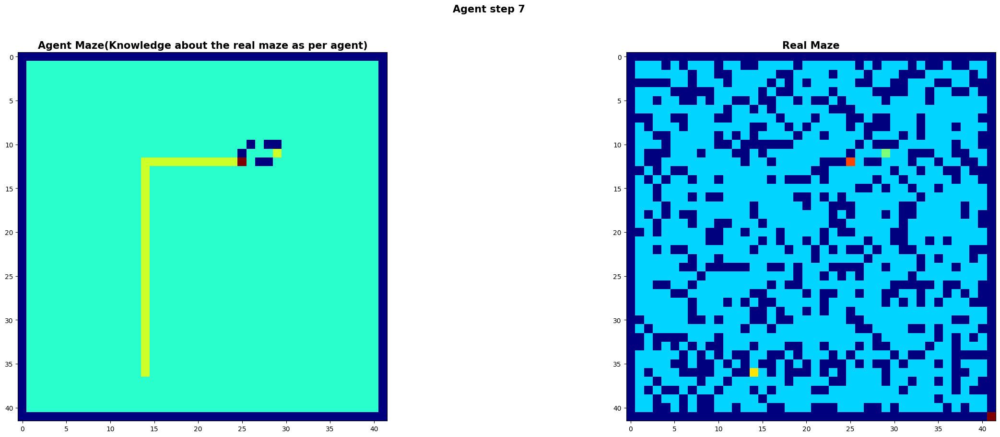

<Figure size 2000x2000 with 0 Axes>

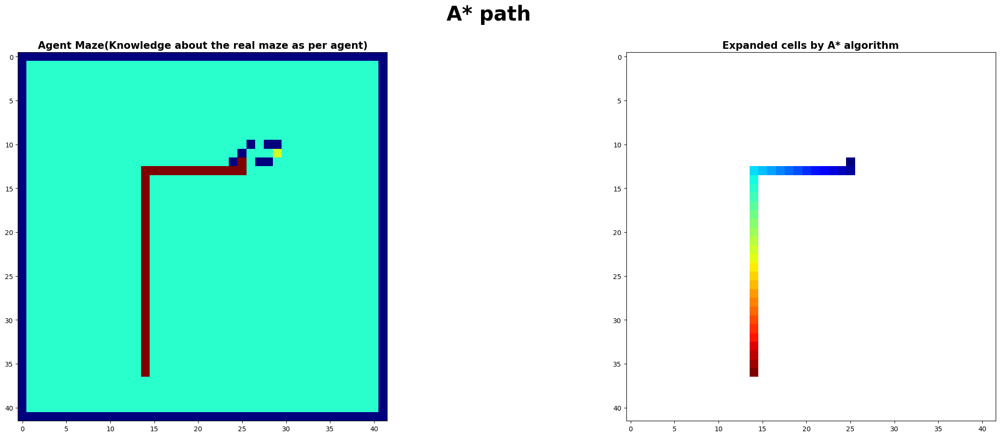

<Figure size 2000x2000 with 0 Axes>

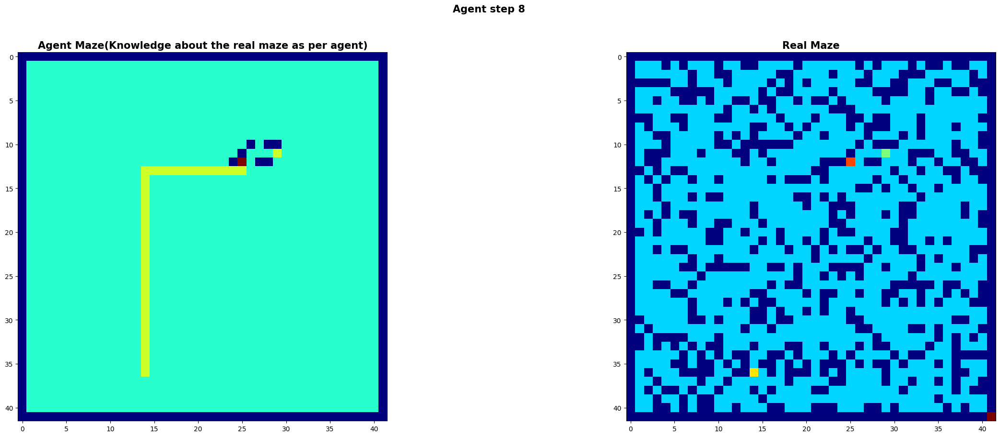

<Figure size 2000x2000 with 0 Axes>

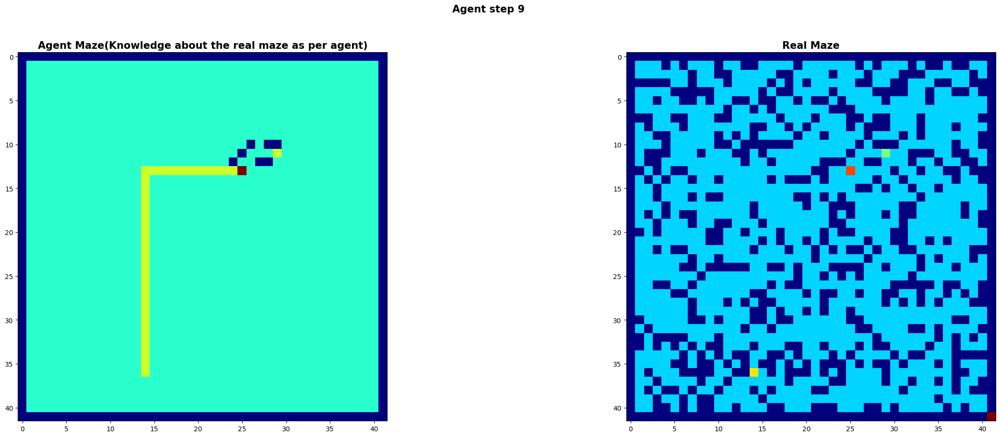

<Figure size 2000x2000 with 0 Axes>

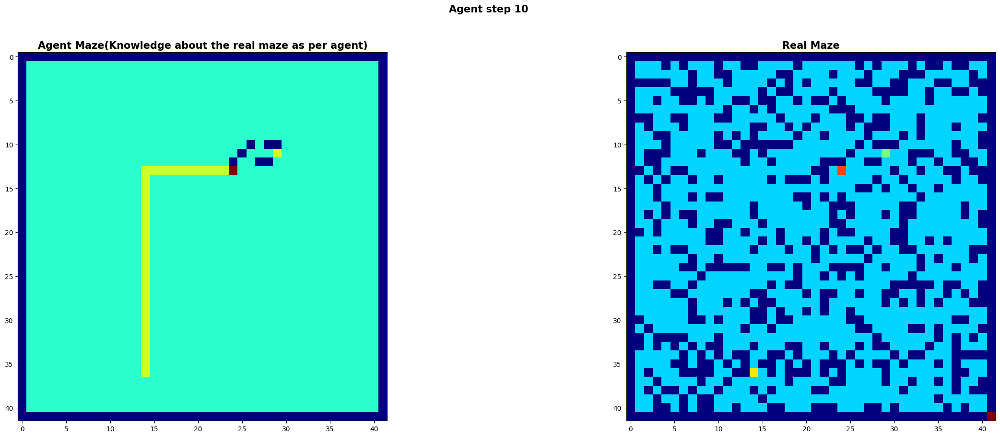

<Figure size 2000x2000 with 0 Axes>

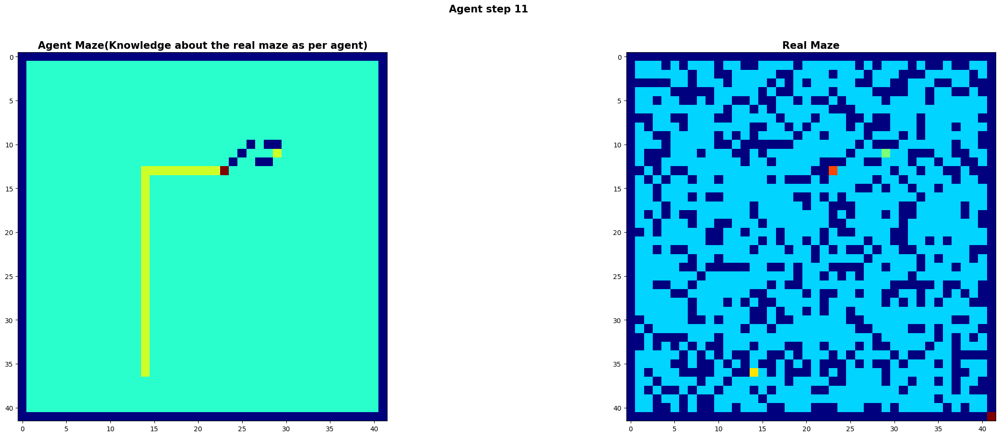

<Figure size 2000x2000 with 0 Axes>

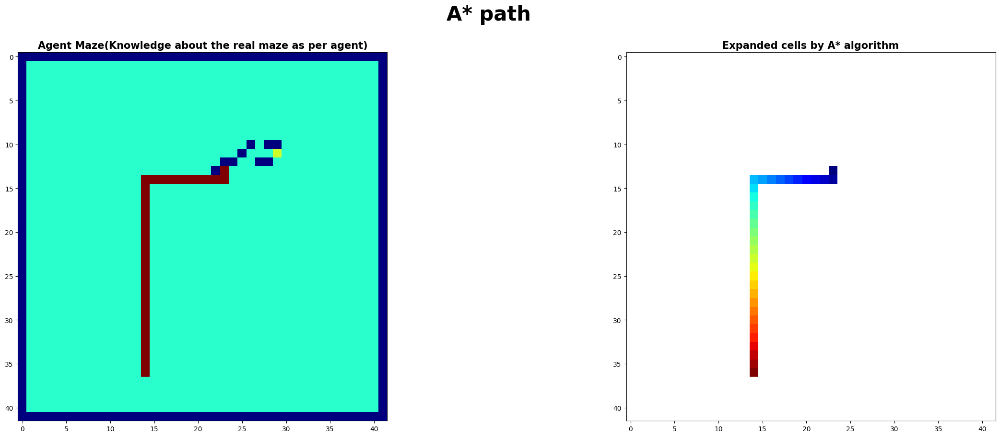

<Figure size 2000x2000 with 0 Axes>

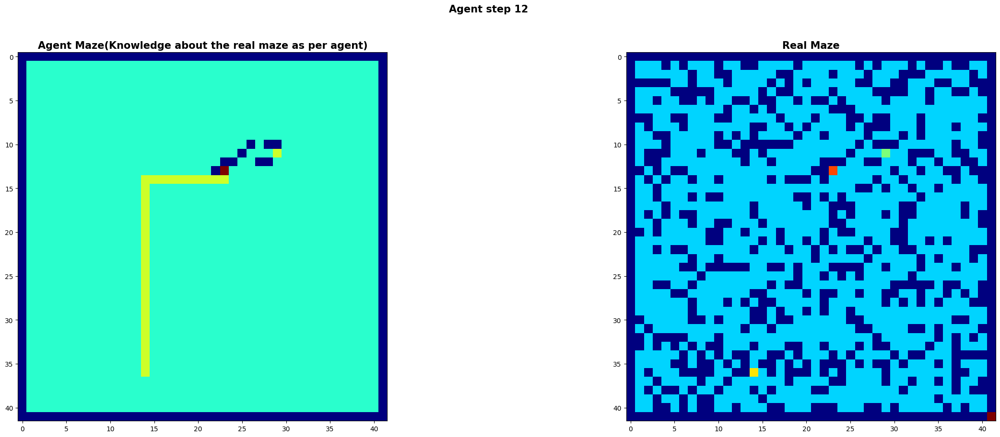

<Figure size 2000x2000 with 0 Axes>

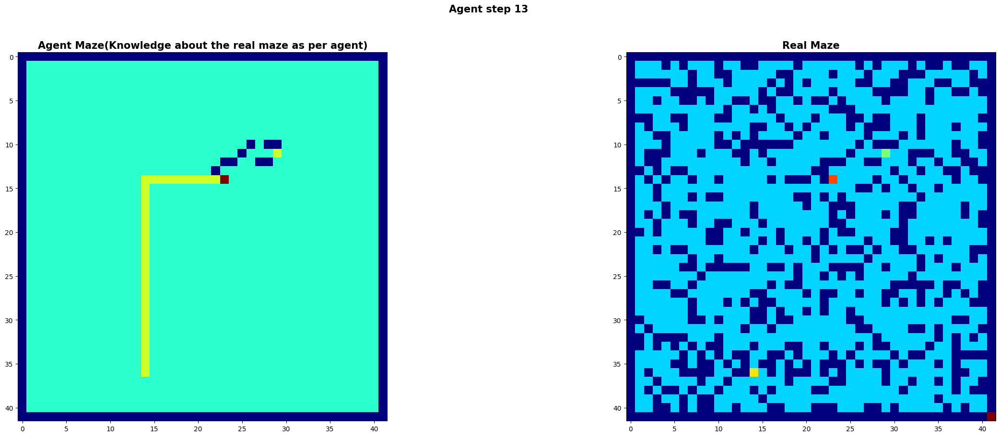

<Figure size 2000x2000 with 0 Axes>

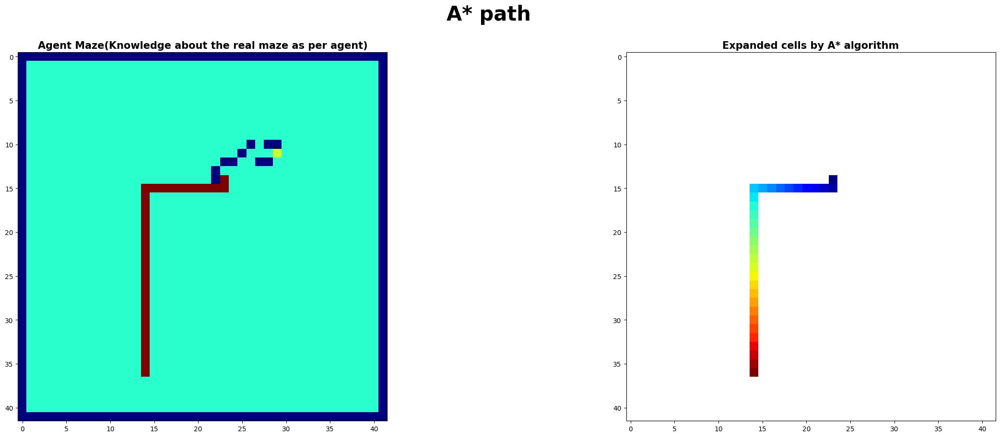

<Figure size 2000x2000 with 0 Axes>

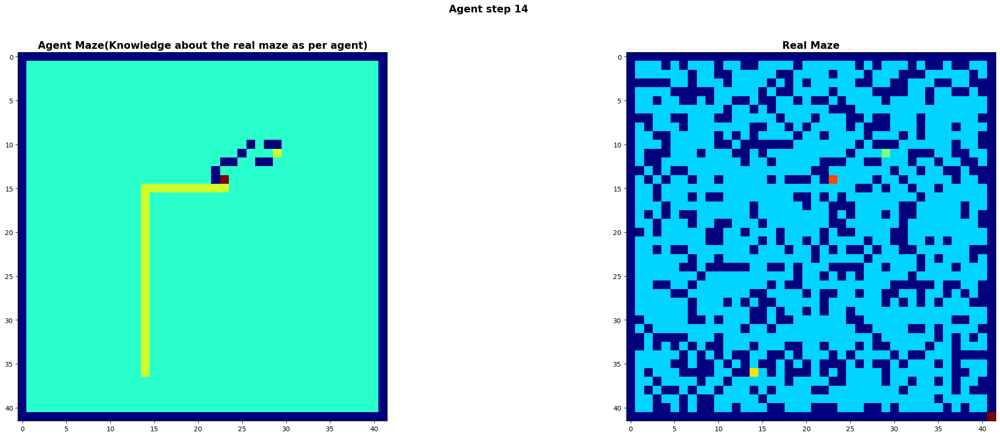

<Figure size 2000x2000 with 0 Axes>

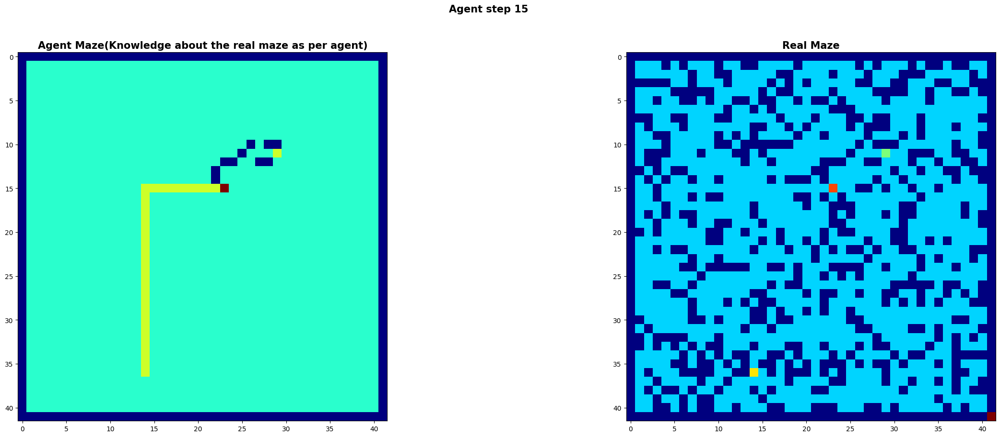

<Figure size 2000x2000 with 0 Axes>

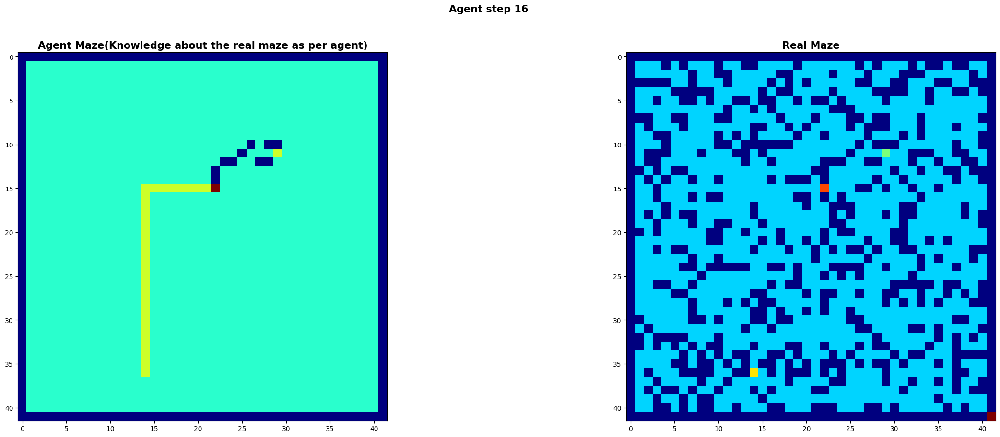

<Figure size 2000x2000 with 0 Axes>

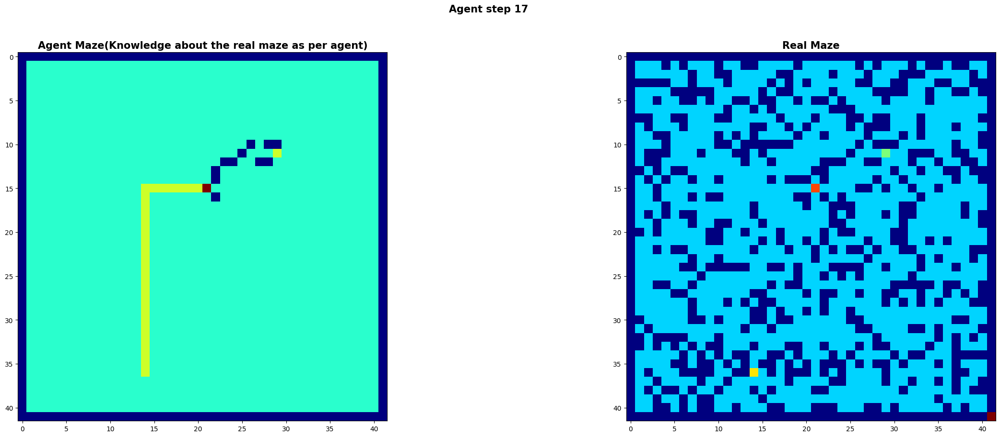

<Figure size 2000x2000 with 0 Axes>

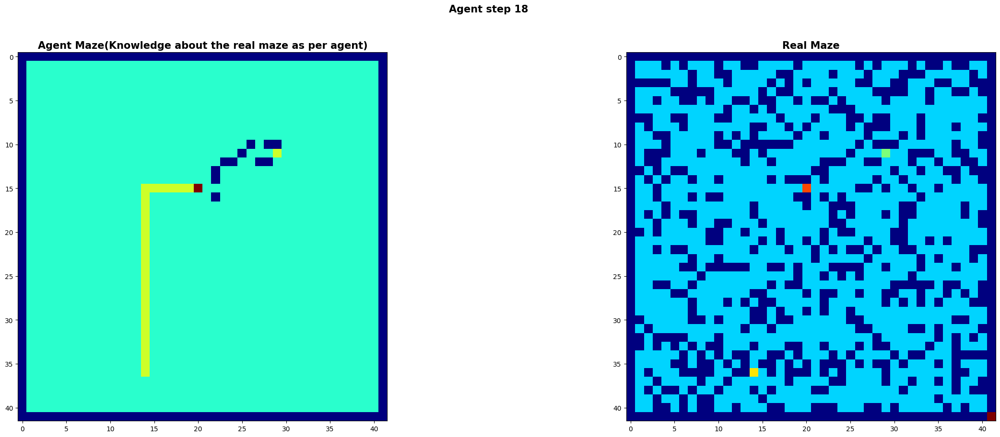

<Figure size 2000x2000 with 0 Axes>

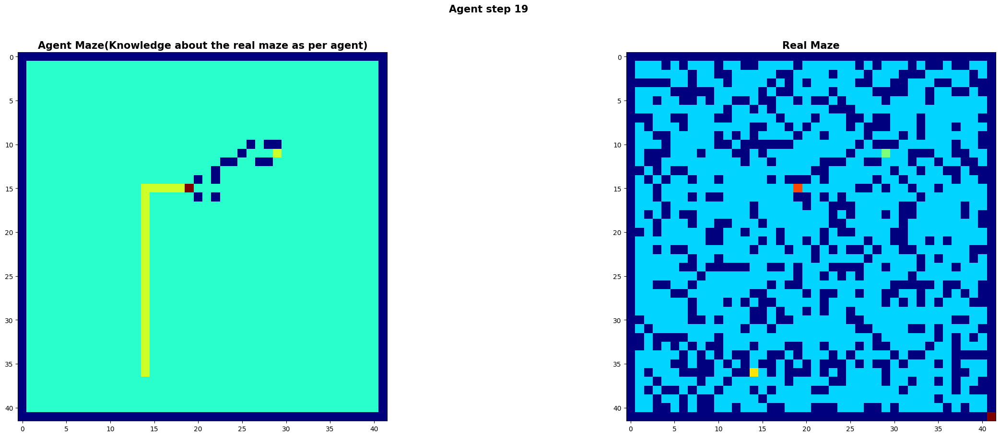

<Figure size 2000x2000 with 0 Axes>

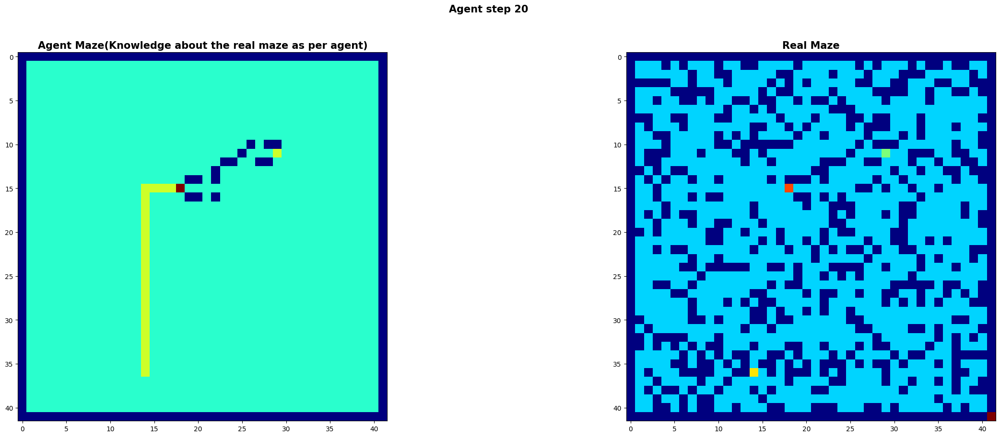

<Figure size 2000x2000 with 0 Axes>

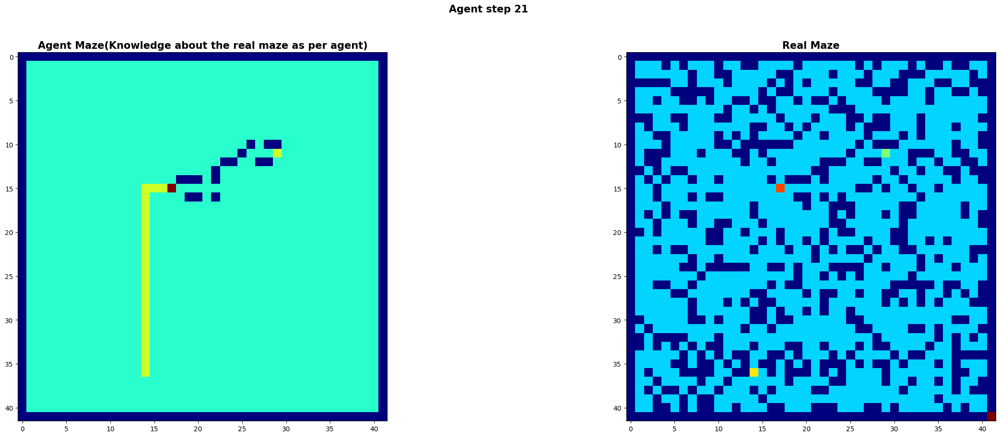

<Figure size 2000x2000 with 0 Axes>

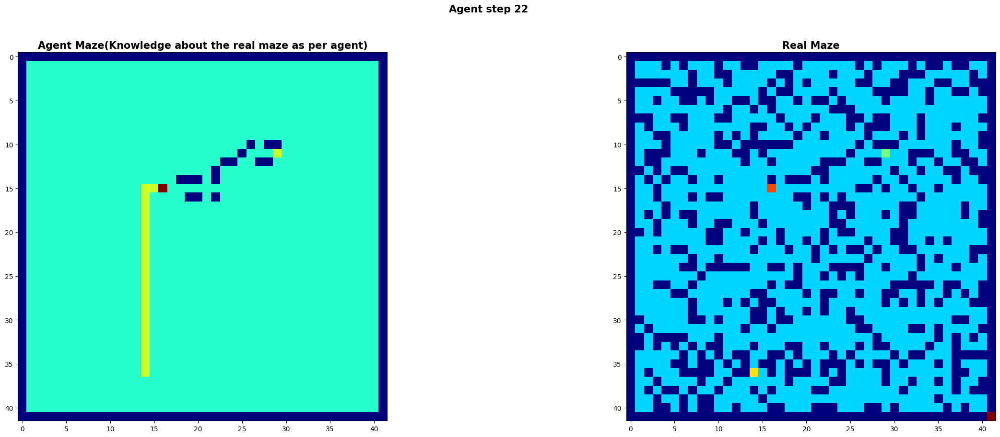

<Figure size 2000x2000 with 0 Axes>

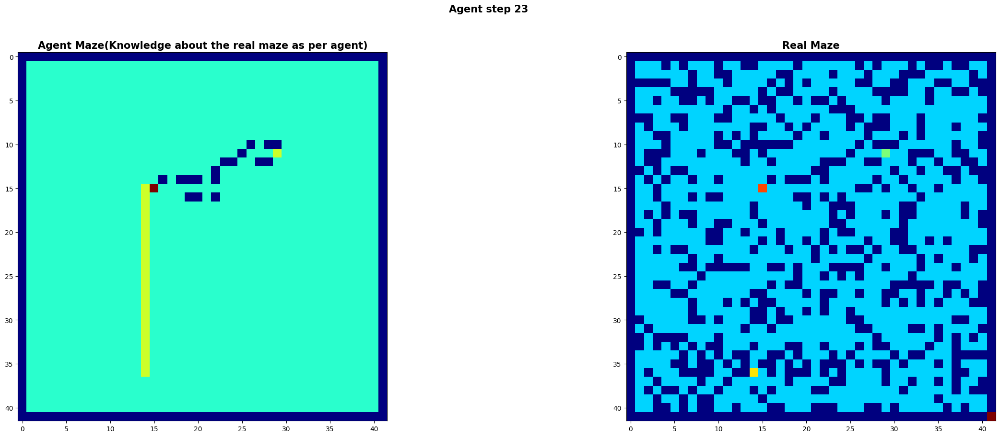

<Figure size 2000x2000 with 0 Axes>

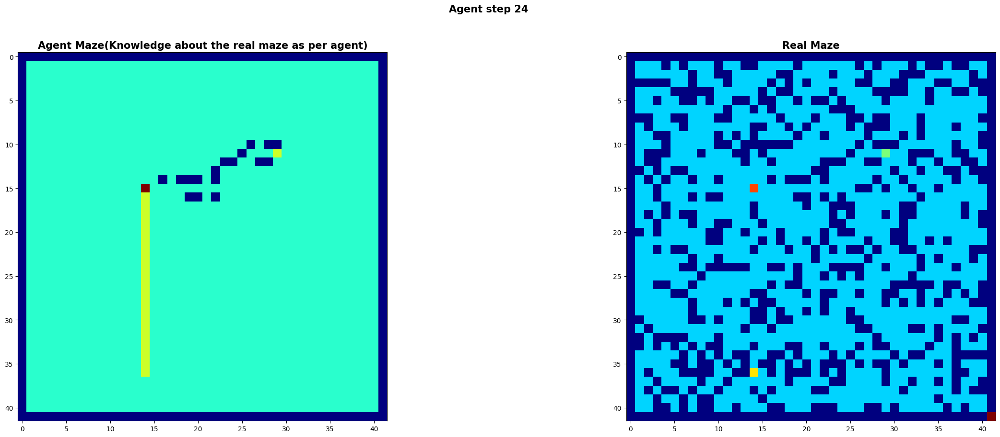

<Figure size 2000x2000 with 0 Axes>

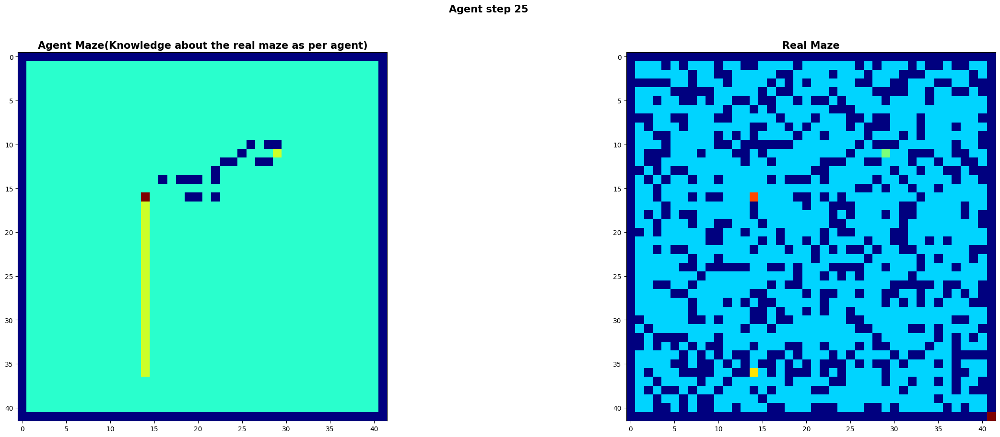

<Figure size 2000x2000 with 0 Axes>

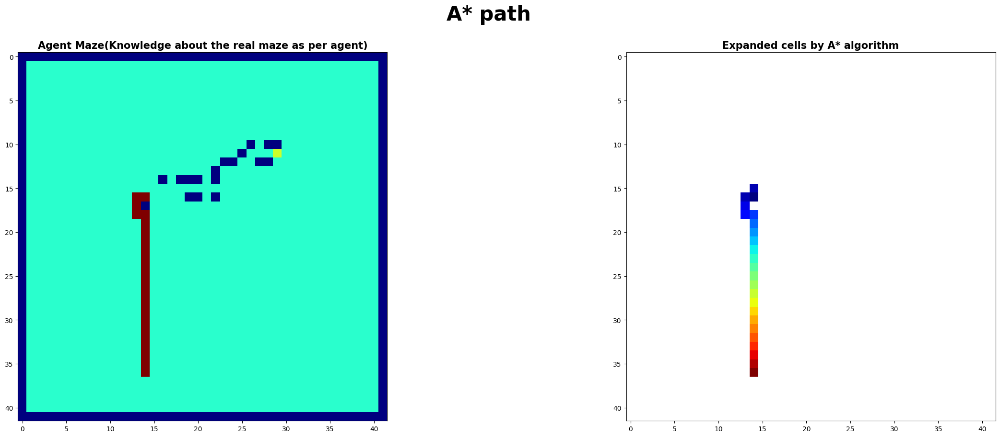

<Figure size 2000x2000 with 0 Axes>

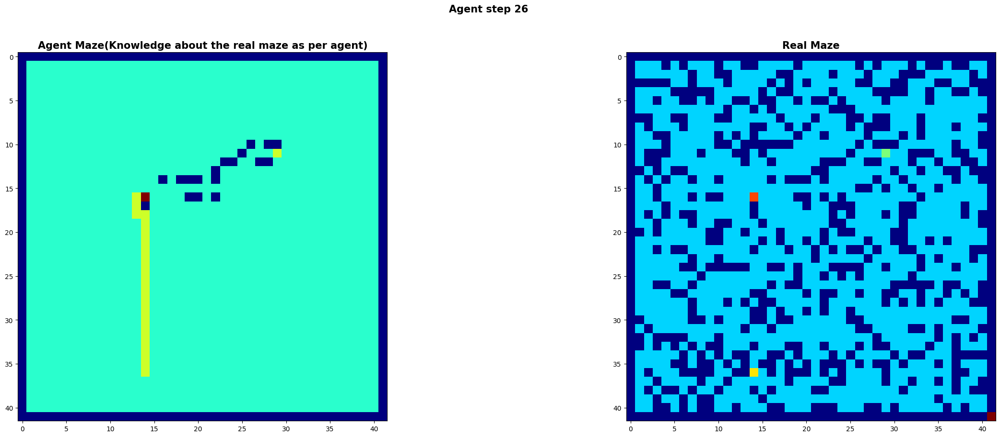

<Figure size 2000x2000 with 0 Axes>

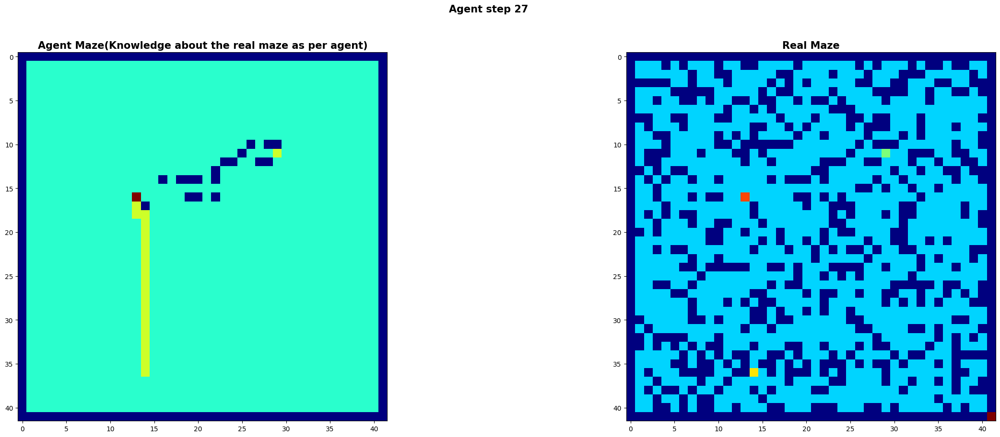

<Figure size 2000x2000 with 0 Axes>

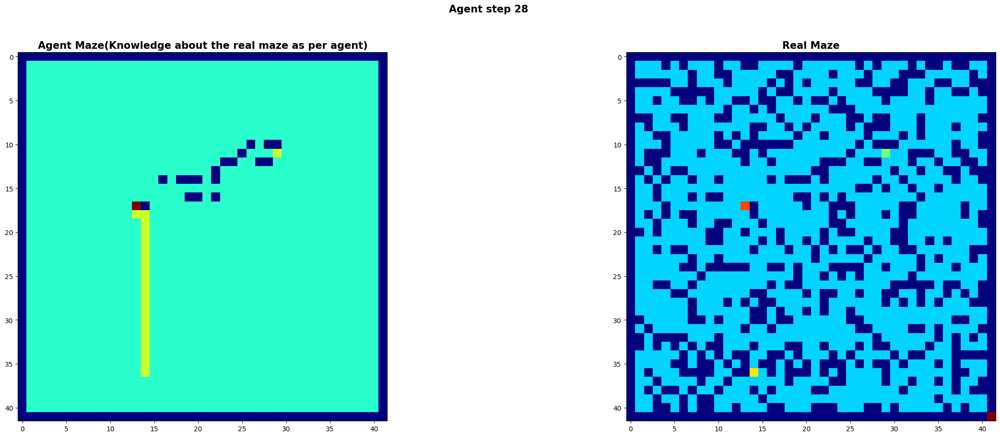

<Figure size 2000x2000 with 0 Axes>

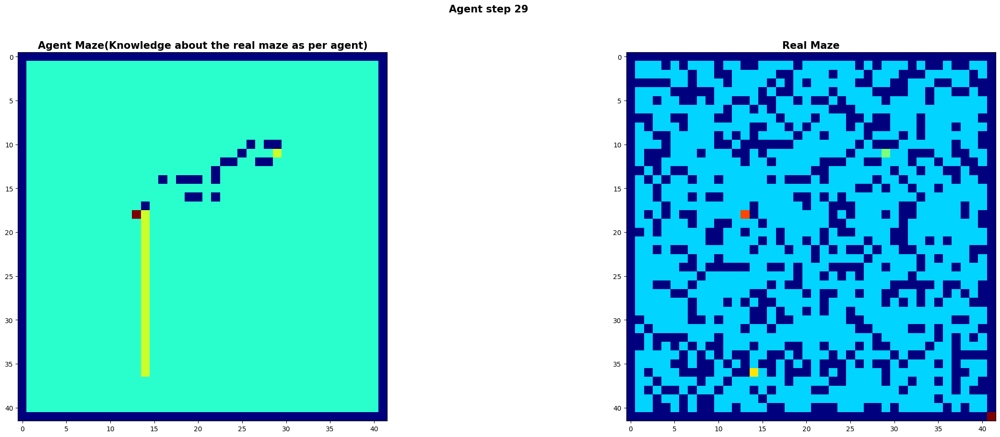

<Figure size 2000x2000 with 0 Axes>

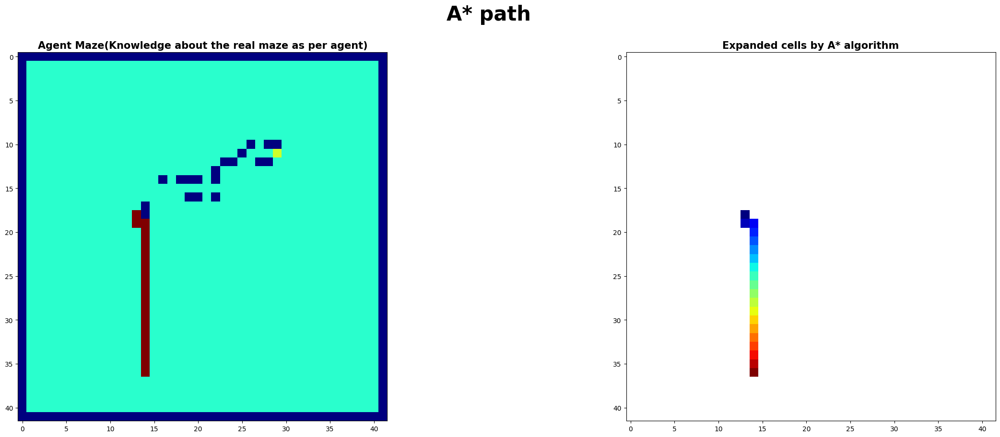

<Figure size 2000x2000 with 0 Axes>

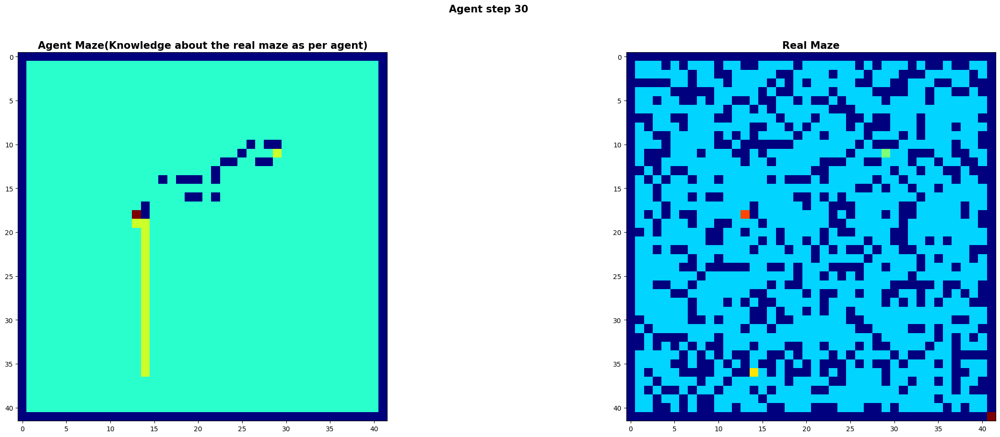

<Figure size 2000x2000 with 0 Axes>

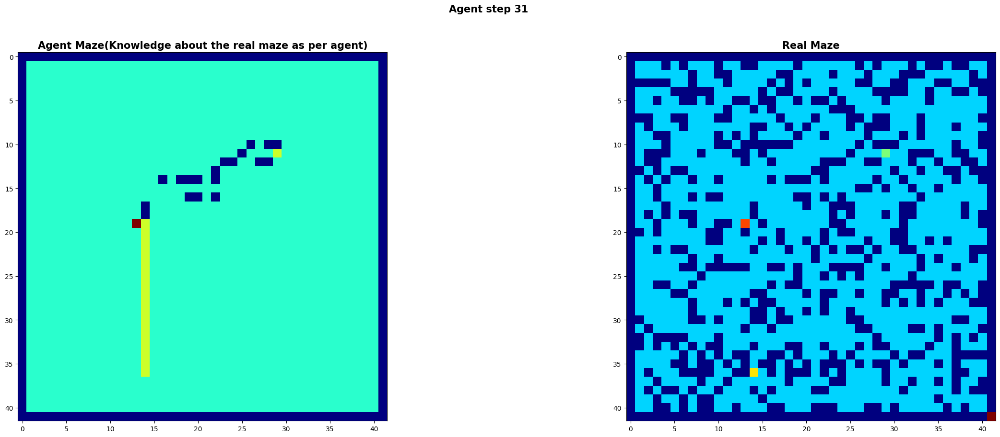

<Figure size 2000x2000 with 0 Axes>

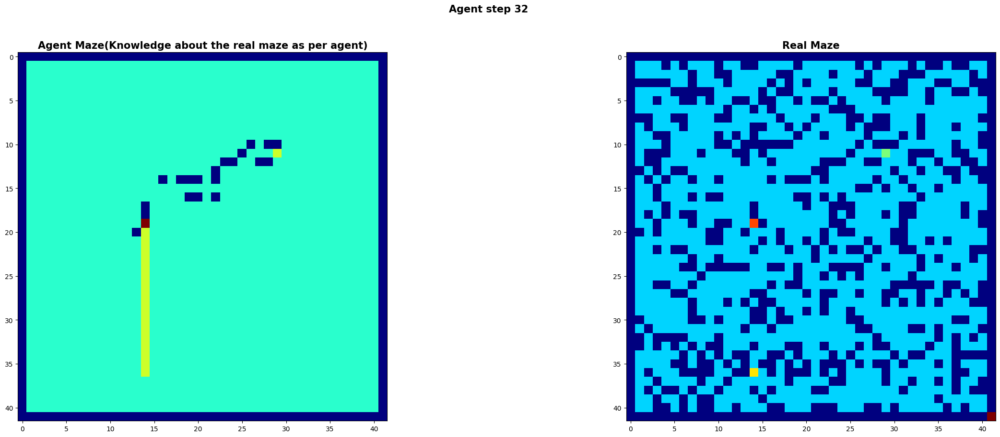

<Figure size 2000x2000 with 0 Axes>

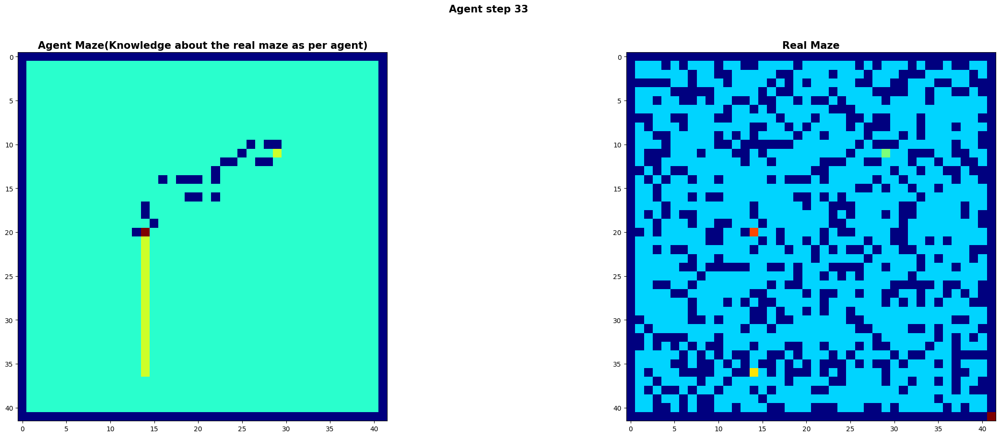

<Figure size 2000x2000 with 0 Axes>

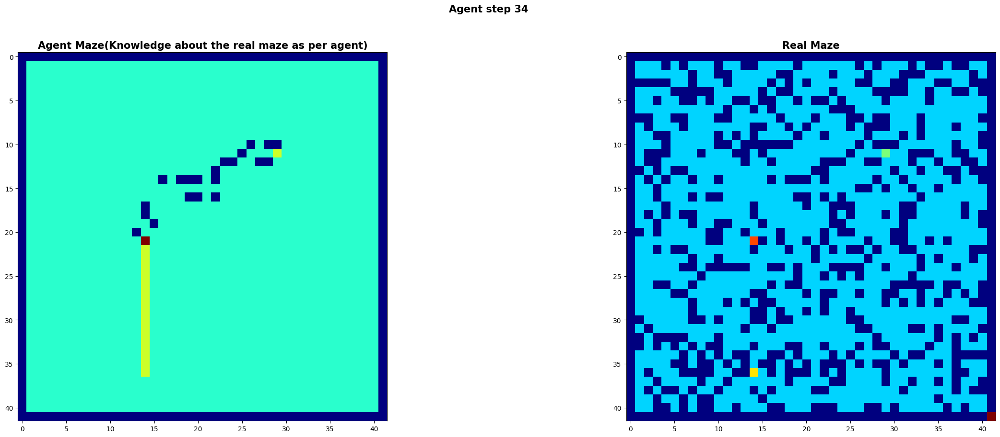

<Figure size 2000x2000 with 0 Axes>

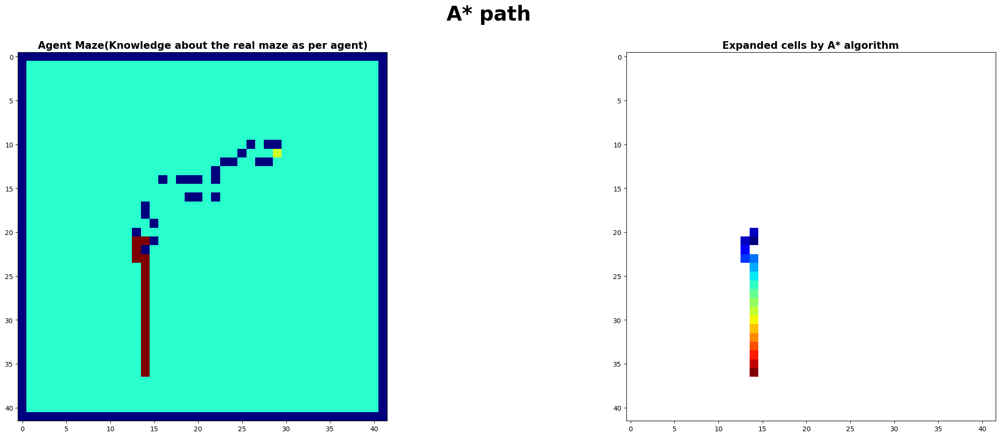

<Figure size 2000x2000 with 0 Axes>

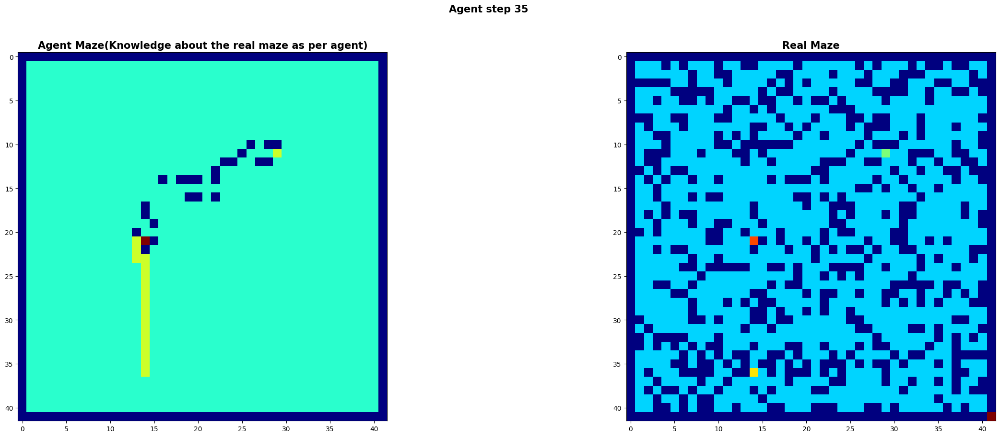

<Figure size 2000x2000 with 0 Axes>

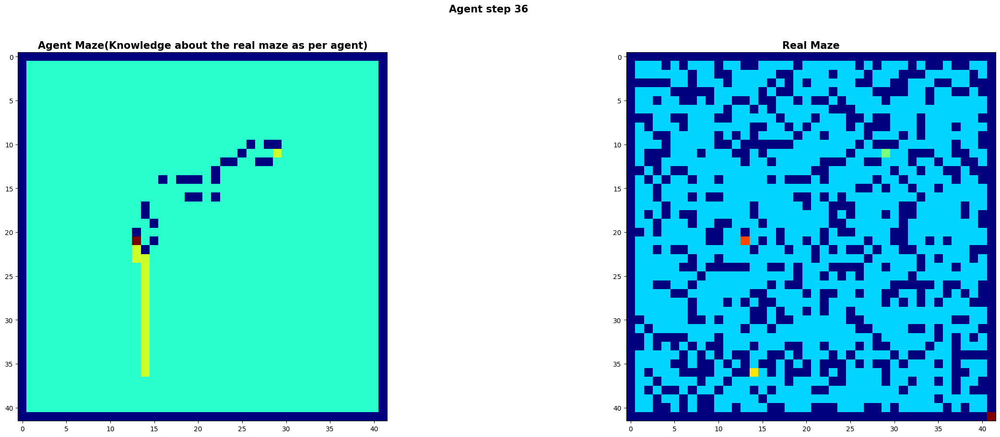

<Figure size 2000x2000 with 0 Axes>

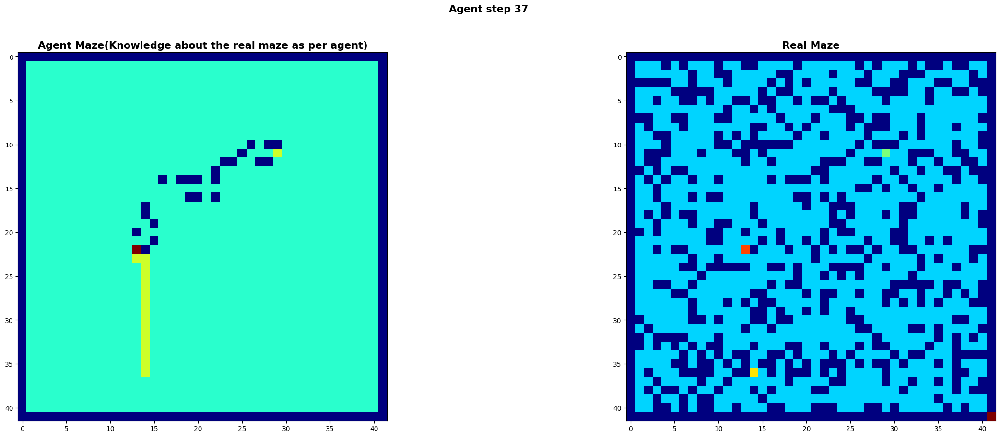

<Figure size 2000x2000 with 0 Axes>

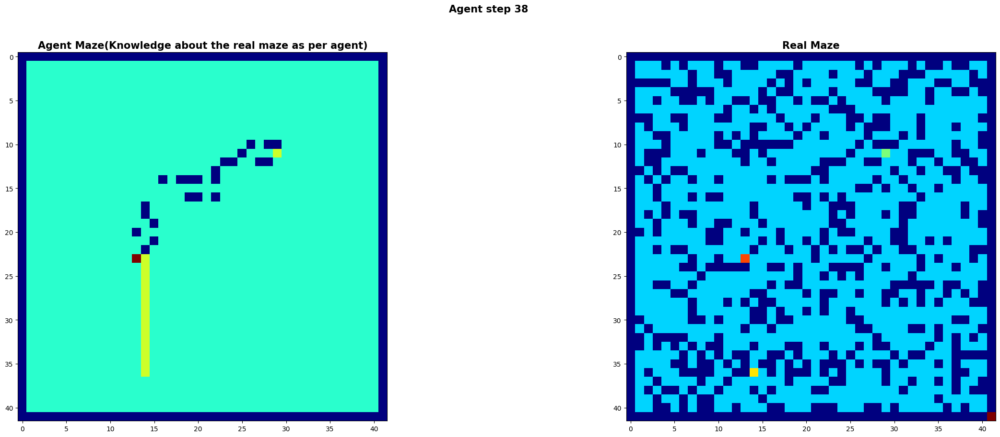

<Figure size 2000x2000 with 0 Axes>

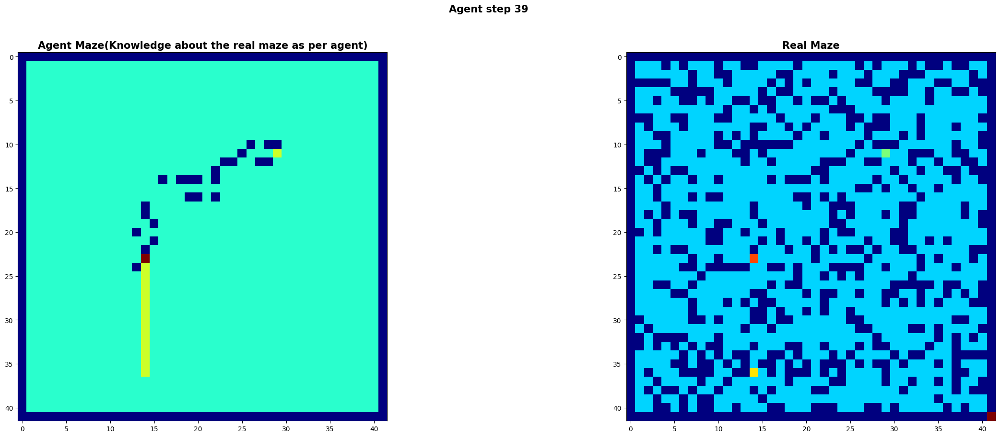

<Figure size 2000x2000 with 0 Axes>

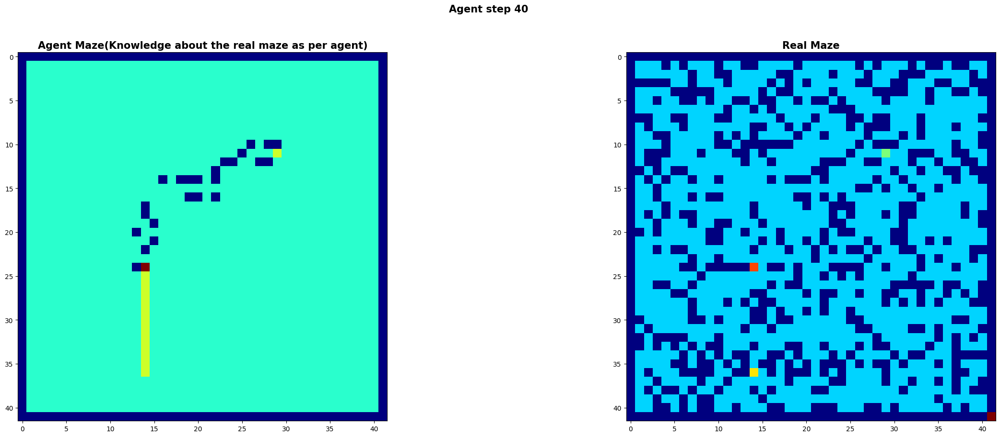

<Figure size 2000x2000 with 0 Axes>

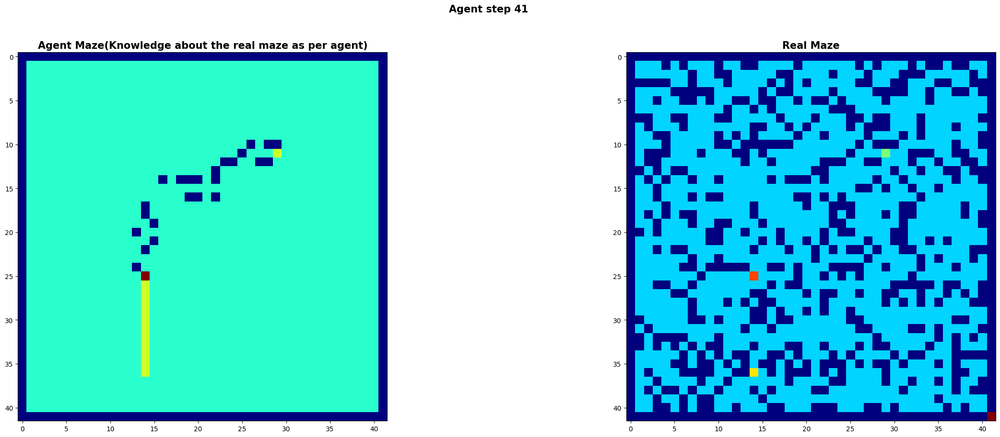

<Figure size 2000x2000 with 0 Axes>

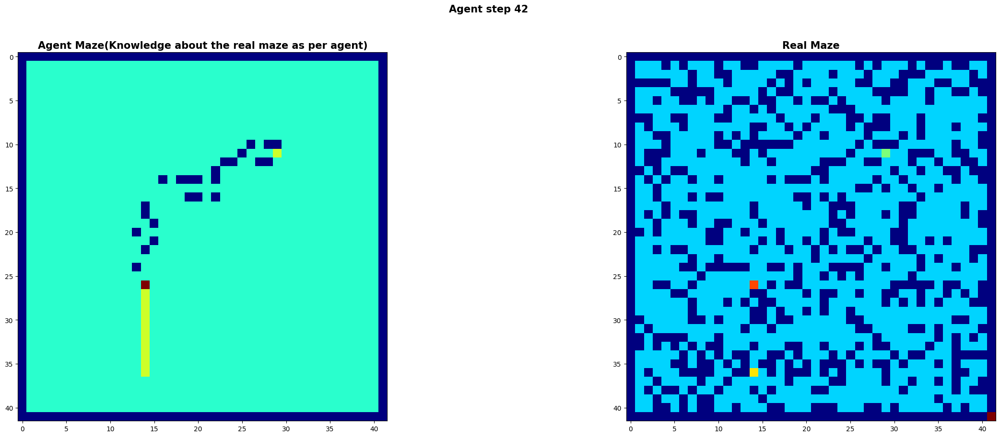

<Figure size 2000x2000 with 0 Axes>

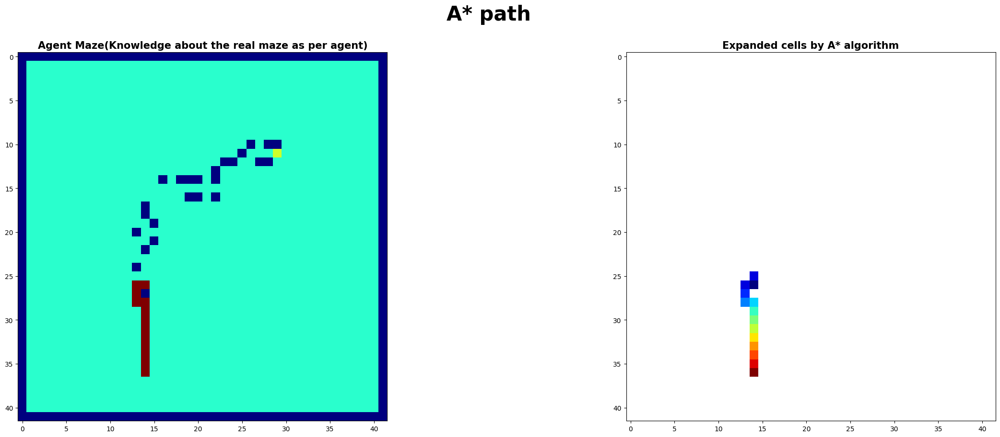

<Figure size 2000x2000 with 0 Axes>

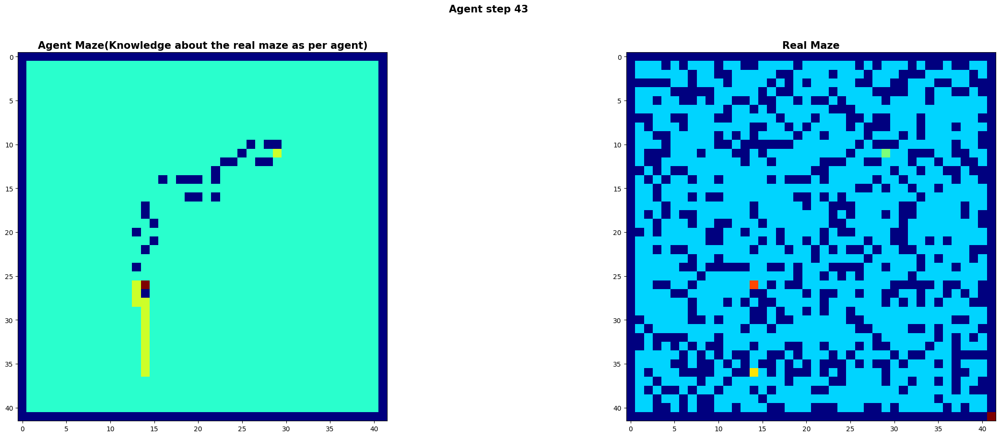

<Figure size 2000x2000 with 0 Axes>

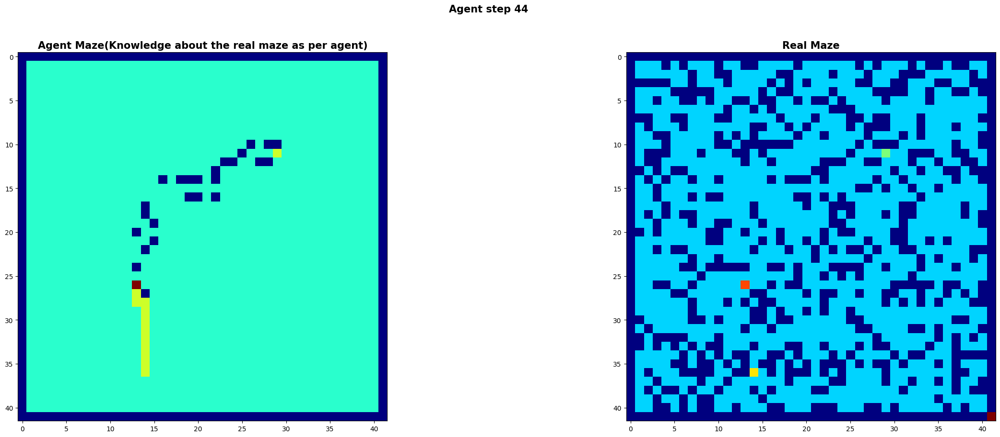

<Figure size 2000x2000 with 0 Axes>

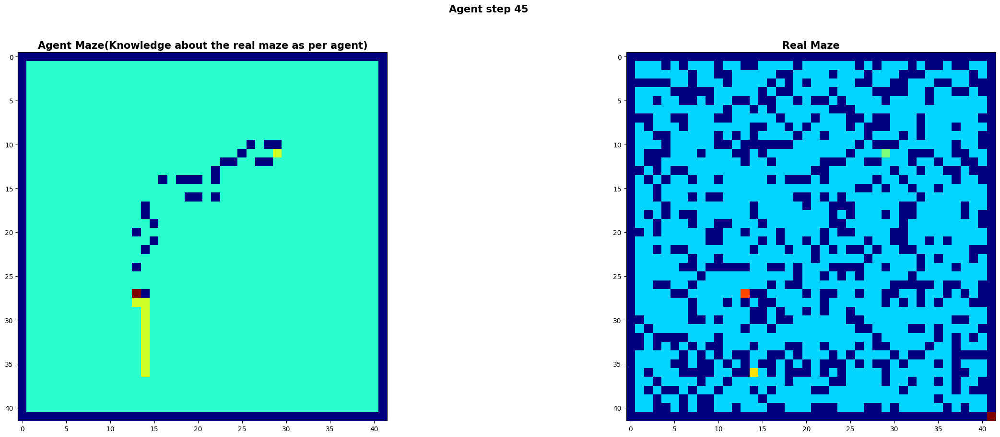

<Figure size 2000x2000 with 0 Axes>

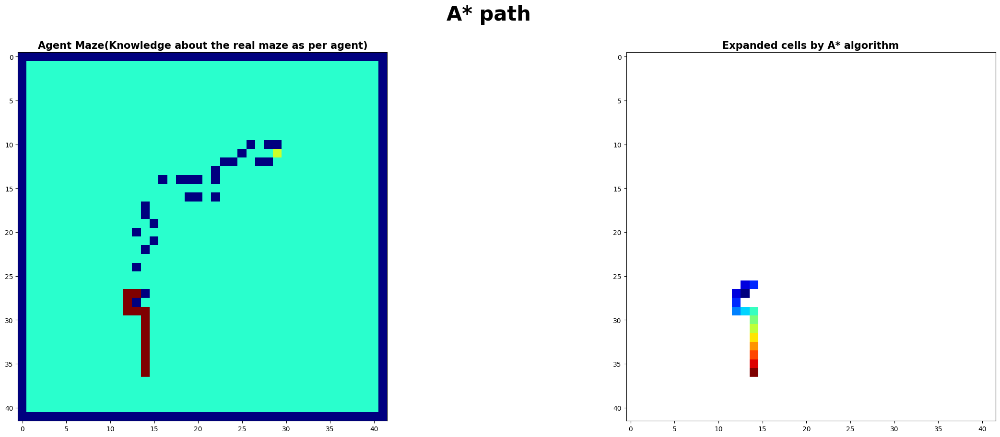

<Figure size 2000x2000 with 0 Axes>

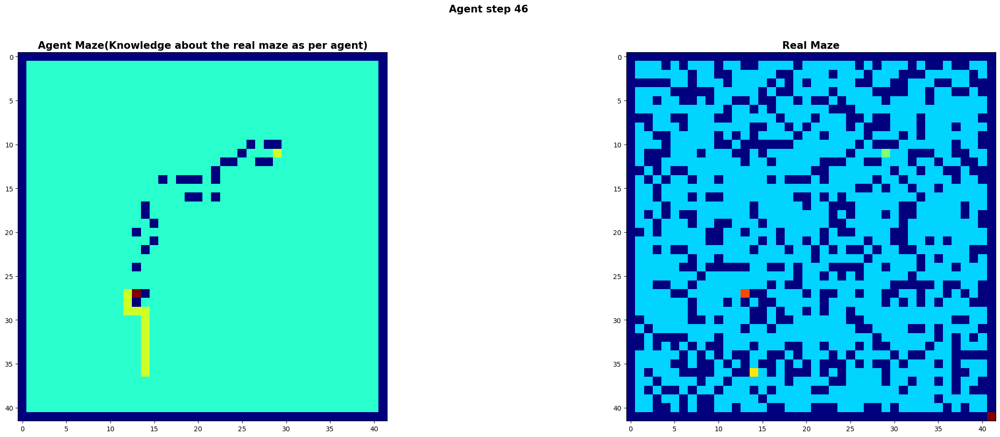

<Figure size 2000x2000 with 0 Axes>

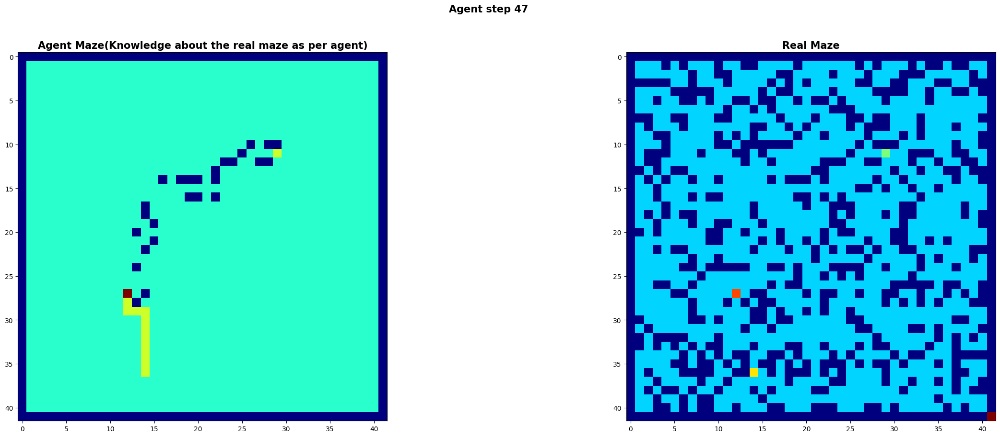

<Figure size 2000x2000 with 0 Axes>

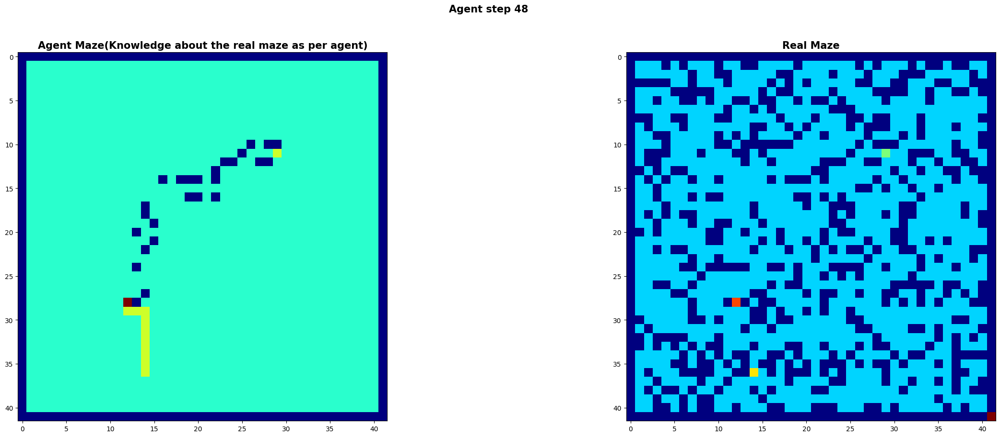

<Figure size 2000x2000 with 0 Axes>

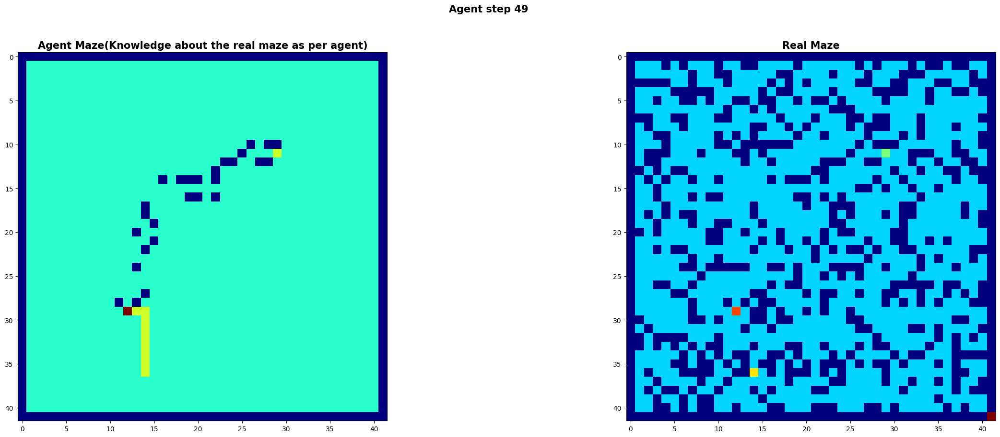

<Figure size 2000x2000 with 0 Axes>

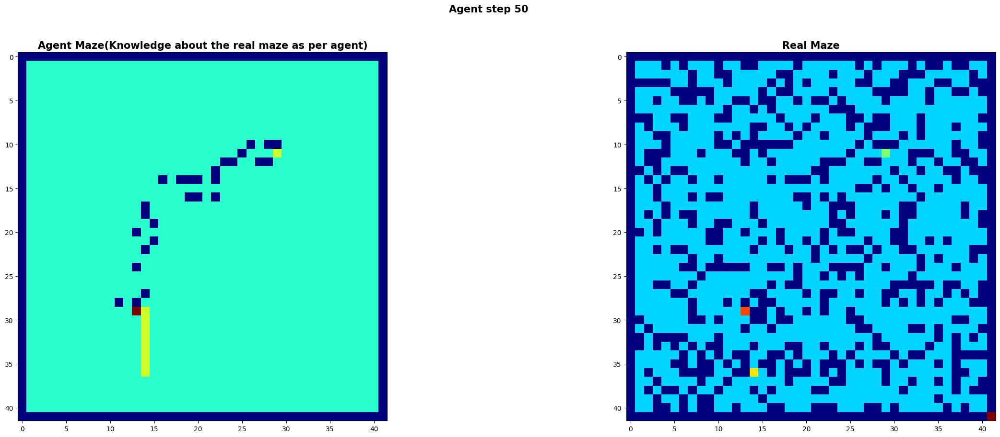

<Figure size 2000x2000 with 0 Axes>

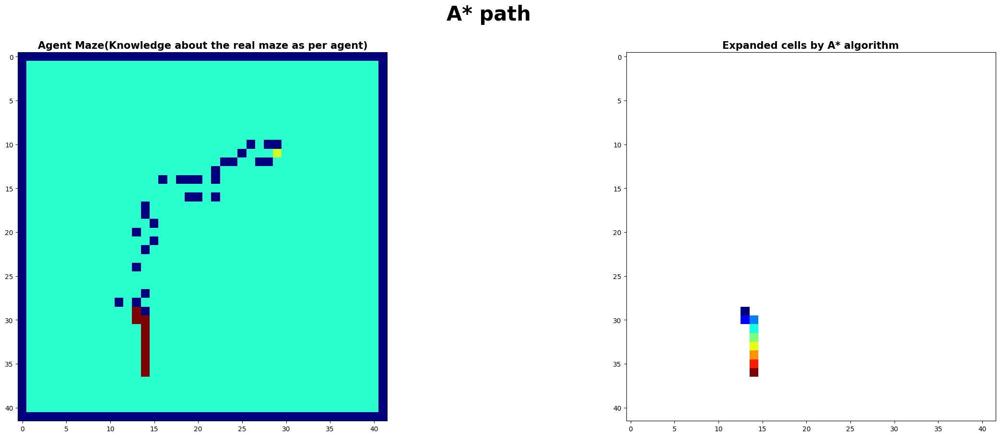

<Figure size 2000x2000 with 0 Axes>

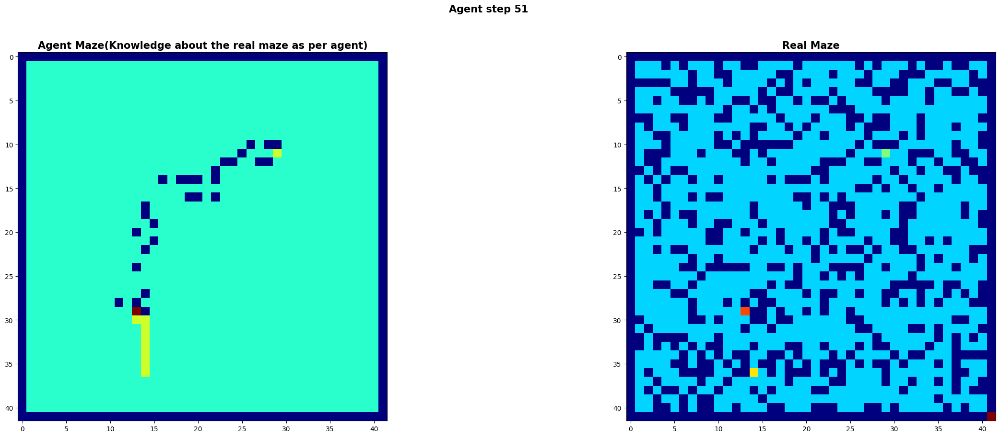

<Figure size 2000x2000 with 0 Axes>

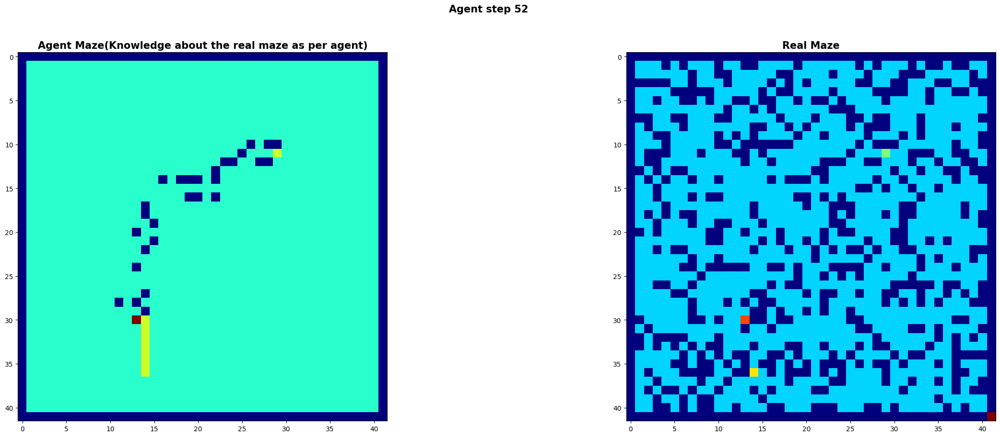

<Figure size 2000x2000 with 0 Axes>

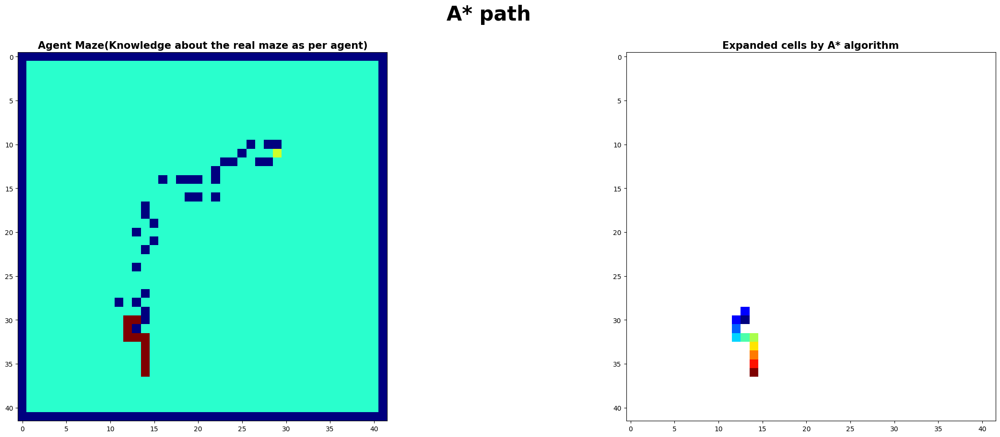

<Figure size 2000x2000 with 0 Axes>

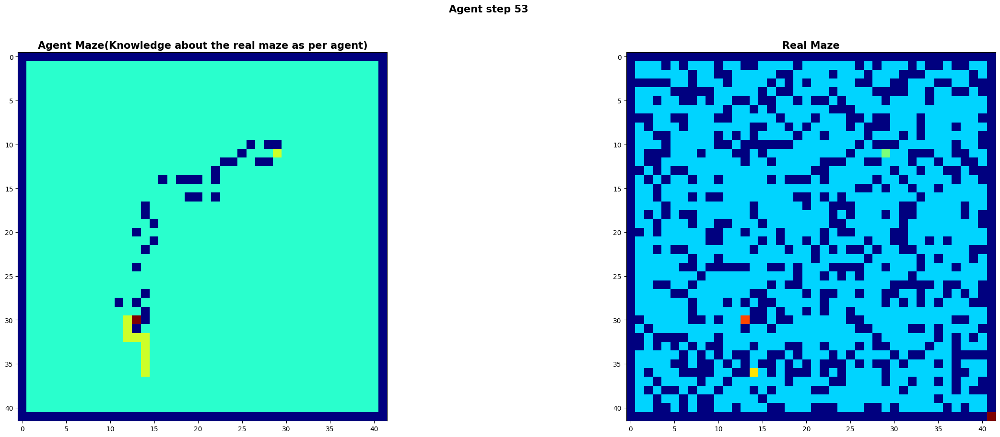

<Figure size 2000x2000 with 0 Axes>

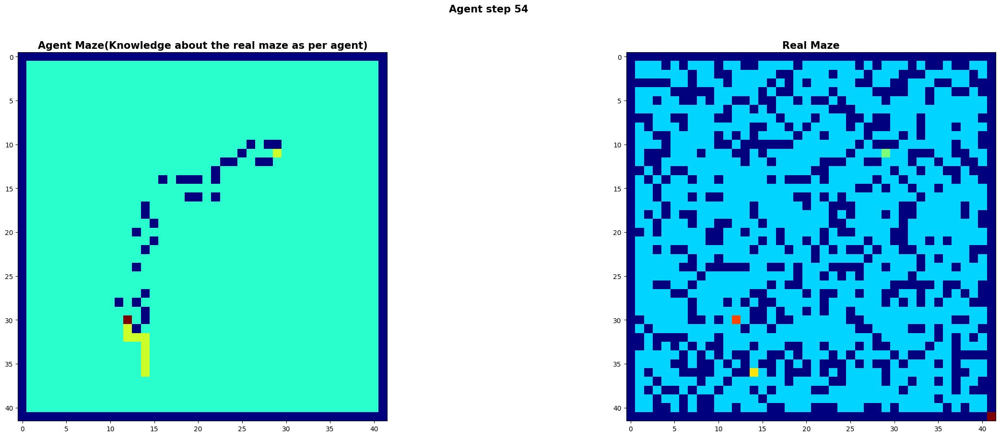

<Figure size 2000x2000 with 0 Axes>

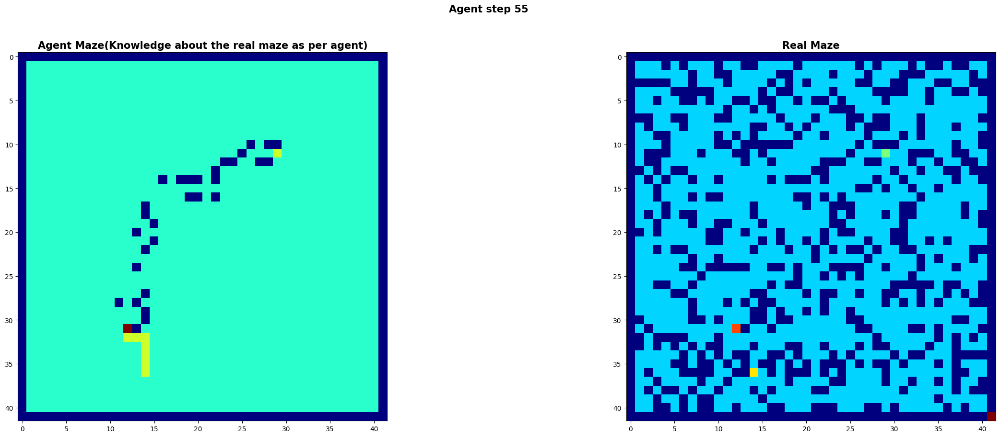

<Figure size 2000x2000 with 0 Axes>

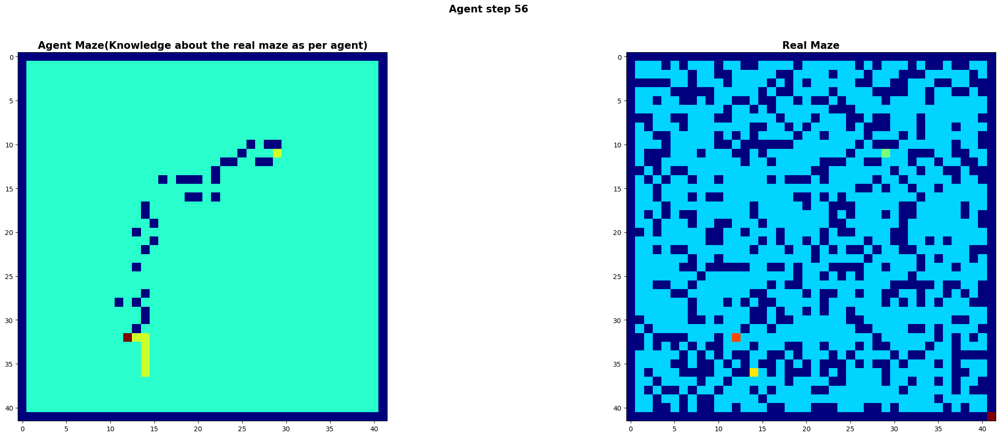

<Figure size 2000x2000 with 0 Axes>

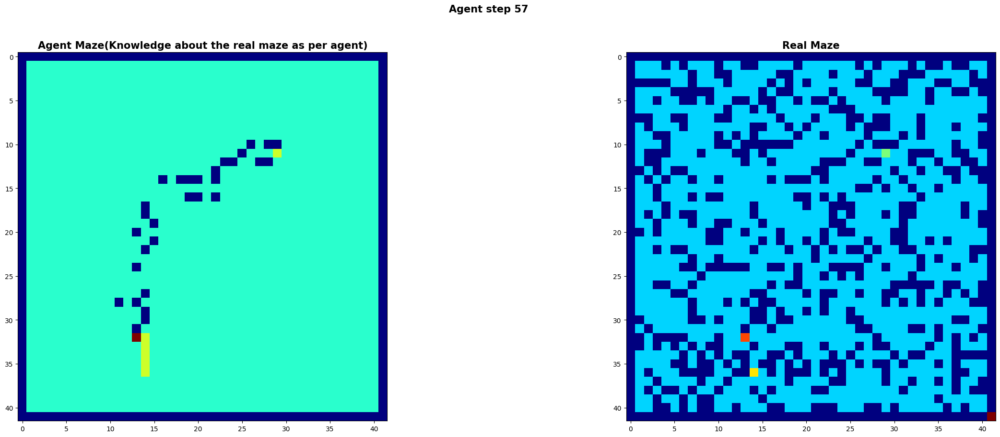

<Figure size 2000x2000 with 0 Axes>

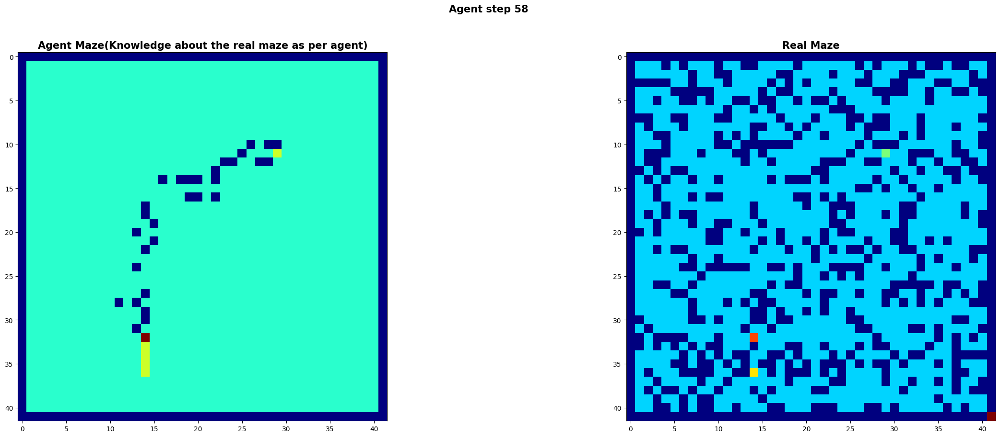

<Figure size 2000x2000 with 0 Axes>

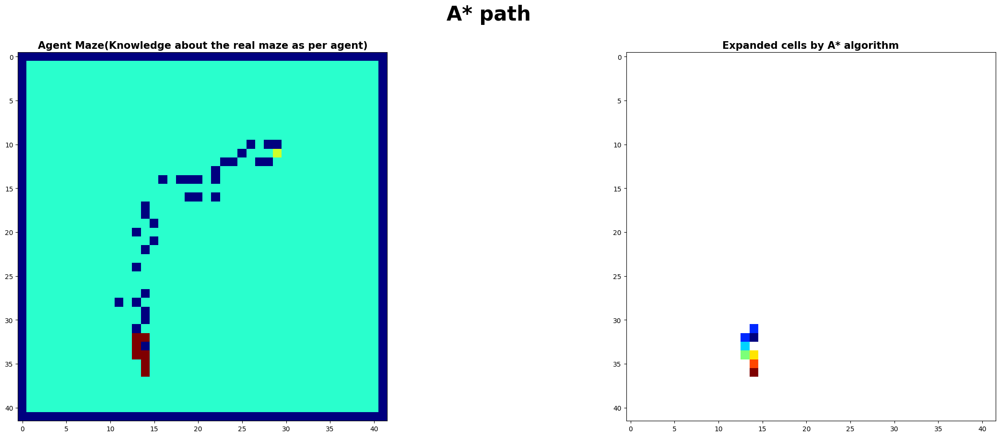

<Figure size 2000x2000 with 0 Axes>

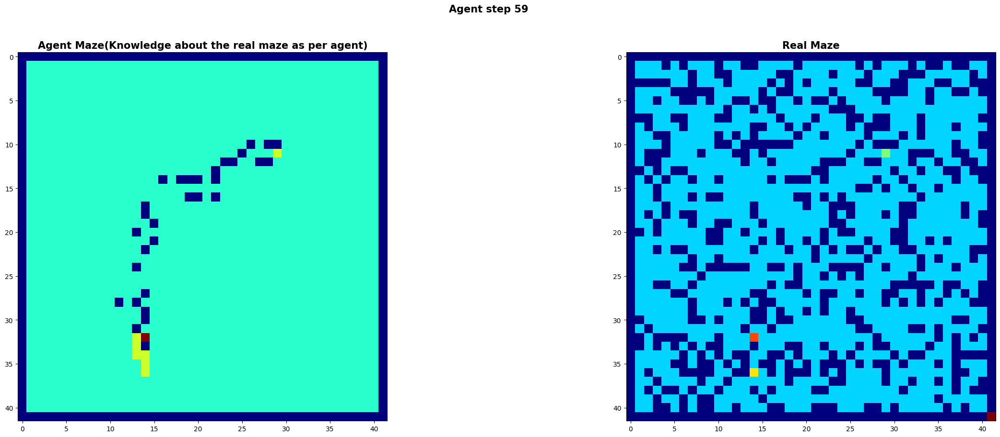

<Figure size 2000x2000 with 0 Axes>

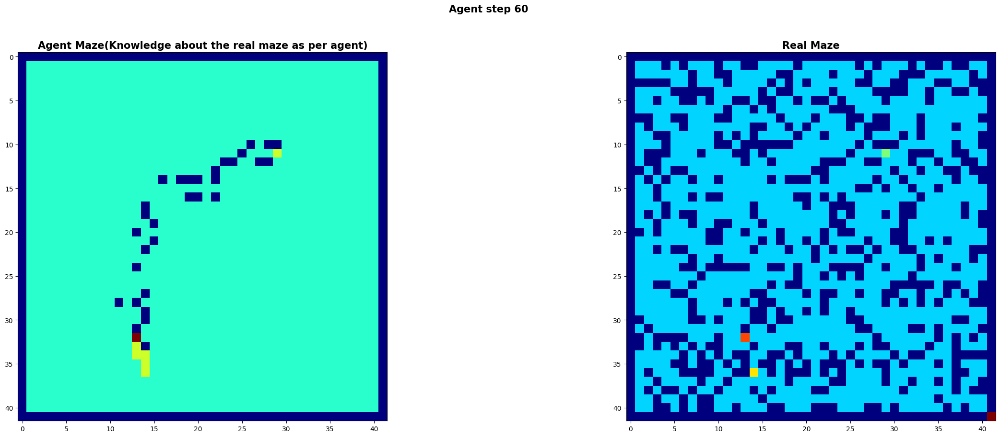

<Figure size 2000x2000 with 0 Axes>

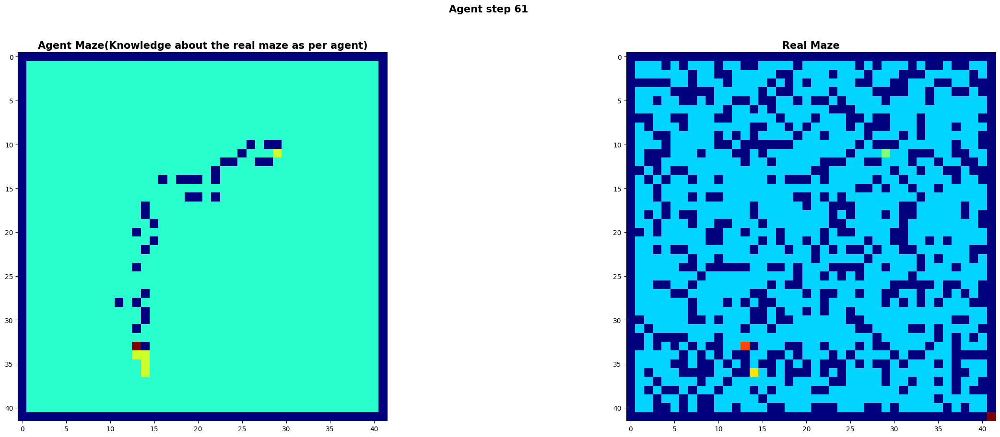

<Figure size 2000x2000 with 0 Axes>

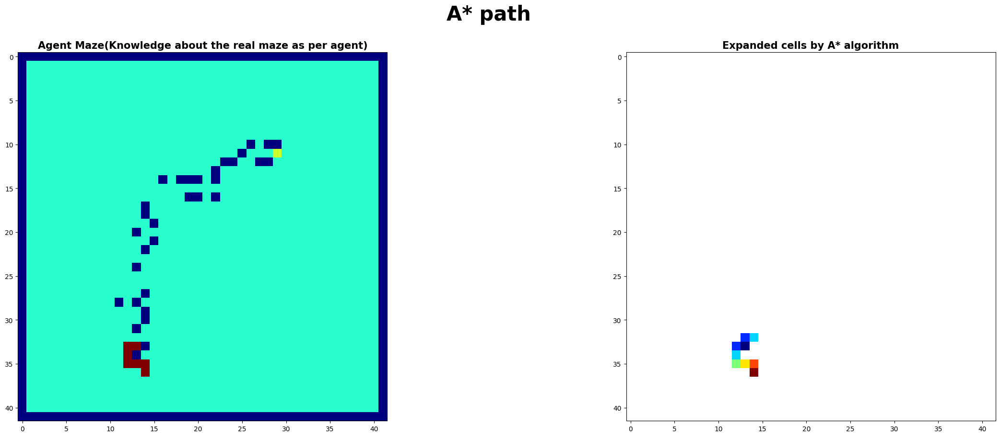

<Figure size 2000x2000 with 0 Axes>

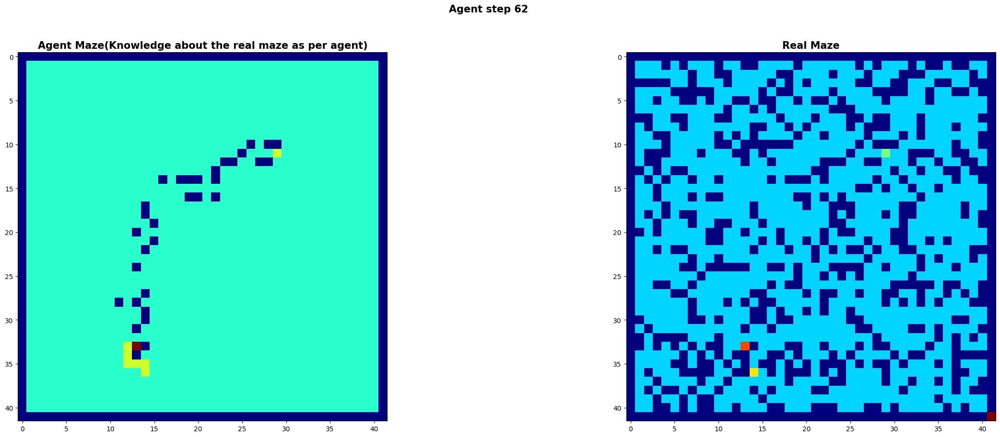

<Figure size 2000x2000 with 0 Axes>

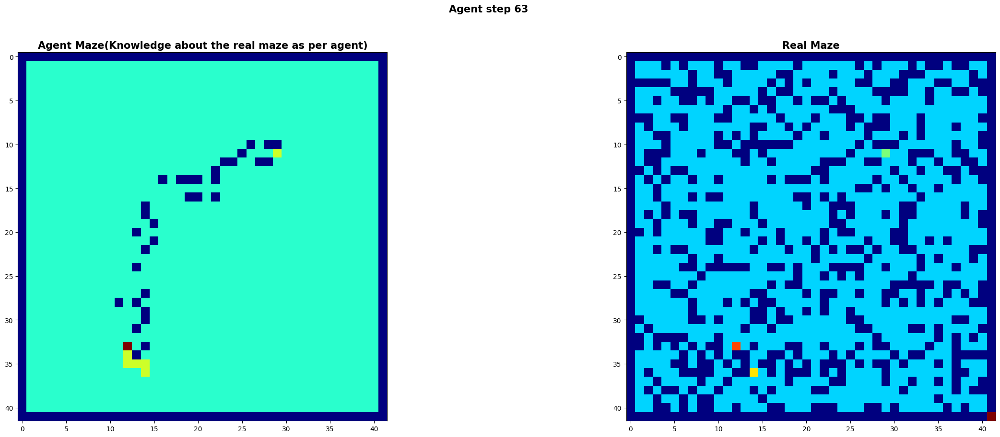

<Figure size 2000x2000 with 0 Axes>

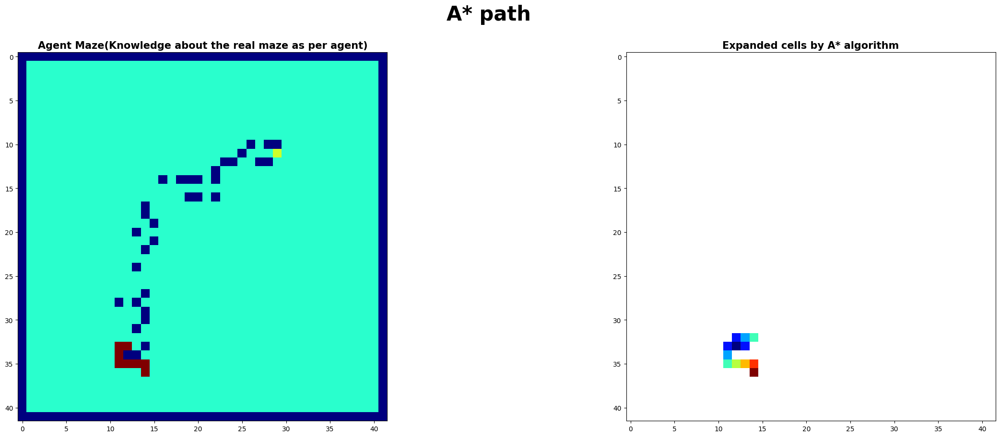

<Figure size 2000x2000 with 0 Axes>

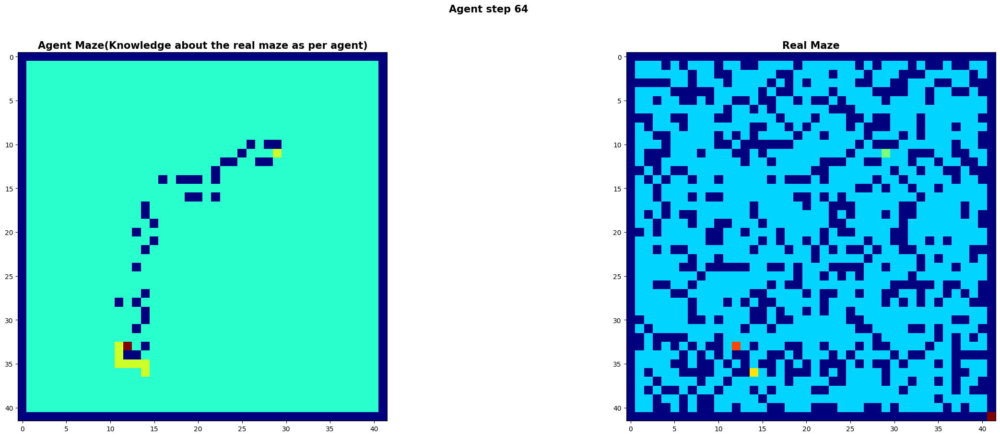

<Figure size 2000x2000 with 0 Axes>

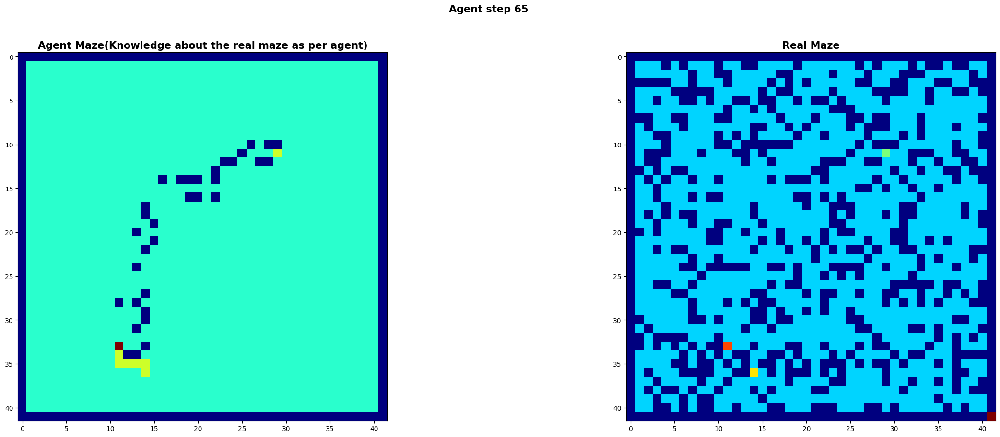

<Figure size 2000x2000 with 0 Axes>

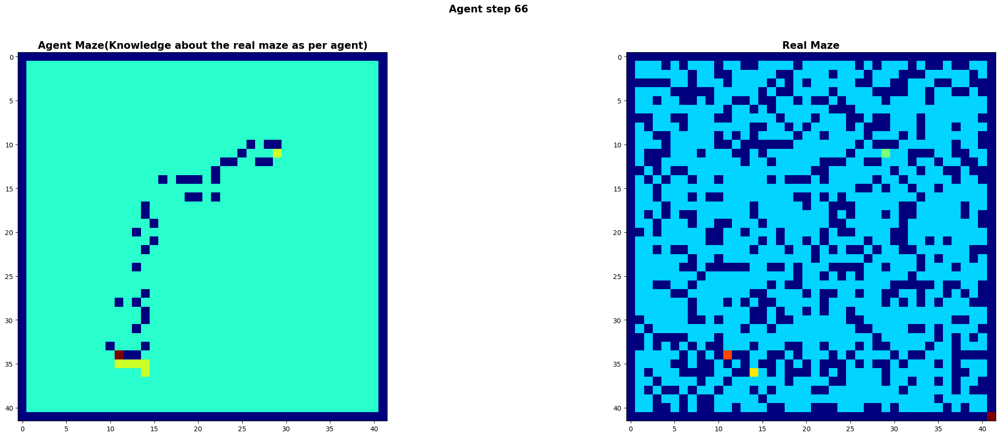

<Figure size 2000x2000 with 0 Axes>

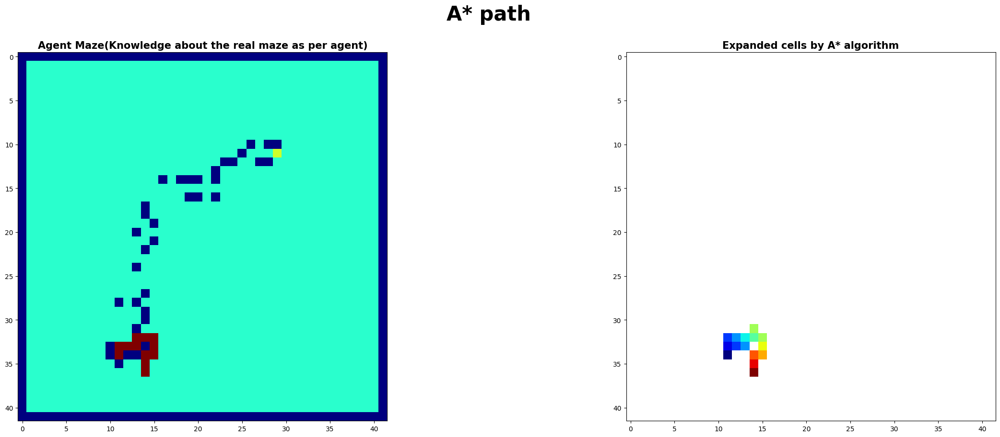

<Figure size 2000x2000 with 0 Axes>

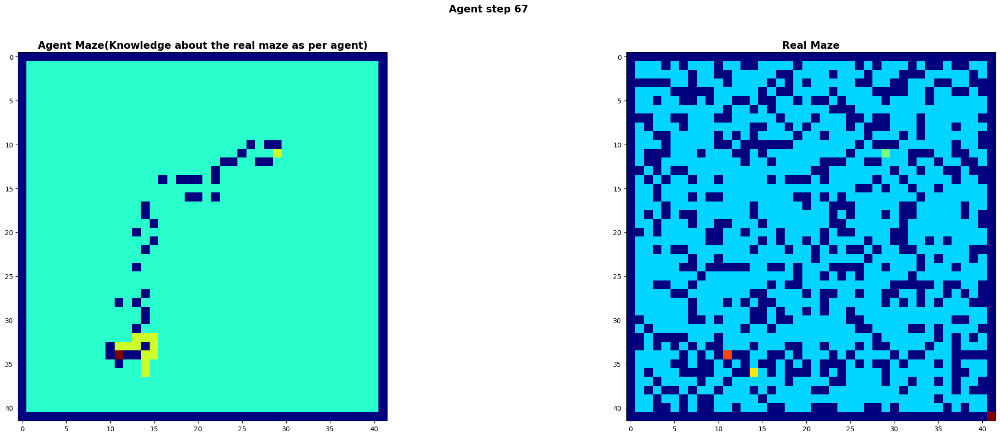

<Figure size 2000x2000 with 0 Axes>

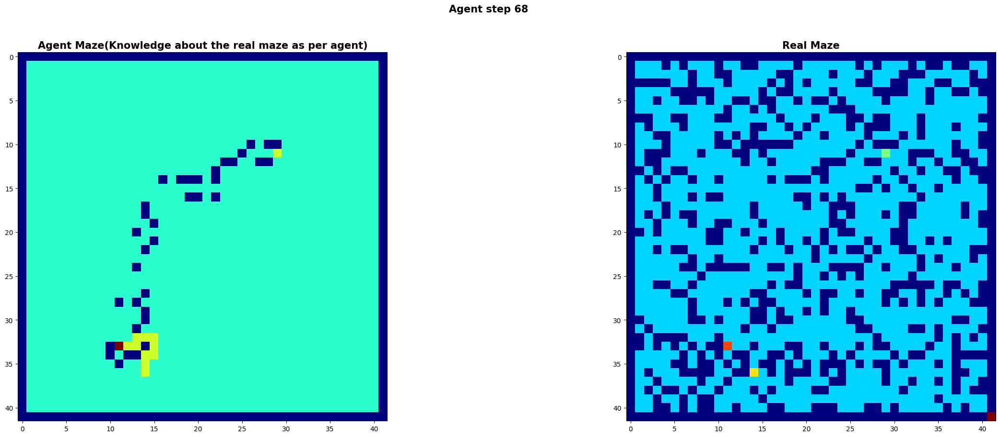

<Figure size 2000x2000 with 0 Axes>

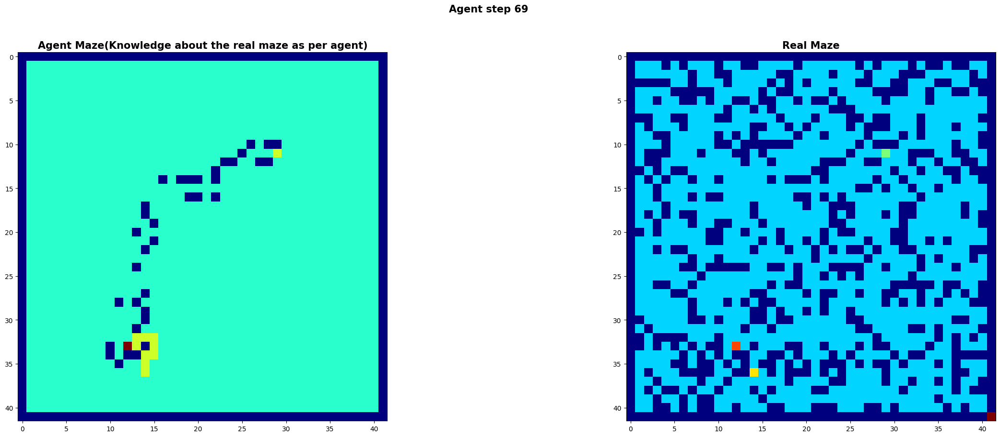

<Figure size 2000x2000 with 0 Axes>

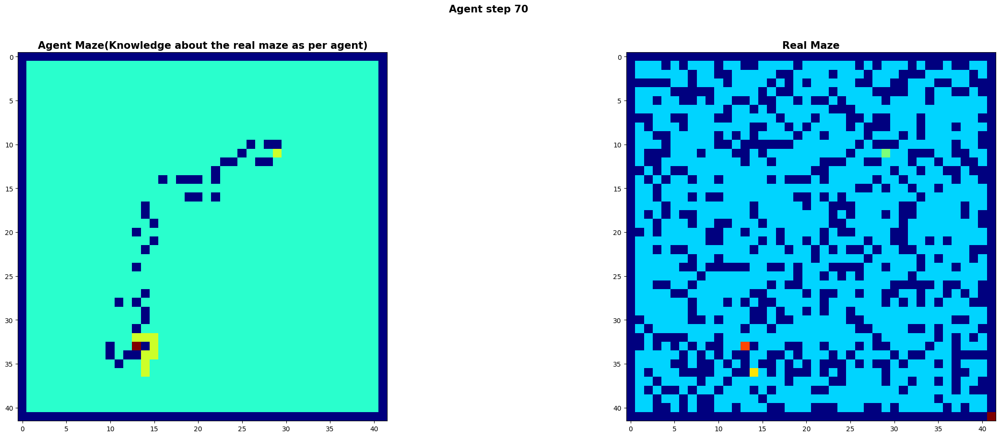

<Figure size 2000x2000 with 0 Axes>

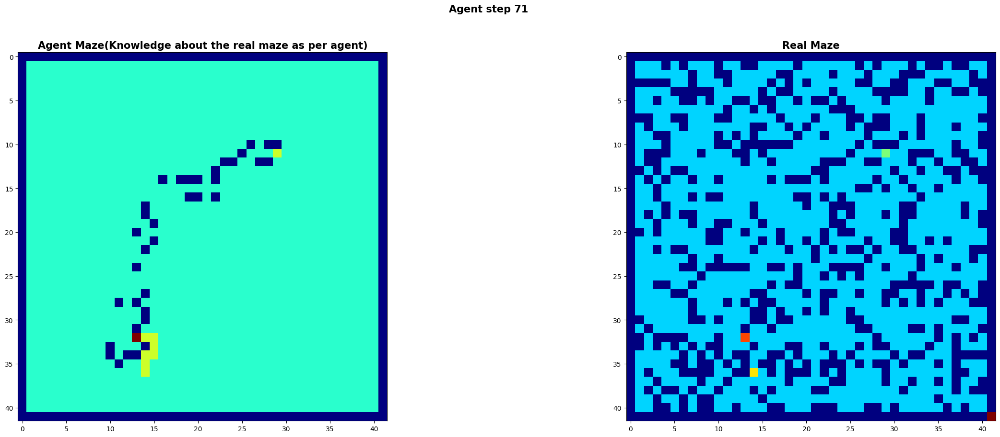

<Figure size 2000x2000 with 0 Axes>

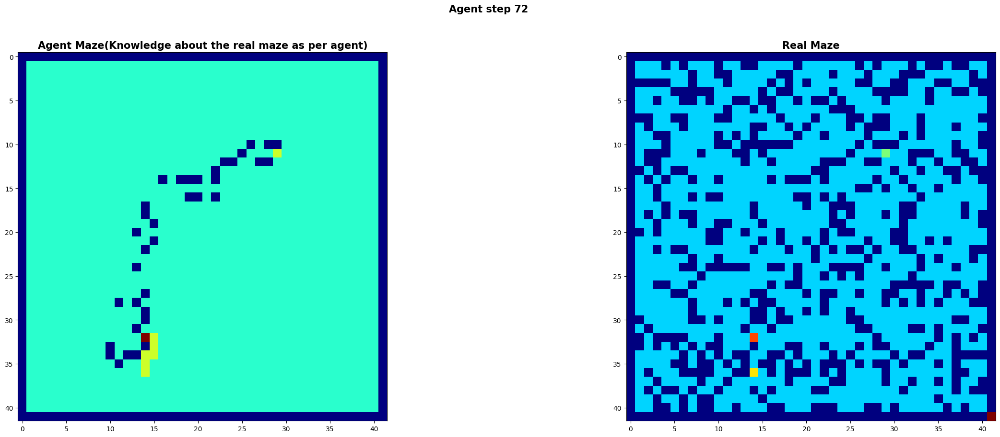

<Figure size 2000x2000 with 0 Axes>

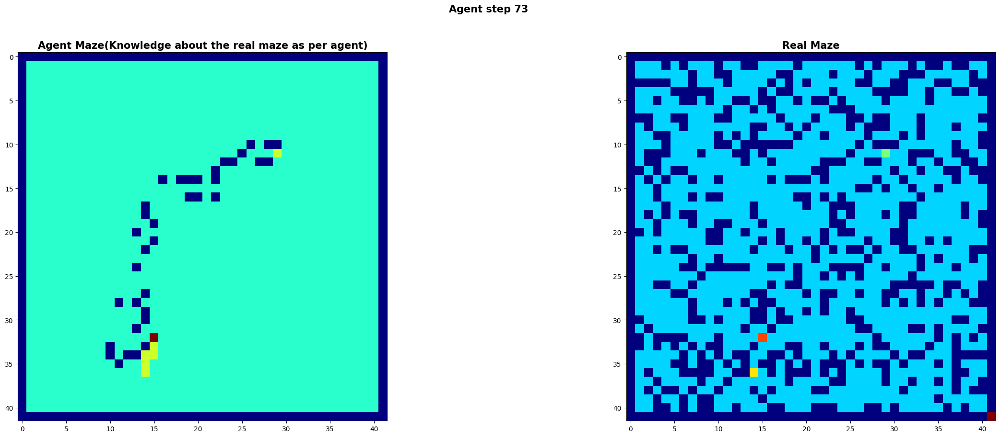

<Figure size 2000x2000 with 0 Axes>

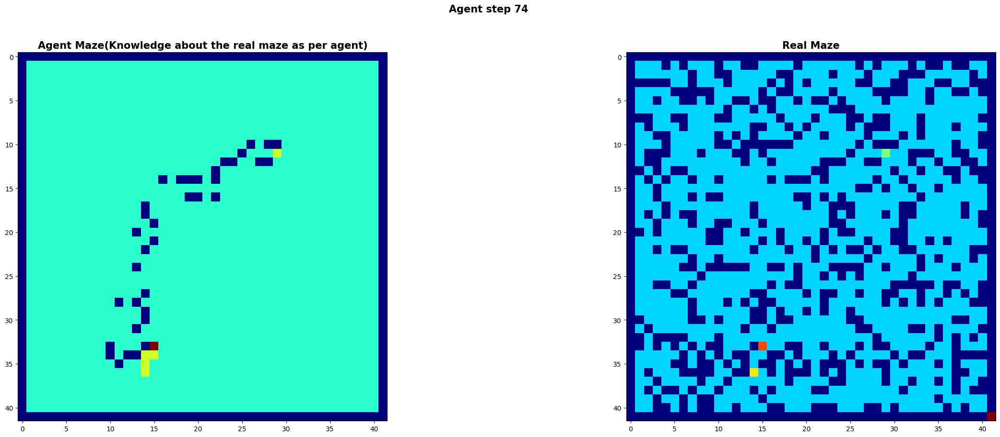

<Figure size 2000x2000 with 0 Axes>

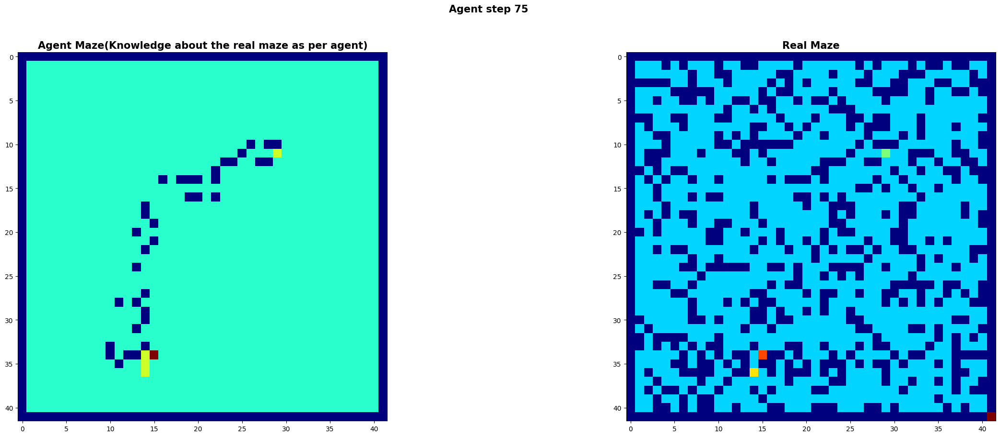

<Figure size 2000x2000 with 0 Axes>

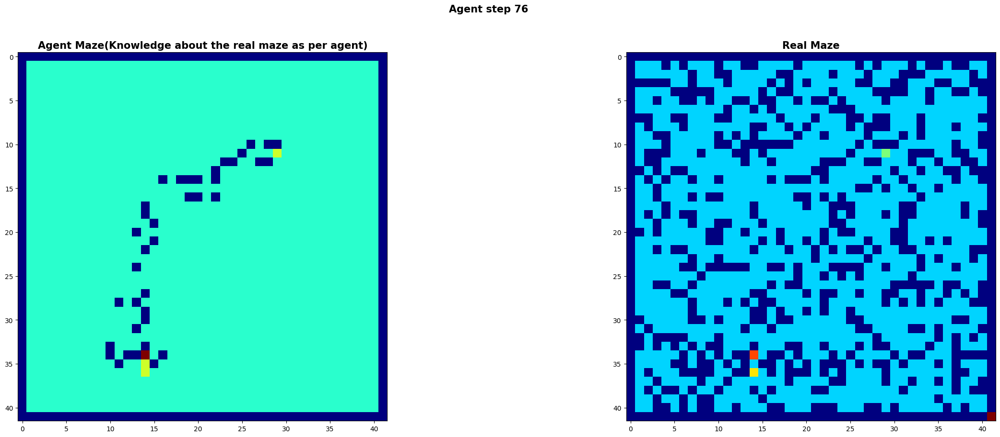

<Figure size 2000x2000 with 0 Axes>

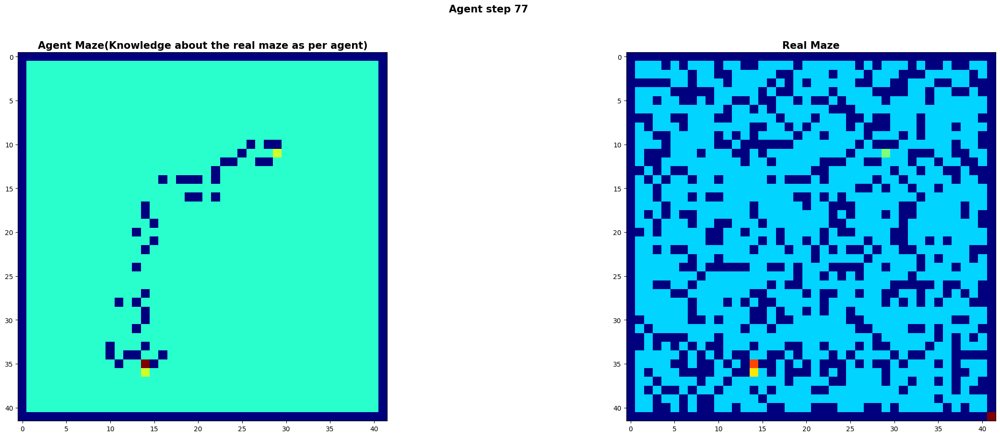

Reached the end point


336

In [21]:
def repeated_forward_A_star(Environment_plus,size_of_matrix,plot):

    Environment, start_point, end_point = Environment_plus
    

    G = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
    G_closed_list = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
    F = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
    H = heuristic_maze(101,end_point)
    expanded_counter = 0

    agent_maze = np.full((size_of_matrix, size_of_matrix),2)
    agent_maze = np.pad(agent_maze, [(1, 1), (1, 1)], mode='constant')
    agent_maze[start_point] = 3
    agent_maze[end_point] = 4

    counter = 0
    point = start_point

    while(point!= end_point):
        
        current_start_point = point
        came_from = a_star(agent_maze,point,end_point,H,G,F,G_closed_list)
        expanded_counter += np.isfinite(G_closed_list).sum()

        if plot == True:
            step_plot(agent_maze,G_closed_list,current_start_point,end_point,came_from)
        
        if came_from == False:
            print("Path not possible")
            break
        path = get_path(came_from,current_start_point,end_point)
        

        while(point!= end_point):
            counter+=1
            type_ = 'repeated'
            if plot == True:
                path_step_plot(agent_maze,point,counter,type_,Environment,H,G_closed_list,path)
            next_point = path.pop(0)
            mapping_func(point,Environment,agent_maze)
            if agent_maze[next_point] == 0:
                agent_maze[next_point] = 0
                G = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
                F = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
                G_closed_list = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
                break
            point = next_point

    if point == end_point and plot == True:
        print("Reached the end point")
    
    return expanded_counter
    
repeated_forward_A_star(env_plus,size_of_matrix,plot = True)

# Repeated forward A* with smaller g priority tie breaking

In [ ]:
def repeated_forward_A_star_small_G_priority(Environment_plus,size_of_matrix,plot):

    Environment, start_point, end_point = Environment_plus
    

    G = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
    G_closed_list = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
    F = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
    H = heuristic_maze(101,end_point)
    expanded_counter = 0

    agent_maze = np.full((size_of_matrix, size_of_matrix),2)
    agent_maze = np.pad(agent_maze, [(1, 1), (1, 1)], mode='constant')
    agent_maze[start_point] = 3
    agent_maze[end_point] = 4

    counter = 0
    point = start_point

    while(point!= end_point):
        
        current_start_point = point
        came_from = a_star_small_G_pref(agent_maze,point,end_point,H,G,F,G_closed_list)
        expanded_counter += np.isfinite(G_closed_list).sum()

        
        if came_from == False:
            print("Path not possible")
            break
        path = get_path(came_from,current_start_point,end_point)
        

        while(point!= end_point):
            counter+=1
            type_ = 'repeated'
            if plot == True:
                path_step_plot(agent_maze,point,counter,type_,Environment,H,G_closed_list,path)
            next_point = path.pop(0)
            mapping_func(point,Environment,agent_maze)
            if agent_maze[next_point] == 0:
                agent_maze[next_point] = 0
                G = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
                F = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
                G_closed_list = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
                break
            point = next_point

    if point == end_point and plot == True:
        print("Reached the end point")
    
    return expanded_counter
    
repeated_forward_A_star_small_G_priority(Environment_set[36],size_of_matrix,plot = False)

# 

# Adaptive A*

<Figure size 2000x2000 with 0 Axes>

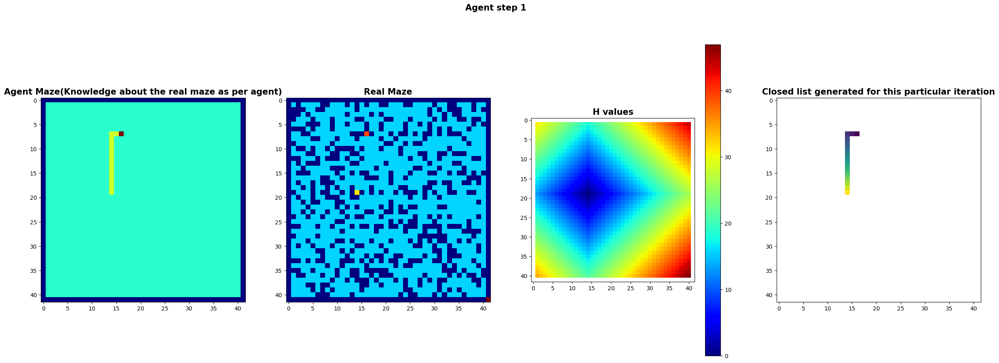

<Figure size 2000x2000 with 0 Axes>

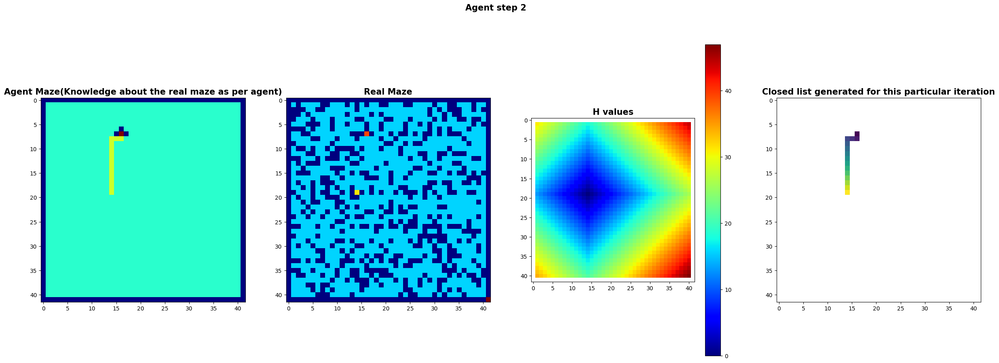

<Figure size 2000x2000 with 0 Axes>

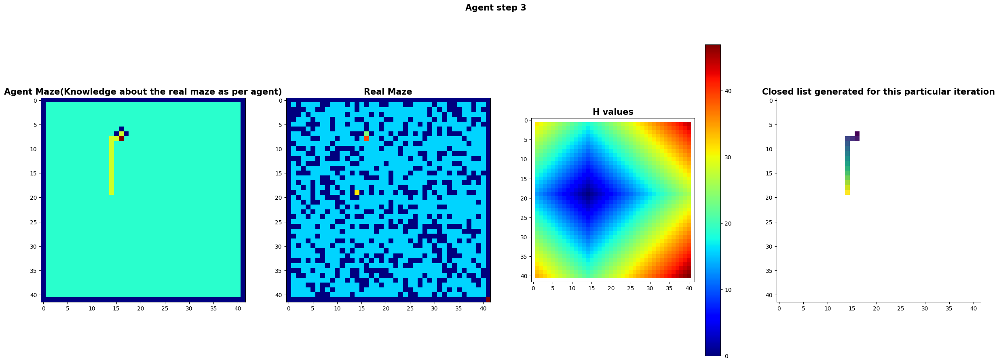

<Figure size 2000x2000 with 0 Axes>

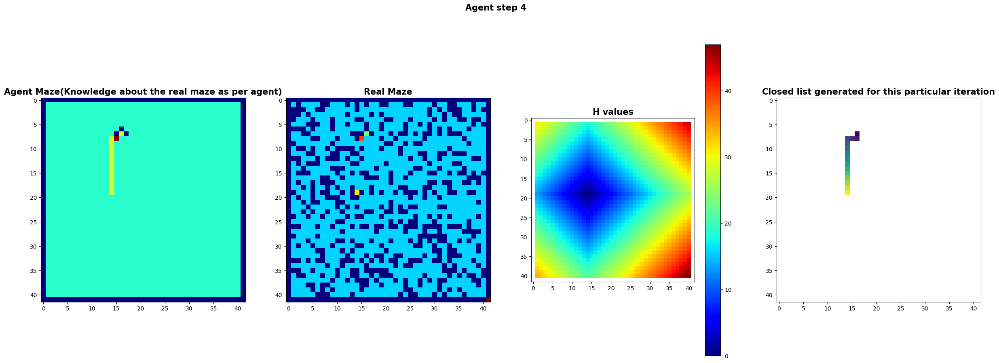

<Figure size 2000x2000 with 0 Axes>

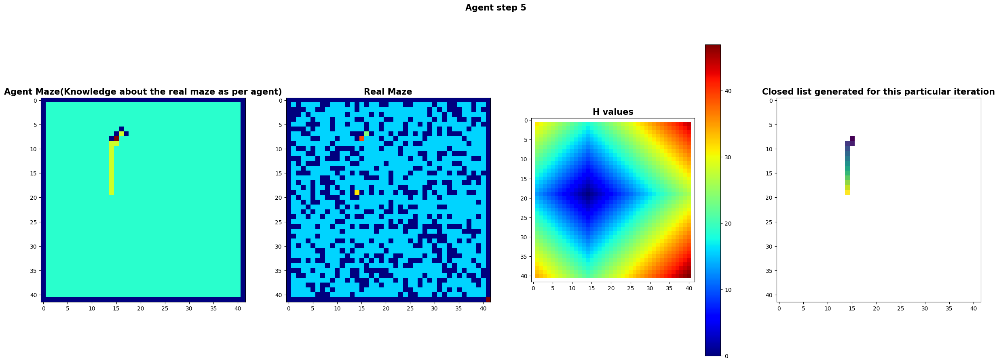

<Figure size 2000x2000 with 0 Axes>

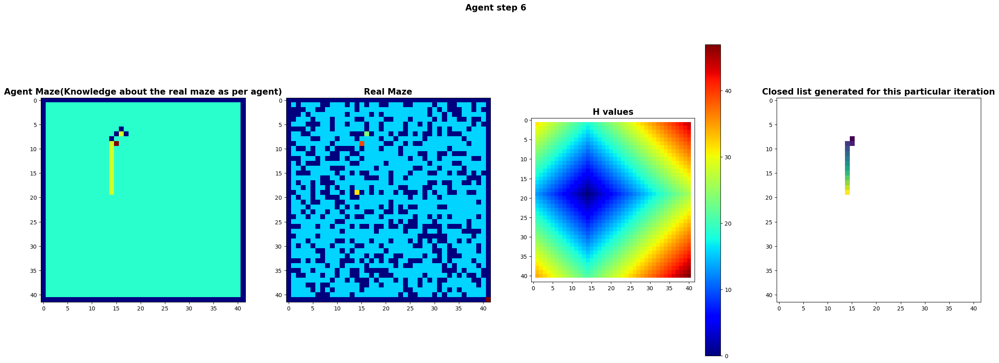

<Figure size 2000x2000 with 0 Axes>

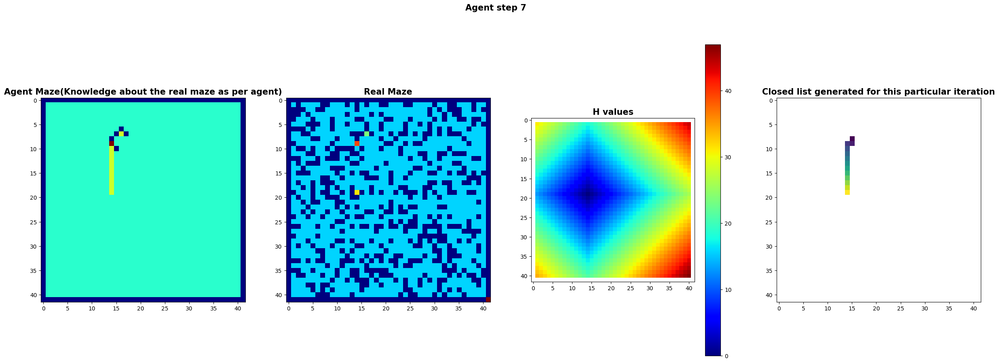

<Figure size 2000x2000 with 0 Axes>

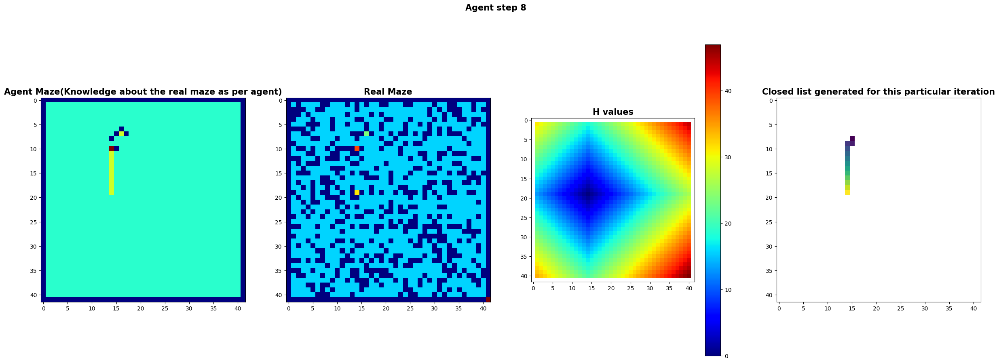

<Figure size 2000x2000 with 0 Axes>

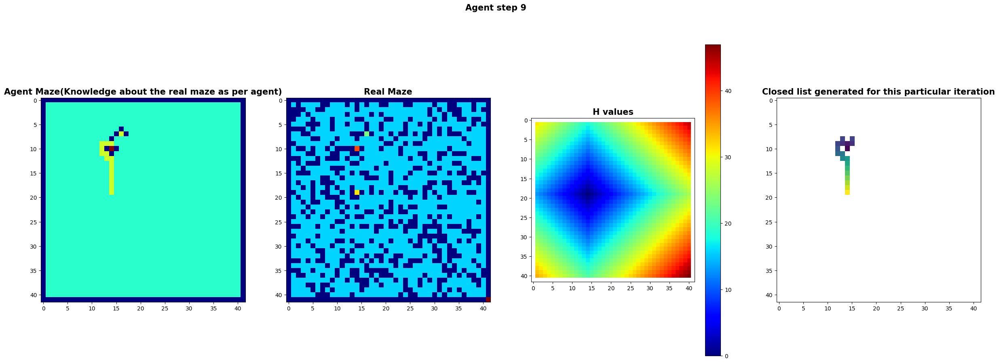

<Figure size 2000x2000 with 0 Axes>

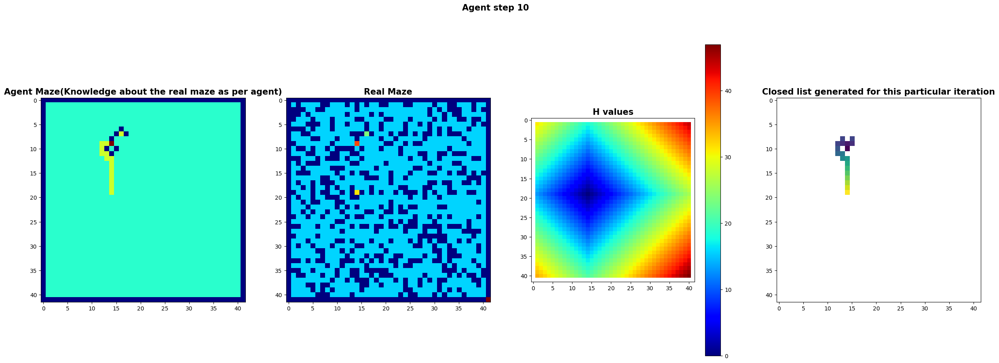

<Figure size 2000x2000 with 0 Axes>

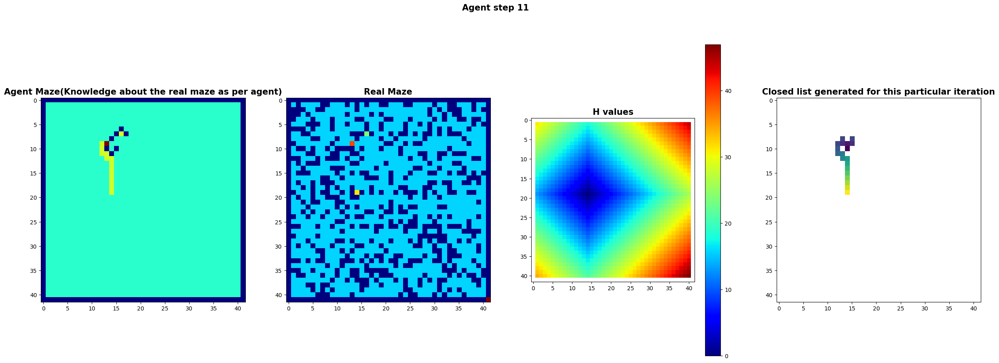

<Figure size 2000x2000 with 0 Axes>

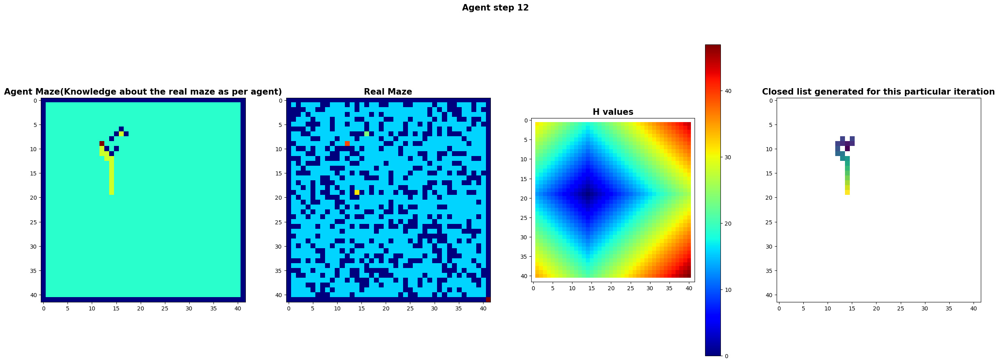

<Figure size 2000x2000 with 0 Axes>

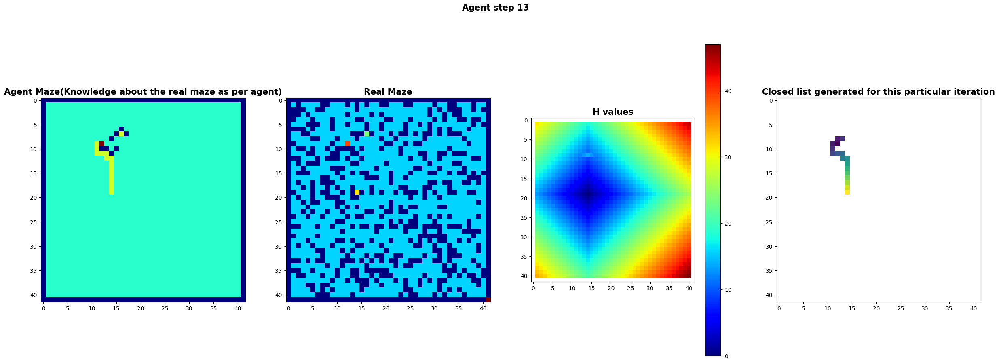

<Figure size 2000x2000 with 0 Axes>

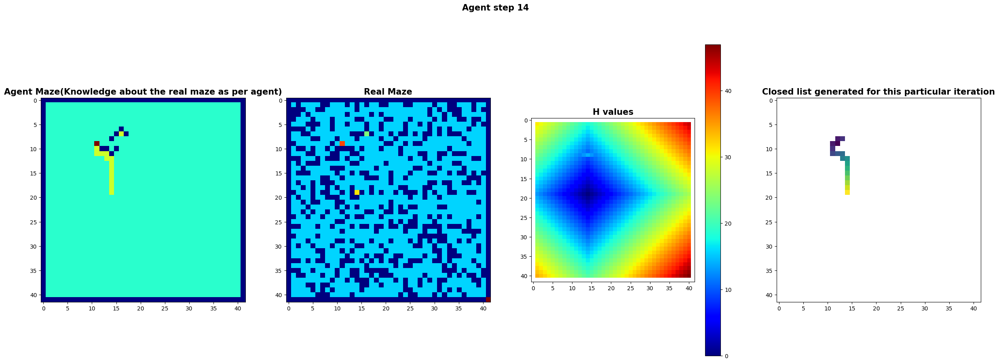

<Figure size 2000x2000 with 0 Axes>

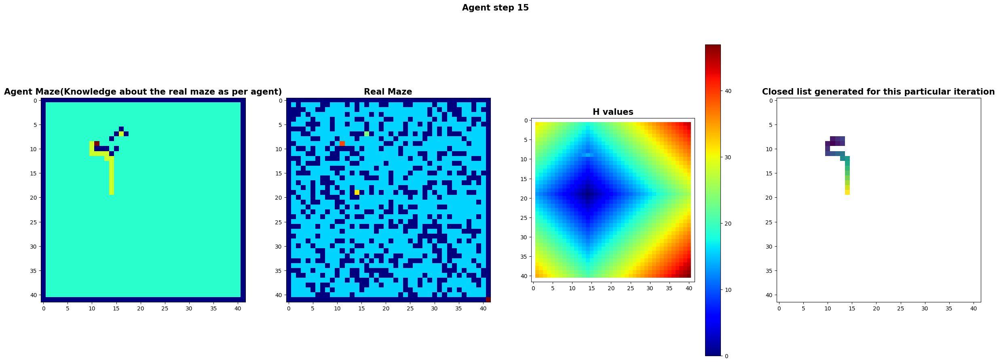

<Figure size 2000x2000 with 0 Axes>

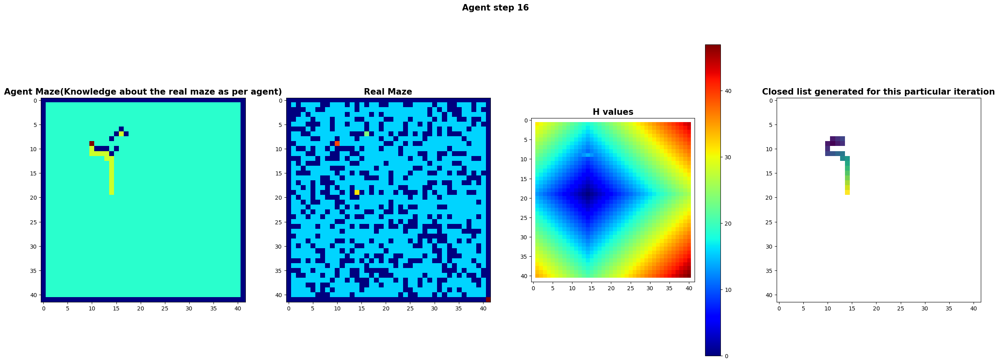

<Figure size 2000x2000 with 0 Axes>

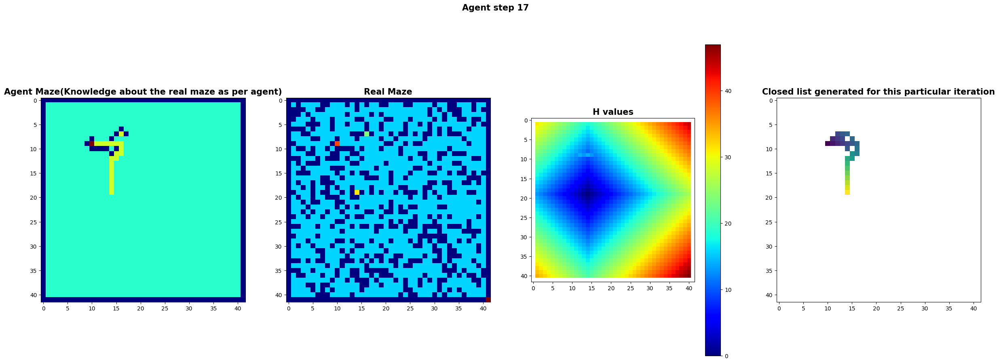

<Figure size 2000x2000 with 0 Axes>

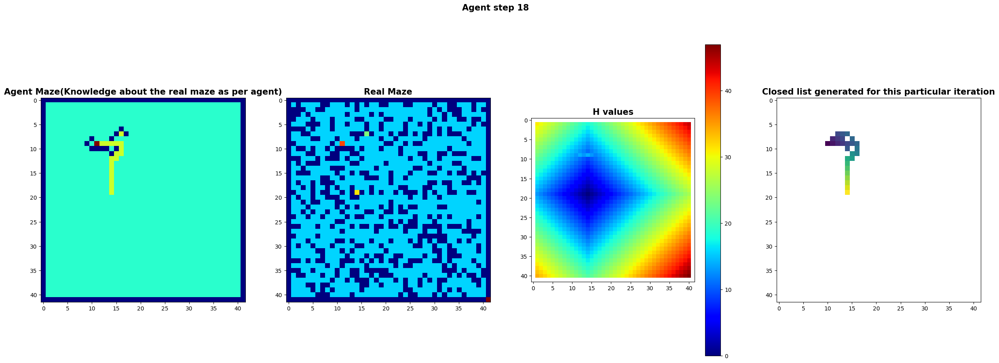

<Figure size 2000x2000 with 0 Axes>

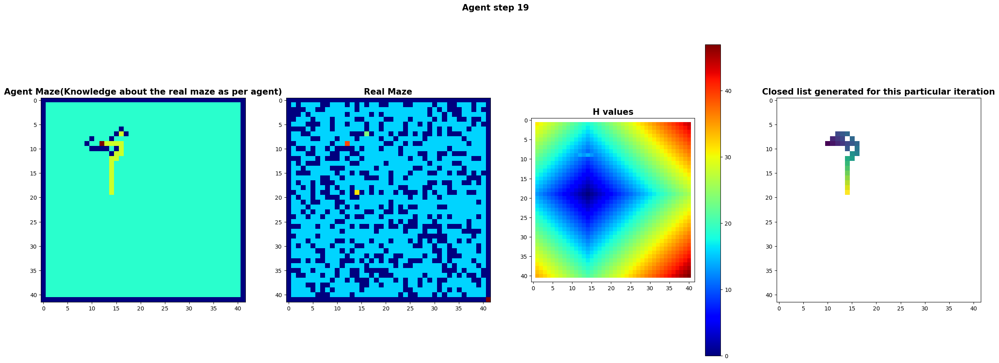

<Figure size 2000x2000 with 0 Axes>

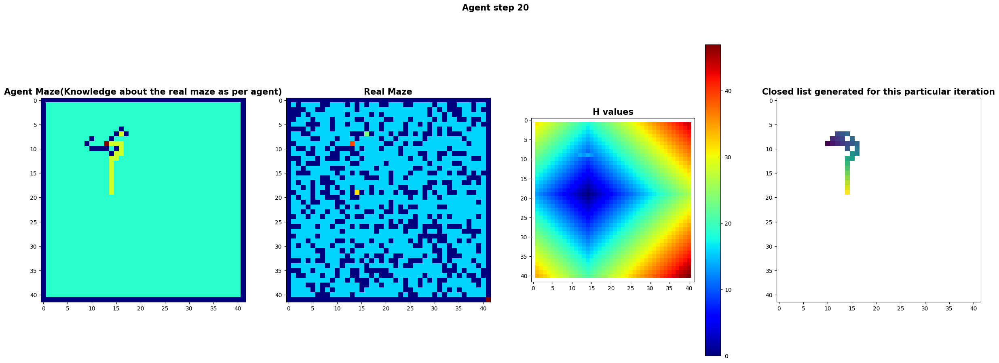

<Figure size 2000x2000 with 0 Axes>

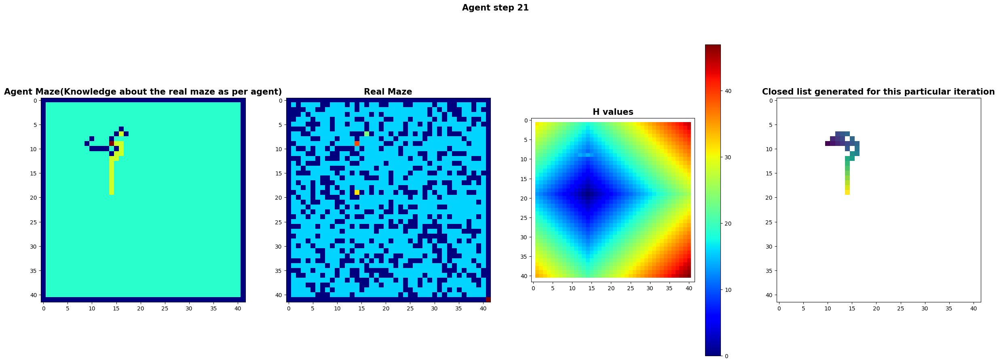

<Figure size 2000x2000 with 0 Axes>

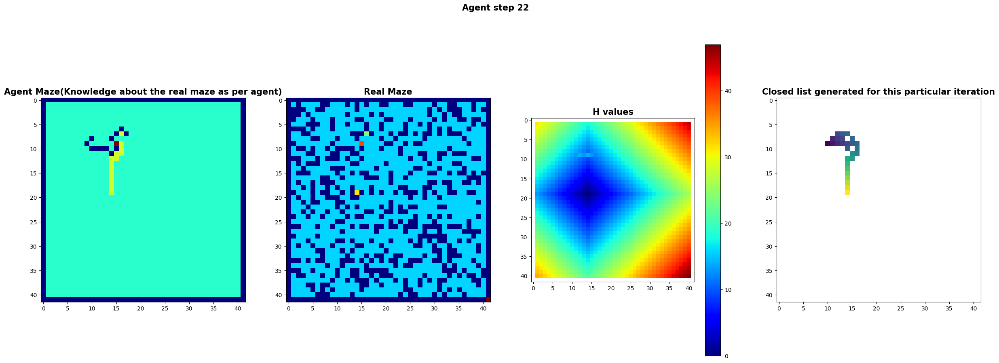

<Figure size 2000x2000 with 0 Axes>

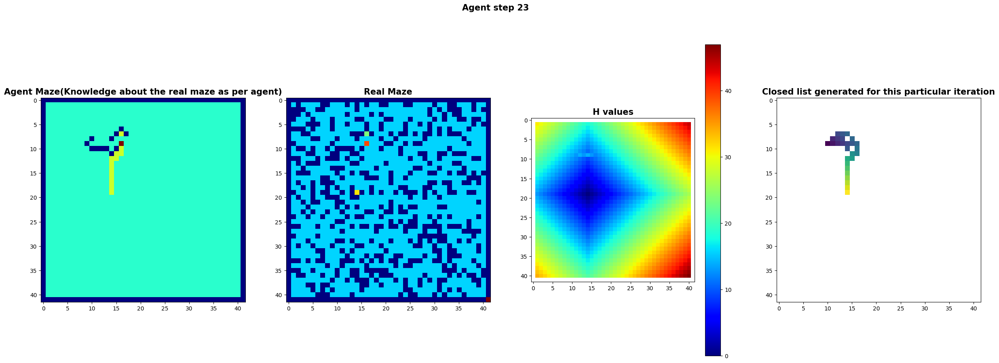

<Figure size 2000x2000 with 0 Axes>

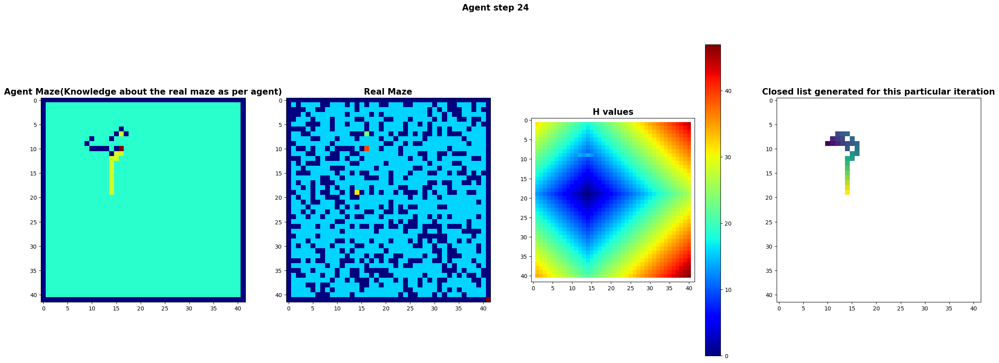

<Figure size 2000x2000 with 0 Axes>

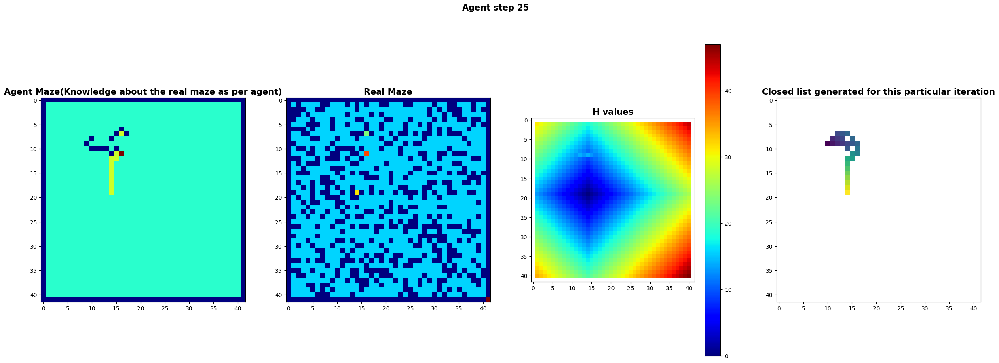

<Figure size 2000x2000 with 0 Axes>

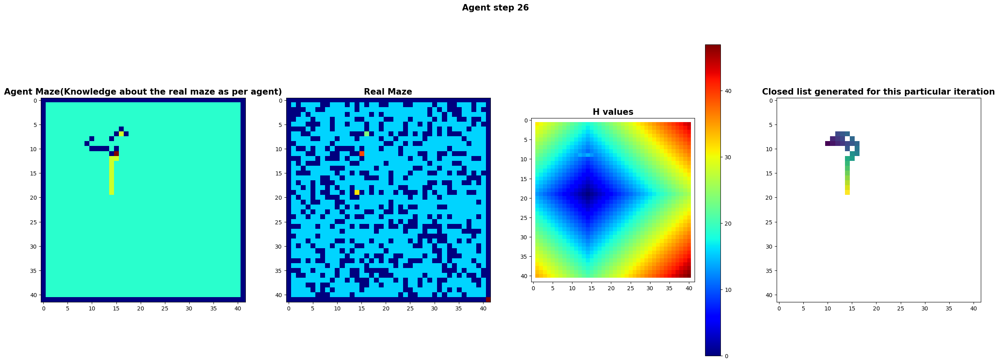

<Figure size 2000x2000 with 0 Axes>

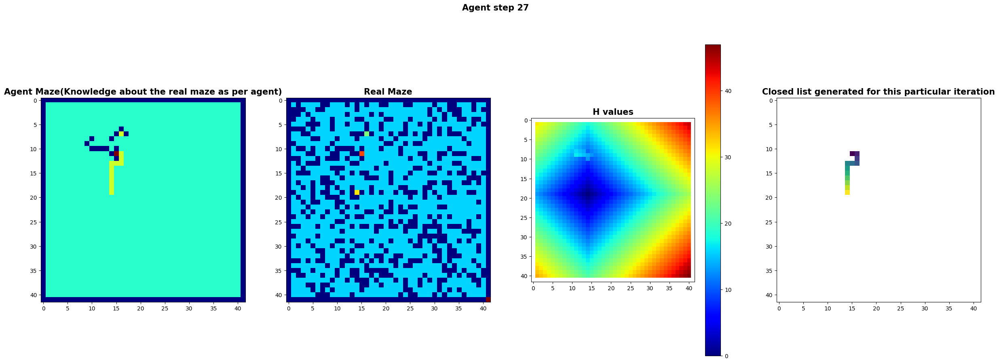

<Figure size 2000x2000 with 0 Axes>

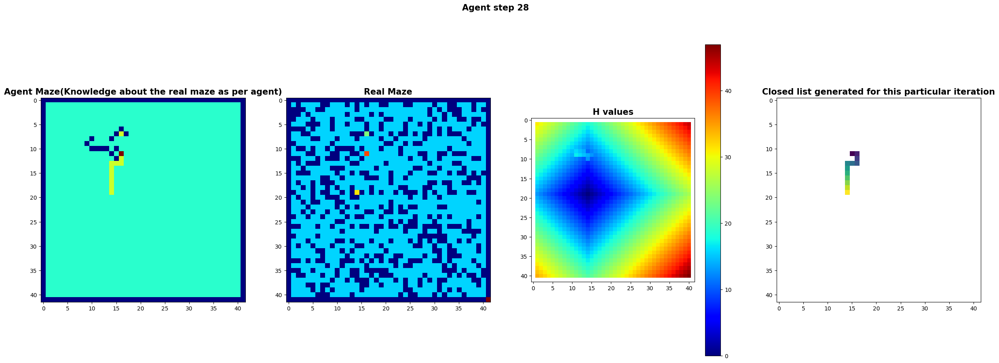

<Figure size 2000x2000 with 0 Axes>

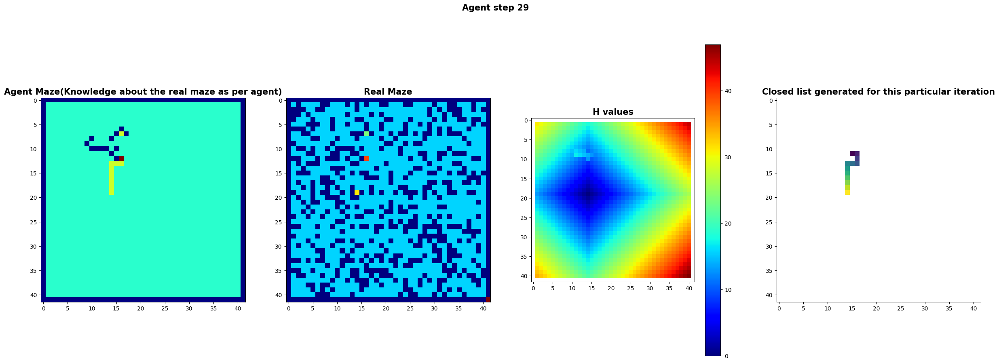

<Figure size 2000x2000 with 0 Axes>

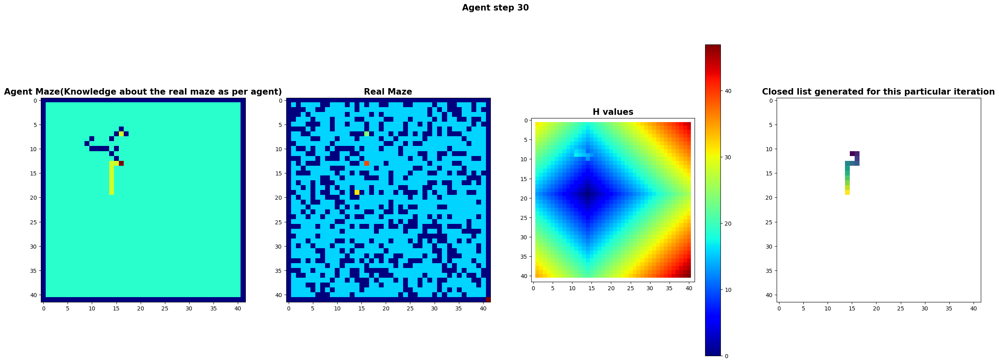

<Figure size 2000x2000 with 0 Axes>

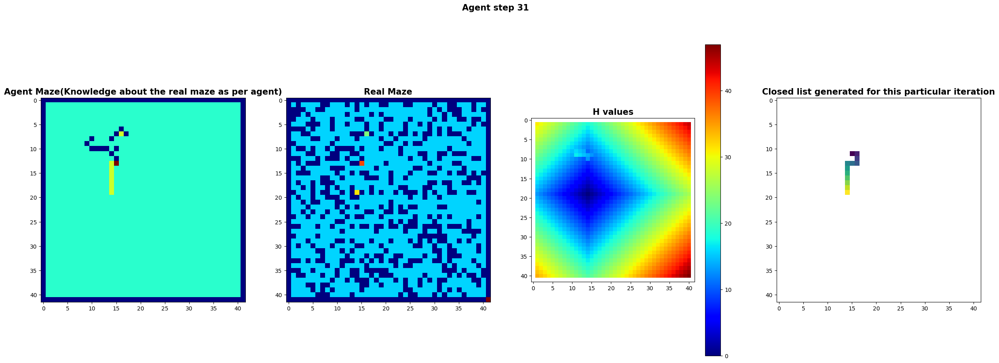

<Figure size 2000x2000 with 0 Axes>

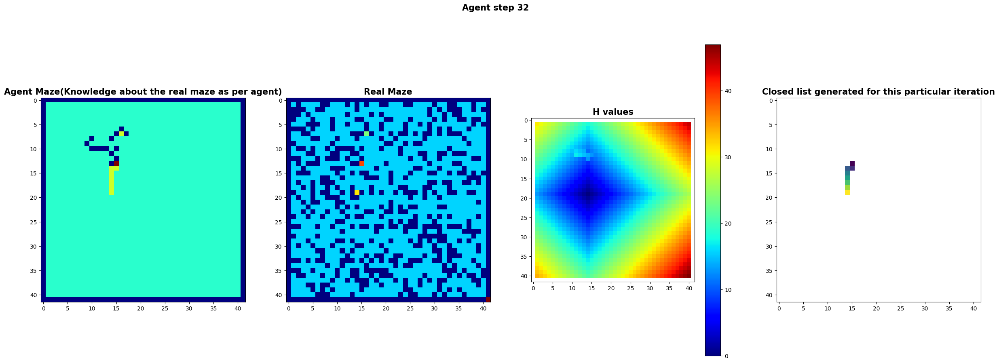

<Figure size 2000x2000 with 0 Axes>

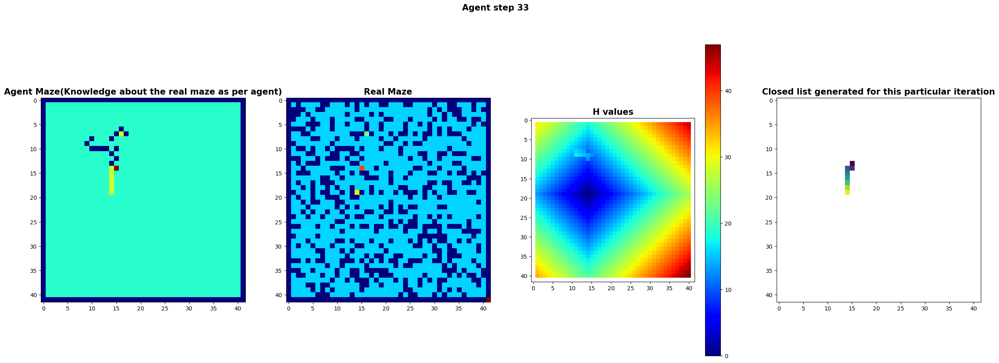

<Figure size 2000x2000 with 0 Axes>

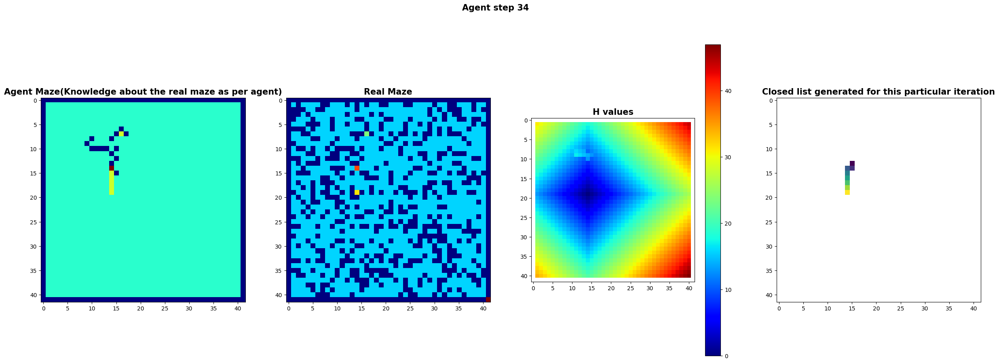

<Figure size 2000x2000 with 0 Axes>

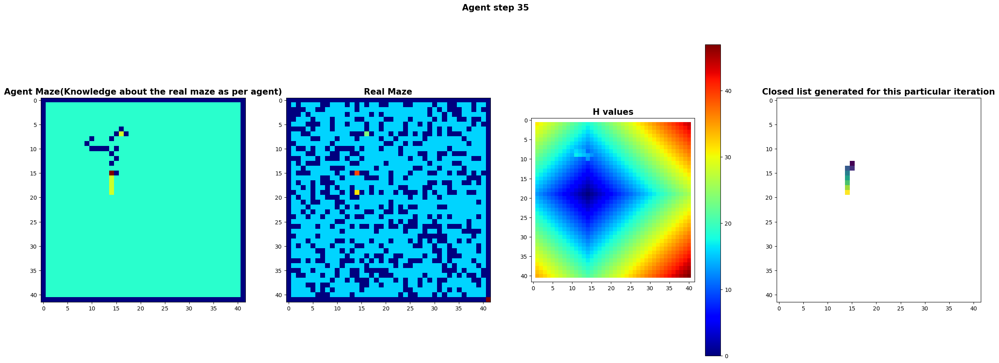

<Figure size 2000x2000 with 0 Axes>

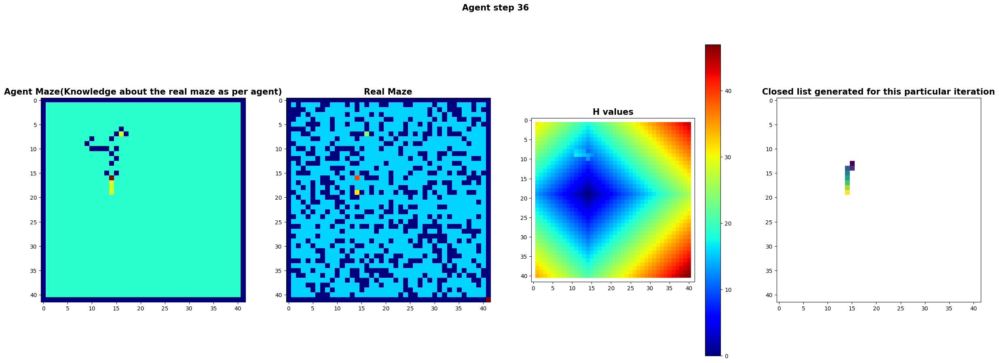

<Figure size 2000x2000 with 0 Axes>

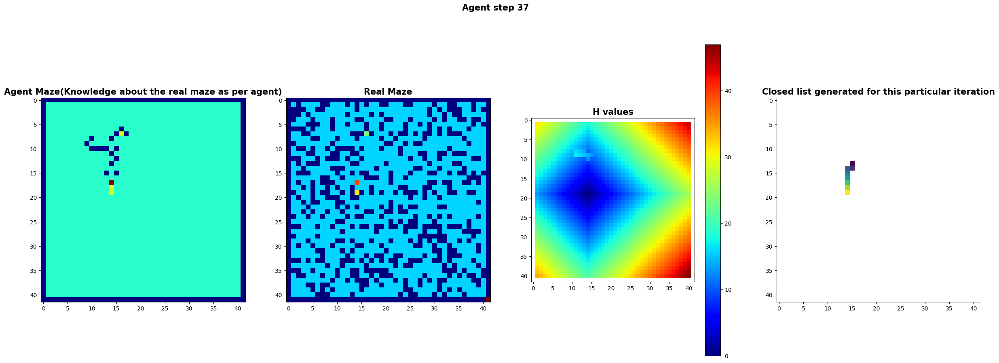

<Figure size 2000x2000 with 0 Axes>

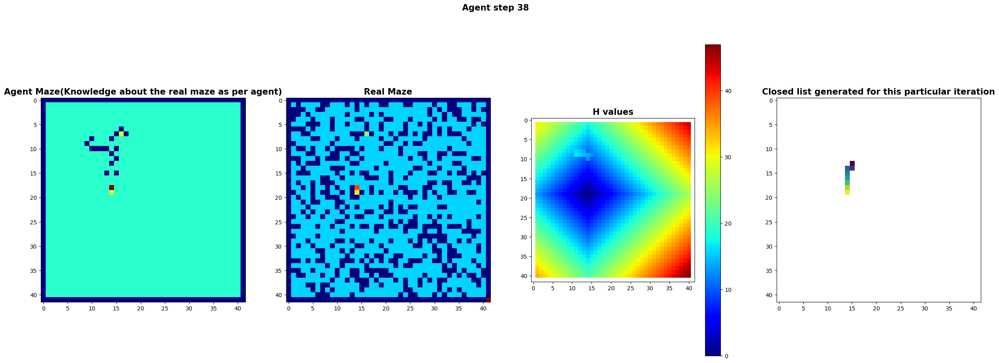

Reached the end point


147

In [22]:


def Adaptive_A_star(Environment_plus,size_of_matrix,plot):
  
    Environment, start_point, end_point = Environment_plus
    

    G = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
    G_closed_list = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
    F = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
    H = heuristic_maze(size_of_matrix,end_point)
    

    agent_maze = np.full((size_of_matrix, size_of_matrix),2)
    agent_maze = np.pad(agent_maze, [(1, 1), (1, 1)], mode='constant')
    agent_maze[start_point] = 3
    agent_maze[end_point] = 4
    expanded_counter = 0

    point = start_point
    counter = 0

    while(point!= end_point):
        
        came_from = a_star(agent_maze,point,end_point,H,G,F,G_closed_list)
        expanded_counter += np.isfinite(G_closed_list).sum()
        
        #print(expanded_counter)
        if came_from == False:
            print("Path not possible")
            break
        path = get_path(came_from,point,end_point)

        while(point!= end_point):
            counter += 1
            type_ = 'adaptive'
            if plot == True:
                path_step_plot(agent_maze,point,counter,type_,Environment,H,G_closed_list,path)
            
            next_point = path.pop(0)
            #print('current_point',point)
            #print('next_point - ',next_point )
            mapping_func(point,Environment,agent_maze)
            if agent_maze[next_point] == 0:
                
                
                G_closed_list[G_closed_list == np.inf] = 0
                G_closed_list[G_closed_list != 0] = G_closed_list[end_point] - G_closed_list[G_closed_list != 0]
                H[G_closed_list != 0 ] = G_closed_list[G_closed_list != 0]

                G_closed_list = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
                G = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
                F = np.full((size_of_matrix+2, size_of_matrix+2),np.inf)
                break
            point = next_point

    if point == end_point and plot == True:
        print("Reached the end point")

    return expanded_counter
        
        
Adaptive_A_star(Environment_set[36],size_of_matrix,plot = True)

# comparisons and stats

In [30]:
'''
This functions runs a Algorithm 50 times and get expanded cells values for each Environment
'''
def statsticgeneration(Environment_set,size_of_matrix,name,function):
    stats = []
    print(name)
    for i in range(50):
    
        val = function(Environment_set[i],size_of_matrix,False)
        stats.append(val)
    
    df = pd.DataFrame(stats)

    return df

In [31]:
dict_of_function = {
                        'repeated_forward_A_star'                  : repeated_forward_A_star,
                        'repeated_forward_A_star_small_G_priority' : repeated_forward_A_star_small_G_priority,
                        'repeated_backward_A_star'                 : repeated_backward_A_star,
                        'Adaptive_A_star'                          : Adaptive_A_star
                    }

In [32]:
df = pd.DataFrame()
for name,function in dict_of_function.items():
    df[name] = statsticgeneration(Environment_set,size_of_matrix,name,function)

repeated_forward_A_star
Path not possible
repeated_forward_A_star_small_G_priority
Path not possible
repeated_backward_A_star
Path not possible
Adaptive_A_star
Path not possible


In [33]:
#use this to get stats value of expanded cells for different algorithms
stats = df.describe()
stats

,repeated_forward_A_star,repeated_forward_A_star_small_G_priority,repeated_backward_A_star,Adaptive_A_star
count,50.000000,50.00000,50.000000,50.000000
mean,1571.520000,10354.80000,5909.080000,1514.100000
std,2027.387746,12245.85822,6583.764325,1931.490355
min,71.000000,159.00000,108.000000,71.000000
25%,396.750000,1561.25000,886.000000,393.500000
50%,1105.500000,5904.50000,3682.000000,1079.000000
75%,1974.750000,13044.25000,8744.500000,1969.000000
max,12772.000000,50922.00000,27422.000000,12469.000000


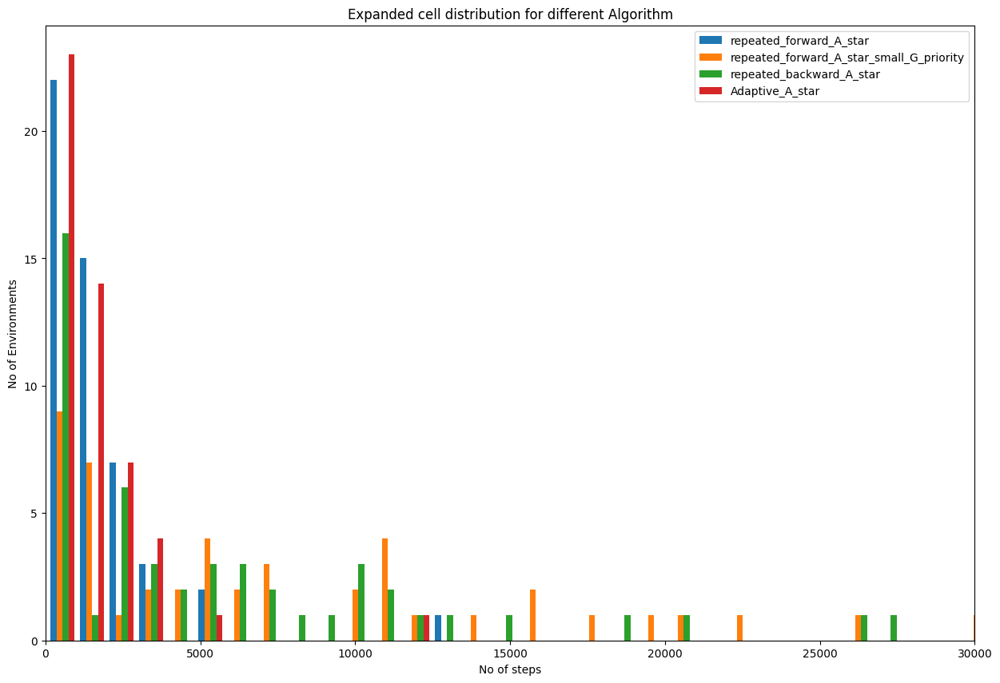

In [34]:
plt.figure(figsize = (15,10))
plt.hist(df[df < 50000],label= df.columns,bins = 50)
plt.xlim([0, 30000])
plt.title('Expanded cell distribution for different Algorithm')
plt.legend()
plt.xlabel('No of steps')
plt.ylabel('No of Environments')
plt.savefig('Expanded_cell.jpg')
plt.show()

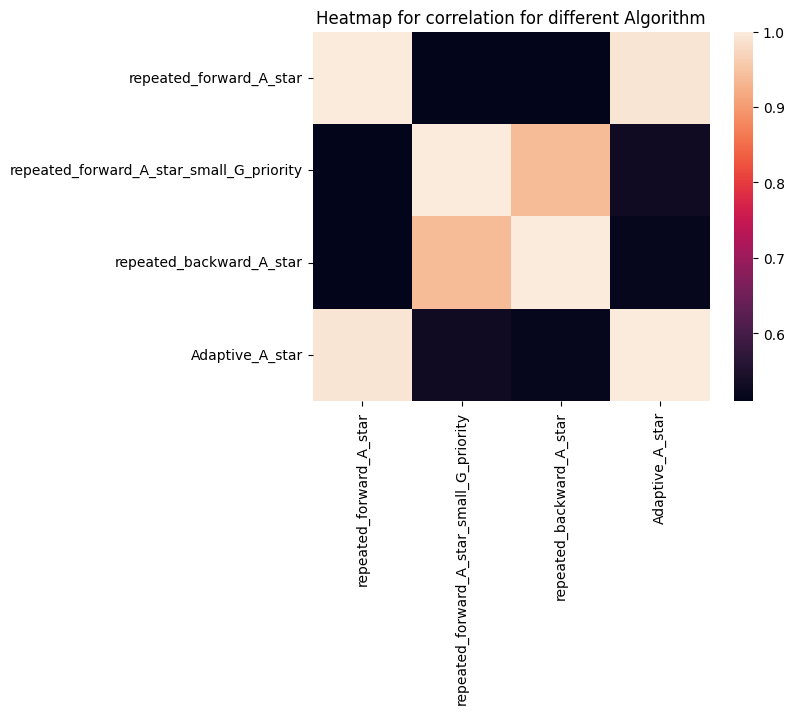

In [35]:
sns.heatmap(df.corr()).set_title("Heatmap for correlation for different Algorithm")
plt.savefig("Heatmap.jpg")

In [36]:
'''
This functions runs a Algorithm 50 times and get runtime values for each Environment
'''
def timestatstictimegeneration(Environment_set,size_of_matrix,name,function):
    stats = []
    print(name)
    for i in range(50):
        start = time.perf_counter()
        val = function(Environment_set[i],size_of_matrix,False)
        stop = time.perf_counter()
        stats.append(stop - start)
    
    df = pd.DataFrame(stats)

    return df

In [37]:
df = pd.DataFrame()
for name,function in dict_of_function.items():
    df[name] = timestatstictimegeneration(Environment_set,size_of_matrix,name,function)

repeated_forward_A_star
Path not possible
repeated_forward_A_star_small_G_priority
Path not possible
repeated_backward_A_star
Path not possible
Adaptive_A_star
Path not possible


In [38]:
#use this to get stats value of runtime value for different algorithms
df.describe()

,repeated_forward_A_star,repeated_forward_A_star_small_G_priority,repeated_backward_A_star,Adaptive_A_star
count,50.000000,50.000000,50.000000,50.000000
mean,0.087582,0.558043,0.580179,0.121017
std,0.359482,0.900296,0.700294,0.528664
min,0.004788,0.006451,0.020305,0.004958
25%,0.010478,0.028845,0.105892,0.013480
50%,0.025508,0.156027,0.303912,0.036473
75%,0.053808,0.584204,0.782122,0.066575
max,2.565914,3.736232,3.000303,3.773426
